In [28]:
import os
import gc
import sys
import h5py
import numpy as np
import pandas as pd
import random
from glob import glob
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer

# ---------------------------------------------
# CONFIGURATION
# ---------------------------------------------
GENERATED_DATA_DIR = "generated_data"  # Path to data_0_exponential, etc.
EMBEDDINGS_DIRS = {
    "bert":         "embeddings",
    "roberta":      "embeddings",
    "gatortron":    "embeddings",
    "t5":           "embeddings",
    "ernie":        "embeddings",
    "minilm":       "embeddings",
    "e5_small":     "embeddings_e5_small",
    "llama":        "embeddings_llama"
}

CLUSTER_RESULTS_PATH = "cluster_similarity_results.csv"
OUTPUT_DATA_DIR = "generated_data_with_clusters"  
# Directory to write updated CSVs that contain new cluster columns

PROGRESS_FILE = "cluster_assignment_progress.csv"
# We'll store partial progress here. 

# Save after processing every N datasets
CHECKPOINT_INTERVAL = 5

# Whether to ask if we want to "redo" or "resume" on existing progress
ASK_ON_RESTART = True


In [29]:
def load_datasets_info(data_dir):
    """
    Return a dict of {dataset_name -> (num_rows, num_cols, num_cat_vars)} 
    for each CSV in data_dir having data_... pattern.
    """
    info_dict = {}
    csv_files = glob(os.path.join(data_dir, "*.csv"))
    
    for csv_path in csv_files:
        filename = os.path.basename(csv_path)
        dataset_name = os.path.splitext(filename)[0]  # e.g. 'data_0_exponential'
        
        df = pd.read_csv(csv_path)
        n_rows, n_cols = df.shape
        
        # Count categorical variables
        cat_count = sum(
            (df[col].dtype == "object") or (str(df[col].dtype) == "category")
            for col in df.columns
        )
        
        info_dict[dataset_name] = (n_rows, n_cols, cat_count)
    
    return info_dict

def augment_cluster_results(cluster_csv, data_info):
    """
    Adds two columns to cluster_csv: 
        - 'NumCategoricalVars'
        - 'SubjectVariableRatio' (n_rows / n_cols)
    using data_info dict from load_datasets_info().
    
    Returns a DataFrame with the new columns appended.
    """
    df_clusters = pd.read_csv(cluster_csv)
    
    # Create columns with default (in case some dataset is missing)
    df_clusters["NumCategoricalVars"] = np.nan
    df_clusters["SubjectVariableRatio"] = np.nan
    
    # Populate these columns
    for idx, row in df_clusters.iterrows():
        dataset_name = row["Dataset"]  # e.g. data_79_quadratic
        if dataset_name in data_info:
            n_rows, n_cols, cat_count = data_info[dataset_name]
            df_clusters.at[idx, "NumCategoricalVars"] = cat_count
            df_clusters.at[idx, "SubjectVariableRatio"] = n_rows / n_cols

    return df_clusters

# --- Run these steps ---------------------------------
data_info_dict = load_datasets_info(GENERATED_DATA_DIR)
df_clusters_aug = augment_cluster_results(CLUSTER_RESULTS_PATH, data_info_dict)

# Optionally overwrite or save to a new CSV
df_clusters_aug.to_csv("cluster_similarity_results_augmented.csv", index=False)
print("Augmented cluster_similarity_results.csv saved.")


Augmented cluster_similarity_results.csv saved.


In [26]:
import gc
from sklearn.preprocessing import StandardScaler

def get_k_for_model(dataset_name, model_name, df_clusters_aug):
    """
    Returns the number of clusters to use for (dataset_name, model_name)
    by looking at the 'Adjusted Clusters (Embeddings)' column 
    in df_clusters_aug.
    
    If not found, defaults to some value (e.g., 5).
    """
    subset = df_clusters_aug[
        (df_clusters_aug["Dataset"] == dataset_name) &
        (df_clusters_aug["Model"] == model_name)
    ]
    if subset.empty:
        # fallback
        return 5
    else:
        return int(subset["Adjusted Clusters (Embeddings)"].values[0])

def load_embeddings(dataset_name, model_name):
    """
    Loads the embeddings for a given dataset_name and model_name
    from the correct directory. Model -> directory logic is defined 
    in EMBEDDINGS_DIRS.

    Returns a 2D numpy array [n_samples, embedding_dim].
    If model is 'llama', we handle .h5 differently.
    """
    base_dir = EMBEDDINGS_DIRS[model_name]
    
    if model_name == "llama":
        # .h5 file; search for a file containing dataset_name
        emb_files = glob(os.path.join(base_dir, f"*{dataset_name}*.h5"))
        if not emb_files:
            return None
        filepath = emb_files[0]
        with h5py.File(filepath, 'r') as h5f:
            embeddings = h5f['embeddings'][:]
    elif model_name == "e5_small":
        # .npy file with name "embeddings_e5_small_data_..._something.npy"
        emb_files = glob(os.path.join(base_dir, f"embeddings_e5_small_{dataset_name}*.npy"))
        if not emb_files:
            return None
        filepath = emb_files[0]
        embeddings = np.load(filepath)
    elif model_name == "minilm":
        emb_files = glob(os.path.join(base_dir, f"embeddings_minilm_{dataset_name}*.npy"))
        if not emb_files:
            return None
        filepath = emb_files[0]
        embeddings = np.load(filepath)
    else:
        # 'bert', 'roberta', 'gatortron', 't5', 'ernie' all typically "embeddings_{model}_{dataset}.npy"
        emb_files = glob(os.path.join(base_dir, f"embeddings_{model_name}_{dataset_name}*.npy"))
        if not emb_files:
            return None
        filepath = emb_files[0]
        embeddings = np.load(filepath)
    
    # Ensure embeddings are 2D
    if embeddings.ndim > 2:
        embeddings = embeddings.reshape(embeddings.shape[0], -1)
    
    return embeddings

def load_progress():
    """
    Loads the progress file (if it exists) and returns a set of
    (dataset_name, model_name) pairs that have been processed.
    """
    if not os.path.exists(PROGRESS_FILE):
        return set()
    progress_df = pd.read_csv(PROGRESS_FILE)
    processed_pairs = set(zip(progress_df["Dataset"], progress_df["Model"]))
    return processed_pairs

def save_progress(processed_pairs):
    """
    Saves the set of processed (dataset, model) pairs to PROGRESS_FILE
    as a CSV with columns [Dataset, Model].
    """
    df = pd.DataFrame(list(processed_pairs), columns=["Dataset", "Model"])
    df.to_csv(PROGRESS_FILE, index=False)

def ask_resume_or_restart():
    """
    If ASK_ON_RESTART is True, ask the user if they want to resume 
    or restart the entire process. If 'resume', we keep the progress.
    If 'restart', we clear it.
    """
    if not ASK_ON_RESTART:
        return  # do nothing
    
    if os.path.exists(PROGRESS_FILE):
        choice = input("Progress file detected. Type 'resume' to continue or 'restart' to delete progress: ")
        choice = choice.strip().lower()
        if choice == "restart":
            os.remove(PROGRESS_FILE)
            print("Progress has been reset.")

def assign_clusters_to_data(df_clusters_aug):
    """
    Main function that loops over each dataset CSV in generated_data,
    for each relevant model in cluster_similarity_results, 
    loads embeddings, fits KMeans with the appropriate number of clusters, 
    and assigns cluster labels back to the CSV (for each row).
    
    Outputs a new CSV in OUTPUT_DATA_DIR containing the cluster columns.
    """
    # Make sure output dir exists
    if not os.path.exists(OUTPUT_DATA_DIR):
        os.makedirs(OUTPUT_DATA_DIR)
    
    processed_pairs = load_progress()  # set of (dataset, model) done
    ask_resume_or_restart()
    
    # Re-check if user decided to "restart"
    processed_pairs = load_progress()  
    
    # We'll gather the set of (dataset, model) we need from df_clusters_aug
    needed_pairs = set(zip(df_clusters_aug["Dataset"], df_clusters_aug["Model"]))
    
    # Group cluster info by dataset, so we only open each dataset CSV once
    dataset_to_models = {}
    for ds_name, model in needed_pairs:
        dataset_to_models.setdefault(ds_name, []).append(model)
    
    csv_files = glob(os.path.join(GENERATED_DATA_DIR, "*.csv"))
    # We only handle dataset CSVs that appear in dataset_to_models
    csv_map = {}
    for path in csv_files:
        base = os.path.splitext(os.path.basename(path))[0]
        if base in dataset_to_models:
            csv_map[base] = path
    
    count_processed_in_this_batch = 0
    
    # Start iterating
    for ds_name, csv_path in csv_map.items():
        print(f"\n--- Loading dataset: {ds_name} ---")
        df_data = pd.read_csv(csv_path)
        
        # For each model that we need to process
        models_for_ds = dataset_to_models[ds_name]
        for model_name in models_for_ds:
            pair_key = (ds_name, model_name)
            if pair_key in processed_pairs:
                print(f"   Skipping {ds_name} - {model_name}, already processed.")
                continue
            
            print(f"   Processing model = {model_name} ...")
            
            # Load embeddings
            embeddings = load_embeddings(ds_name, model_name)
            if embeddings is None or embeddings.size == 0:
                print(f"   ⚠️ No embeddings found for {ds_name} (Model: {model_name}). Skipping.")
                continue
            
            # Get number of clusters from the augmented CSV
            k_clusters = get_k_for_model(ds_name, model_name, df_clusters_aug)
            print(f"   Using k = {k_clusters} for KMeans.")
            
            # Impute if needed
            embeddings = SimpleImputer(strategy="mean").fit_transform(embeddings)
            
            # Optionally scale
            embeddings = StandardScaler().fit_transform(embeddings)
            
            # Fit KMeans
            kmeans = KMeans(n_clusters=k_clusters, random_state=42, n_init=10)
            labels = kmeans.fit_predict(embeddings)
            
            # Assign cluster labels to the DataFrame
            # Ensure we have the same row count
            if len(labels) == len(df_data):
                df_data[f"cluster_{model_name}"] = labels
            else:
                print(f"   ⚠️ Embeddings length ({len(labels)}) != Data length ({len(df_data)}). Skipping.")
                continue
            
            # Mark progress
            processed_pairs.add(pair_key)
            count_processed_in_this_batch += 1
            
            # Memory cleanup
            del embeddings, kmeans, labels
            gc.collect()
        
        # After processing all models for this dataset, 
        # write out the updated DataFrame to OUTPUT_DATA_DIR
        out_csv_path = os.path.join(OUTPUT_DATA_DIR, f"{ds_name}.csv")
        df_data.to_csv(out_csv_path, index=False)
        print(f"   ✅ Wrote clusters to {out_csv_path}")
        
        # Check if we should checkpoint
        if count_processed_in_this_batch >= CHECKPOINT_INTERVAL:
            save_progress(processed_pairs)
            count_processed_in_this_batch = 0
            print(f"   [Checkpoint] Progress saved. If needed, you can safely stop and resume later.")
    
    # Final save of any leftover progress
    save_progress(processed_pairs)
    print("All done. Final progress saved.")


In [30]:
if __name__ == "__main__":
    # Step 1: Load dataset info & augment the cluster results
    data_info_dict = load_datasets_info(GENERATED_DATA_DIR)
    df_clusters_aug = augment_cluster_results(CLUSTER_RESULTS_PATH, data_info_dict)
    df_clusters_aug.to_csv("cluster_similarity_results_augmented.csv", index=False)
    print("Augmented cluster_similarity_results.csv saved.")

    # Step 2: Assign clusters
    assign_clusters_to_data(df_clusters_aug)


Augmented cluster_similarity_results.csv saved.

--- Loading dataset: data_79_quadratic ---
   Processing model = gatortron ...
   Using k = 10 for KMeans.
   Processing model = roberta ...
   Using k = 10 for KMeans.
   Processing model = ernie ...
   Using k = 10 for KMeans.
   Processing model = minilm ...
   Using k = 10 for KMeans.
   Processing model = llama ...
   Using k = 10 for KMeans.
   Processing model = t5 ...
   Using k = 10 for KMeans.
   Processing model = e5_small ...
   ⚠️ No embeddings found for data_79_quadratic (Model: e5_small). Skipping.
   Processing model = bert ...
   Using k = 10 for KMeans.
   ✅ Wrote clusters to generated_data_with_clusters/data_79_quadratic.csv
   [Checkpoint] Progress saved. If needed, you can safely stop and resume later.

--- Loading dataset: data_91_linear ---
   Processing model = e5_small ...
   ⚠️ No embeddings found for data_91_linear (Model: e5_small). Skipping.
   Processing model = roberta ...
   Using k = 10 for KMeans.
   Pro

## Llama clusters

In [31]:
import os
import pandas as pd
import numpy as np
import h5py
from glob import glob
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Adjust these paths as needed
DATA_DIR = "generated_data"
EMBEDDINGS_LLAMA_DIR = "embeddings_llama"
OUTPUT_DIR = "generated_data_with_llama_clusters"

# Ensure output directory exists
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

def find_llama_embedding_file(dataset_name):
    """
    Looks in EMBEDDINGS_LLAMA_DIR for a file that has `dataset_name`
    in its filename and ends with '.h5'.
    
    Returns the path if found, otherwise None.
    """
    llama_files = glob(os.path.join(EMBEDDINGS_LLAMA_DIR, f"*{dataset_name}*.h5"))
    if llama_files:
        return llama_files[0]
    else:
        return None

def assign_llama_clusters_to_dataset(dataset_name, num_clusters=5):
    """
    1. Loads the dataset CSV from DATA_DIR.
    2. Finds the corresponding Llama .h5 embeddings in EMBEDDINGS_LLAMA_DIR.
    3. Applies KMeans(n_clusters=num_clusters) to the embeddings.
    4. Creates a new column 'cluster_llama' in the DataFrame with the labels.
    5. Saves the updated CSV to OUTPUT_DIR.
    """
    csv_path = os.path.join(DATA_DIR, f"{dataset_name}.csv")
    if not os.path.exists(csv_path):
        print(f"❌ No CSV found for {dataset_name}.")
        return

    # Load the dataset
    df = pd.read_csv(csv_path)
    print(f"Loaded {dataset_name}.csv with shape {df.shape}.")

    # Find and load Llama embeddings
    llama_path = find_llama_embedding_file(dataset_name)
    if not llama_path:
        print(f"⚠️ No Llama embeddings found for {dataset_name}. Skipping.")
        return

    print(f"Loading Llama embeddings from {llama_path} ...")
    with h5py.File(llama_path, "r") as h5f:
        embeddings = h5f["embeddings"][:]

    if embeddings.ndim > 2:
        embeddings = embeddings.reshape(embeddings.shape[0], -1)

    if embeddings.shape[0] != len(df):
        print(f"⚠️ Mismatch in number of rows ({embeddings.shape[0]} vs {len(df)}). Skipping.")
        return

    # Impute any missing values and optionally scale
    embeddings = SimpleImputer(strategy="mean").fit_transform(embeddings)
    embeddings = StandardScaler().fit_transform(embeddings)

    # Fit KMeans
    print(f"Fitting KMeans with k={num_clusters} for {dataset_name} (Llama).")
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(embeddings)

    # Insert cluster labels into DataFrame
    df["cluster_llama"] = labels

    # Save the updated DataFrame
    out_path = os.path.join(OUTPUT_DIR, f"{dataset_name}.csv")
    df.to_csv(out_path, index=False)
    print(f"✅ Wrote updated CSV (with cluster_llama) to {out_path}.\n")

# -------------------------------------------------------------------
# Example driver code to loop over your data_XX_yyy CSVs
# Adjust `num_clusters` or adopt a logic to read from a results file.
# -------------------------------------------------------------------
def main():
    # For example, gather all CSVs in DATA_DIR named 'data_...'
    csv_files = glob(os.path.join(DATA_DIR, "data_*_*.csv"))
    
    # Suppose you want a fixed K for all, or you read from a dictionary
    K_DEFAULT = 5  
    
    for csv_file in csv_files:
        ds_name = os.path.splitext(os.path.basename(csv_file))[0]  # e.g. "data_10_linear"
        # Here, we just use a default K=5 for demonstration.
        # If you have a table that stores the "Adjusted Clusters (Embeddings)" for Llama,
        # you can retrieve that number in place of K_DEFAULT.
        assign_llama_clusters_to_dataset(ds_name, num_clusters=K_DEFAULT)

if __name__ == "__main__":
    main()


Loaded data_79_quadratic.csv with shape (500, 35).
Loading Llama embeddings from embeddings_llama/embeddings_data_79_quadratic.h5 ...
Fitting KMeans with k=5 for data_79_quadratic (Llama).
✅ Wrote updated CSV (with cluster_llama) to generated_data_with_llama_clusters/data_79_quadratic.csv.

Loaded data_91_linear.csv with shape (500, 41).
Loading Llama embeddings from embeddings_llama/embeddings_data_91_linear.h5 ...
Fitting KMeans with k=5 for data_91_linear (Llama).
✅ Wrote updated CSV (with cluster_llama) to generated_data_with_llama_clusters/data_91_linear.csv.

Loaded data_44_exponential.csv with shape (500, 21).
Loading Llama embeddings from embeddings_llama/embeddings_data_44_exponential.h5 ...
Fitting KMeans with k=5 for data_44_exponential (Llama).
✅ Wrote updated CSV (with cluster_llama) to generated_data_with_llama_clusters/data_44_exponential.csv.

Loaded data_42_linear.csv with shape (500, 21).
Loading Llama embeddings from embeddings_llama/embeddings_data_42_linear.h5 ...


## Merge llama and other clusters

In [32]:
import os
import pandas as pd

LLAMA_DIR = "generated_data_with_llama_clusters"    # Contains CSVs with cluster_llama
CLUSTERS_DIR = "generated_data_with_clusters"       # Destination files to update in-place

def merge_llama_clusters():
    # List all CSV files in LLAMA_DIR
    llama_files = [f for f in os.listdir(LLAMA_DIR) if f.endswith(".csv")]
    
    for file in llama_files:
        llama_path = os.path.join(LLAMA_DIR, file)
        clusters_path = os.path.join(CLUSTERS_DIR, file)
        
        # Skip if no corresponding file in CLUSTERS_DIR
        if not os.path.exists(clusters_path):
            print(f"Skipping {file}: not found in {CLUSTERS_DIR}.")
            continue

        # Read both dataframes
        df_llama = pd.read_csv(llama_path)
        df_clusters = pd.read_csv(clusters_path)
        
        # Check that cluster_llama column exists
        if "cluster_llama" not in df_llama.columns:
            print(f"Skipping {file}: no 'cluster_llama' column found.")
            continue
        
        # Check row alignment
        if len(df_llama) != len(df_clusters):
            print(f"Skipping {file}: row count mismatch ({len(df_llama)} vs {len(df_clusters)}).")
            continue
        
        # Append cluster_llama to the main cluster file
        df_clusters["cluster_llama"] = df_llama["cluster_llama"].values
        
        # Overwrite the updated file in CLUSTERS_DIR
        df_clusters.to_csv(clusters_path, index=False)
        print(f"Appended cluster_llama to {clusters_path}.")

if __name__ == "__main__":
    merge_llama_clusters()


Appended cluster_llama to generated_data_with_clusters/data_79_quadratic.csv.
Appended cluster_llama to generated_data_with_clusters/data_91_linear.csv.
Appended cluster_llama to generated_data_with_clusters/data_44_exponential.csv.
Appended cluster_llama to generated_data_with_clusters/data_42_linear.csv.
Appended cluster_llama to generated_data_with_clusters/data_88_exponential.csv.
Appended cluster_llama to generated_data_with_clusters/data_43_linear.csv.
Appended cluster_llama to generated_data_with_clusters/data_48_cubic.csv.
Appended cluster_llama to generated_data_with_clusters/data_13_cubic.csv.
Appended cluster_llama to generated_data_with_clusters/data_33_quadratic.csv.
Appended cluster_llama to generated_data_with_clusters/data_84_cubic.csv.
Appended cluster_llama to generated_data_with_clusters/data_74_linear.csv.
Appended cluster_llama to generated_data_with_clusters/data_21_quadratic.csv.
Appended cluster_llama to generated_data_with_clusters/data_40_exponential.csv.
Appe

## LLM assisted vs unassisted machine learning linear regression step one linear regression

In [13]:
import os
import numpy as np
import pandas as pd
from glob import glob

# For regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_absolute_error

# For transformations
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# SHAP for feature importance
import shap

# -----------------------------------------------------
# CONFIG
# -----------------------------------------------------
DATA_DIR = "generated_data_with_clusters"   # Directory with your CSV data
OUTPUT_DIR = "numeric_x3_results"          # Where partial outputs go
UNASSISTED_FILE = "unassisted_model_results.csv"  # Final results
RANDOM_SEED = 42

REG_MODELS = {
    "LinearReg": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=RANDOM_SEED),
    "GradientBoost": GradientBoostingRegressor(random_state=RANDOM_SEED)
}

# Ensure output directory exists
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

def build_preprocessor(numeric_cols, cat_cols):
    """
    Builds preprocessing pipelines:
      1. Numeric: median imputer
      2. Categorical: most frequent imputer + OneHotEncoder
    """
    numeric_pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy="median"))
    ])

    cat_pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("ohe", OneHotEncoder(handle_unknown="ignore"))
    ])

    column_tf = ColumnTransformer([
        ("num", numeric_pipeline, numeric_cols),
        ("cat", cat_pipeline, cat_cols)
    ])
    return column_tf

def evaluate_regression_models(X, y, numeric_cols, cat_cols):
    """
    Evaluates models using appropriate metrics:
      - R² for Linear Regression (higher is better)
      - MAE for Random Forest & Gradient Boosting (lower is better)
    Returns the best model and its performance.
    """
    preprocessor = build_preprocessor(numeric_cols, cat_cols)
    X_enc = preprocessor.fit_transform(X, y)

    if hasattr(X_enc, "toarray"):
        X_enc = X_enc.toarray()
    X_enc = X_enc.astype(np.float32)

    X_train_enc, X_test_enc, y_train, y_test = train_test_split(
        X_enc, y, test_size=0.3, random_state=RANDOM_SEED
    )

    best_model_name = None
    best_model_obj = None
    best_score = None

    for model_name, model in REG_MODELS.items():
        model.fit(X_train_enc, y_train)
        y_pred = model.predict(X_test_enc)

        if model_name == "LinearReg":
            score = r2_score(y_test, y_pred)  # Higher is better
            is_better = best_score is None or score > best_score
        else:
            score = mean_absolute_error(y_test, y_pred)  # Lower is better
            is_better = best_score is None or score < best_score

        if is_better:
            best_score = score
            best_model_name = model_name
            best_model_obj = model

    # Build final pipeline
    best_pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("model", best_model_obj)
    ])
    return best_model_name, best_score, best_pipeline

def compute_shap_top_features(best_pipeline, X, numeric_cols, cat_cols, top_n=10):
    """
    Computes top features using SHAP for feature importance.
    """
    prep = best_pipeline.named_steps["preprocessor"]
    model = best_pipeline.named_steps["model"]

    X_enc = prep.transform(X)
    if hasattr(X_enc, "toarray"):
        X_enc = X_enc.toarray()
    X_enc = X_enc.astype(np.float32)

    # Extract feature names
    try:
        cat_ohe = None
        for name, pipe, cols in prep.transformers_:
            if name == "cat":
                cat_ohe = pipe.named_steps["ohe"]

        if cat_ohe is not None:
            cat_feature_names = cat_ohe.get_feature_names_out(cat_cols)
        else:
            cat_feature_names = []

        numeric_feature_names = numeric_cols
        feature_names = list(numeric_feature_names) + list(cat_feature_names)

    except:
        feature_names = [f"feature_{i}" for i in range(X_enc.shape[1])]

    # Decide SHAP explainer
    model_type = type(model).__name__
    if model_type in ["RandomForestRegressor", "GradientBoostingRegressor"]:
        explainer = shap.TreeExplainer(model, feature_perturbation="interventional")
        shap_values = explainer.shap_values(X_enc, check_additivity=False)
    elif model_type == "LinearRegression":
        explainer = shap.LinearExplainer(model, X_enc)
        shap_values = explainer.shap_values(X_enc)
    else:
        background = shap.sample(X_enc, min(100, X_enc.shape[0]))
        explainer = shap.KernelExplainer(model.predict, background)
        shap_values = explainer.shap_values(X_enc)

    # Compute mean SHAP values
    if isinstance(shap_values, list):
        abs_shap = np.mean([np.abs(sv) for sv in shap_values], axis=0)
    else:
        abs_shap = np.abs(shap_values)

    mean_shap = abs_shap.mean(axis=0)
    sorted_idx = np.argsort(mean_shap)[::-1]
    top_n_idx = sorted_idx[:top_n]
    top_features = [feature_names[i] for i in top_n_idx]
    return top_features

def main():
    csv_files = glob(os.path.join(DATA_DIR, "*.csv"))
    if not csv_files:
        print(f"No CSV files in {DATA_DIR}.")
        return

    all_results = []

    for path in csv_files:
        ds_name = os.path.splitext(os.path.basename(path))[0]
        print(f"\n--- Processing dataset: {ds_name} ---")
        df = pd.read_csv(path)

        # Convert target and predictors to numeric
        for col in ["x1", "x2", "x3"]:
            if col in df.columns:
                df[col] = pd.to_numeric(df[col], errors="coerce")

        # Drop missing target variable x3
        if "x3" not in df.columns:
            print(f"   Skipping {ds_name}: no x3 found.")
            continue
        df = df.dropna(subset=["x3"])
        if df.empty:
            print(f"   Skipping {ds_name}: x3 all NaN.")
            continue

        # Identify categorical columns
        cat_cols = [c for c in df.columns if c.startswith("cat")]
        for c in cat_cols:
            df[c] = df[c].astype("category")

        # Remove rows missing x1 or x2
        df = df.dropna(subset=["x1", "x2"])
        if df.empty:
            print(f"   Skipping {ds_name}: x1 or x2 all NaN after drop.")
            continue

        # Identify numeric features
        numeric_cols = ["x1", "x2"]

        X = df[numeric_cols + cat_cols].copy()
        y = df["x3"].values

        # Evaluate models
        best_model_name, best_score, best_pipeline = evaluate_regression_models(
            X, y, numeric_cols, cat_cols
        )
        if best_model_name is None:
            print(f"   Skipping {ds_name}: no valid model or pipeline error.")
            continue

        print(f"   Best model: {best_model_name}, Score = {best_score:.4f}")

        top_feats = compute_shap_top_features(best_pipeline, X, numeric_cols, cat_cols, top_n=10)
        top_feats_str = ", ".join(top_feats)
        print(f"   Top 10 SHAP features: {top_feats_str}")

        all_results.append({
            "Dataset": ds_name,
            "BestModel": best_model_name,
            "Score": best_score,
            "TopFeatures": top_feats_str
        })

    results_df = pd.DataFrame(all_results)
    results_df.to_csv(os.path.join(OUTPUT_DIR, UNASSISTED_FILE), index=False)
    print(f"\n✅ Results saved to {OUTPUT_DIR}/{UNASSISTED_FILE}.")

if __name__ == "__main__":
    main()



--- Processing dataset: data_79_quadratic ---
   Best model: LinearReg, Score = -0.0974
   Top 10 SHAP features: cat4_Category_4_B, cat4_Category_4_A, cat8_Category_8_A, cat3_Category_3_B, cat32_Category_32_B, cat8_Category_8_B, cat3_Category_3_A, cat15_Category_15_A, cat19_Category_19_A, cat32_Category_32_A

--- Processing dataset: data_91_linear ---
   Best model: LinearReg, Score = 0.9396
   Top 10 SHAP features: cat3_Category_3_A, cat3_Category_3_B, cat19_Category_19_B, cat19_Category_19_A, cat31_Category_31_B, cat31_Category_31_A, cat38_Category_38_A, cat22_Category_22_A, cat23_Category_23_A, cat38_Category_38_B

--- Processing dataset: data_44_exponential ---
   Best model: LinearReg, Score = -0.0526
   Top 10 SHAP features: x1, x2, cat17_Category_17_B, cat17_Category_17_A, cat10_Category_10_B, cat10_Category_10_A, cat9_Category_9_A, cat9_Category_9_B, cat8_Category_8_B, cat8_Category_8_A

--- Processing dataset: data_42_linear ---
   Best model: LinearReg, Score = 0.9422
   Top

## LLM unassisted linear with MAE and RMSE enhancements

In [1]:
import os
import numpy as np
import pandas as pd
from glob import glob

# For regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# For transformations
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# SHAP for feature importance
import shap

# -----------------------------------------------------
# CONFIG
# -----------------------------------------------------
DATA_DIR = "generated_data_with_clusters"   # Directory with your CSV data
OUTPUT_DIR = "numeric_x3_results_extended" # New output directory for extended results
UNASSISTED_FILE = "unassisted_model_results_extended.csv"  # New output file name
RANDOM_SEED = 42

# Define models
REG_MODELS = {
    "LinearReg": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=RANDOM_SEED),
    "GradientBoost": GradientBoostingRegressor(random_state=RANDOM_SEED)
}

def build_preprocessor(numeric_cols, cat_cols):
    """
    Creates a preprocessor with:
    - Median imputation for numeric columns
    - Most frequent imputation + OneHotEncoding for categorical columns
    """
    numeric_pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy="median"))
    ])

    cat_pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("ohe", OneHotEncoder(handle_unknown="ignore"))
    ])

    column_tf = ColumnTransformer([
        ("num", numeric_pipeline, numeric_cols),
        ("cat", cat_pipeline, cat_cols)
    ])
    return column_tf

def evaluate_regression_models(X, y, numeric_cols, cat_cols):
    """
    Evaluates multiple regression models and returns:
    - Best model based on R²
    - R², RMSE, MAE
    """
    preprocessor = build_preprocessor(numeric_cols, cat_cols)
    X_enc = preprocessor.fit_transform(X, y)

    if hasattr(X_enc, "toarray"):
        X_enc = X_enc.toarray()
    X_enc = X_enc.astype(np.float32)

    X_train_enc, X_test_enc, y_train, y_test = train_test_split(
        X_enc, y, test_size=0.3, random_state=RANDOM_SEED
    )

    best_r2 = float("-inf")
    best_model_name = None
    best_model_obj = None
    best_rmse = None
    best_mae = None

    for model_name, model in REG_MODELS.items():
        model.fit(X_train_enc, y_train)
        y_pred = model.predict(X_test_enc)

        r2_val = r2_score(y_test, y_pred)
        rmse_val = np.sqrt(mean_squared_error(y_test, y_pred))
        mae_val = mean_absolute_error(y_test, y_pred)

        if r2_val > best_r2:
            best_r2 = r2_val
            best_model_name = model_name
            best_model_obj = model
            best_rmse = rmse_val
            best_mae = mae_val

    # Build final pipeline with best model
    best_pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("model", best_model_obj)
    ])

    return best_model_name, best_r2, best_rmse, best_mae, best_pipeline

def compute_shap_top_features(best_pipeline, X, numeric_cols, cat_cols, top_n=10):
    """
    Uses SHAP to extract top N features contributing to model predictions.
    """
    prep = best_pipeline.named_steps["preprocessor"]
    model = best_pipeline.named_steps["model"]

    X_enc = prep.transform(X)
    if hasattr(X_enc, "toarray"):
        X_enc = X_enc.toarray()
    X_enc = X_enc.astype(np.float32)

    # Retrieve feature names
    try:
        cat_ohe = None
        for name, pipe, cols in prep.transformers_:
            if name == "cat":
                cat_ohe = pipe.named_steps["ohe"]

        cat_feature_names = cat_ohe.get_feature_names_out(cat_cols) if cat_ohe else []
        feature_names = list(numeric_cols) + list(cat_feature_names)
    except:
        feature_names = [f"feature_{i}" for i in range(X_enc.shape[1])]

    # Select appropriate SHAP explainer
    model_type = type(model).__name__
    if model_type in ["RandomForestRegressor", "GradientBoostingRegressor"]:
        explainer = shap.TreeExplainer(model, feature_perturbation="interventional")
        shap_values = explainer.shap_values(X_enc, check_additivity=False)
    elif model_type == "LinearRegression":
        explainer = shap.LinearExplainer(model, X_enc)
        shap_values = explainer.shap_values(X_enc)
    else:
        background = shap.sample(X_enc, min(100, X_enc.shape[0]))
        explainer = shap.KernelExplainer(model.predict, background)
        shap_values = explainer.shap_values(X_enc)

    if isinstance(shap_values, list):
        abs_shap = np.mean([np.abs(sv) for sv in shap_values], axis=0)
    else:
        abs_shap = np.abs(shap_values)

    mean_shap = abs_shap.mean(axis=0)
    sorted_idx = np.argsort(mean_shap)[::-1]
    top_n_idx = sorted_idx[:top_n]
    top_features = [feature_names[i] for i in top_n_idx]
    
    return top_features

def main():
    if not os.path.exists(OUTPUT_DIR):
        os.makedirs(OUTPUT_DIR)

    csv_files = glob(os.path.join(DATA_DIR, "*.csv"))
    if not csv_files:
        print(f"No CSV files in {DATA_DIR}.")
        return

    all_results = []

    for path in csv_files:
        ds_name = os.path.splitext(os.path.basename(path))[0]
        print(f"\n--- Processing dataset: {ds_name} ---")
        df = pd.read_csv(path)

        # Convert x1, x2, x3 to numeric
        for col in ["x1","x2","x3"]:
            if col in df.columns:
                df[col] = pd.to_numeric(df[col], errors="coerce")

        # Remove rows with missing x3
        if "x3" not in df.columns or df["x3"].isna().all():
            print(f"   Skipping {ds_name}: x3 missing or all NaN.")
            continue

        # Identify categorical columns
        cat_cols = [c for c in df.columns if c.startswith("cat")]
        for c in cat_cols:
            df[c] = df[c].astype("category")

        # Identify numeric columns
        numeric_cols = [c for c in ["x1","x2"] if c in df.columns]

        if not numeric_cols and not cat_cols:
            print(f"   Skipping {ds_name}: no valid features.")
            continue

        X = df[numeric_cols + cat_cols].copy()
        y = df["x3"].values

        # Evaluate models
        best_model_name, best_r2, best_rmse, best_mae, best_pipeline = evaluate_regression_models(
            X, y, numeric_cols, cat_cols
        )
        if best_model_name is None:
            print(f"   Skipping {ds_name}: no valid model.")
            continue

        print(f"   Best model: {best_model_name}, R² = {best_r2:.4f}, RMSE = {best_rmse:.4f}, MAE = {best_mae:.4f}")

        top_feats = compute_shap_top_features(best_pipeline, X, numeric_cols, cat_cols)
        top_feats_str = ", ".join(top_feats)

        all_results.append({
            "Dataset": ds_name,
            "BestModel": best_model_name,
            "R2": best_r2,
            "RMSE": best_rmse,
            "MAE": best_mae,
            "TopFeatures": top_feats_str
        })

    pd.DataFrame(all_results).to_csv(os.path.join(OUTPUT_DIR, UNASSISTED_FILE), index=False)
    print(f"\n✅ Results saved to {os.path.join(OUTPUT_DIR, UNASSISTED_FILE)}.")

if __name__ == "__main__":
    main()



--- Processing dataset: data_79_quadratic ---
   Best model: GradientBoost, R² = 0.6300, RMSE = 18.6885, MAE = 14.0133

--- Processing dataset: data_91_linear ---
   Best model: LinearReg, R² = 0.9396, RMSE = 5.0331, MAE = 3.8295

--- Processing dataset: data_44_exponential ---
   Best model: LinearReg, R² = -0.0526, RMSE = 4.9427, MAE = 3.9714

--- Processing dataset: data_42_linear ---
   Best model: LinearReg, R² = 0.9422, RMSE = 5.2085, MAE = 4.1132

--- Processing dataset: data_88_exponential ---
   Best model: LinearReg, R² = -0.0148, RMSE = 4.9947, MAE = 4.0111

--- Processing dataset: data_43_linear ---
   Best model: LinearReg, R² = 0.9459, RMSE = 5.1384, MAE = 4.1953

--- Processing dataset: data_68_exponential ---
   Best model: LinearReg, R² = 0.0206, RMSE = 4.7676, MAE = 3.8854

--- Processing dataset: data_48_cubic ---
   Best model: LinearReg, R² = 0.8355, RMSE = 154.4623, MAE = 134.0311

--- Processing dataset: data_13_cubic ---
   Best model: GradientBoost, R² = 0.916

## Assess relationship between unassisted linear regression R2 and subject variable ratio

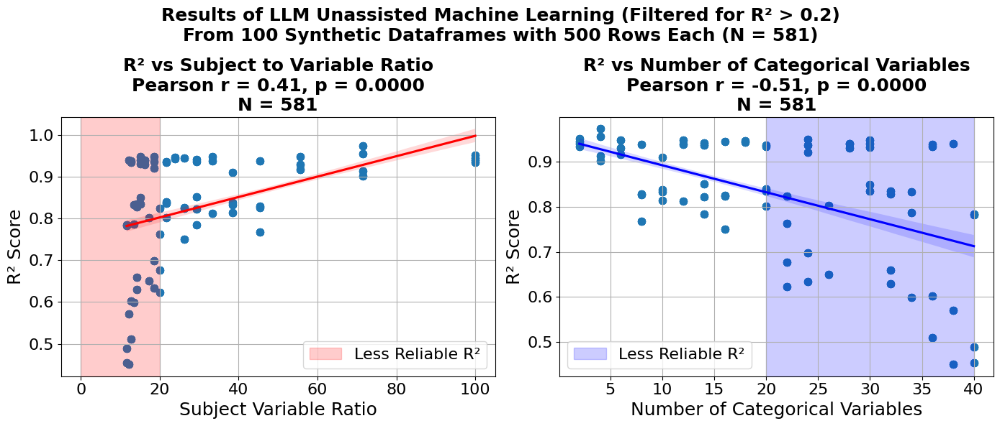

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# File paths
unassisted_file = "unassisted_linear_model_results.csv"
cluster_similarity_file = "cluster_similarity_results_augmented.csv"
output_file = "merged_results.csv"

# Load datasets
df_unassisted = pd.read_csv(unassisted_file)
df_clusters = pd.read_csv(cluster_similarity_file)

# Merge datasets on the "Dataset" column
df_merged = pd.merge(df_unassisted, df_clusters, on="Dataset", how="inner")

# Drop R² values below 0.2
df_merged = df_merged[df_merged["R2"] > 0.2]

# Calculate Pearson Correlation
r_subject, p_subject = stats.pearsonr(df_merged["SubjectVariableRatio"], df_merged["R2"])
r_categorical, p_categorical = stats.pearsonr(df_merged["NumCategoricalVars"], df_merged["R2"])

# Count number of observations
n_obs = len(df_merged)

# Create figure
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# **Add figure title with increased font size**
fig.suptitle(f"Results of LLM Unassisted Machine Learning (Filtered for R² > 0.2)\n"
             f"From 100 Synthetic Dataframes with 500 Rows Each (N = {n_obs})", 
             fontsize=18, fontweight="bold")

# **Plot 1: R² vs Subject Variable Ratio**
sns.regplot(x=df_merged["SubjectVariableRatio"], y=df_merged["R2"], 
            ax=axes[0], scatter_kws={'s': 50}, line_kws={'color': 'red'})

# **Shade unreliable R² region for Subject Variable Ratio**
axes[0].axvspan(0, 20, color='red', alpha=0.2, label="Less Reliable R²")

axes[0].set_xlabel("Subject Variable Ratio", fontsize=18)
axes[0].set_ylabel("R² Score", fontsize=18)
axes[0].set_title(f"R² vs Subject to Variable Ratio\n"
                  f"Pearson r = {r_subject:.2f}, p = {p_subject:.4f}\n"
                  f"N = {n_obs}", fontsize=18, fontweight="bold")
axes[0].tick_params(axis='both', labelsize=16)
axes[0].grid(True)

# **Plot 2: R² vs Number of Categorical Variables**
sns.regplot(x=df_merged["NumCategoricalVars"], y=df_merged["R2"], 
            ax=axes[1], scatter_kws={'s': 50}, line_kws={'color': 'blue'})

# **Shade unreliable R² region for Number of Categorical Variables**
axes[1].axvspan(20, max(df_merged["NumCategoricalVars"]), color='blue', alpha=0.2, label="Less Reliable R²")

axes[1].set_xlabel("Number of Categorical Variables", fontsize=18)
axes[1].set_ylabel("R² Score", fontsize=18)
axes[1].set_title(f"R² vs Number of Categorical Variables\n"
                  f"Pearson r = {r_categorical:.2f}, p = {p_categorical:.4f}\n"
                  f"N = {n_obs}", fontsize=18, fontweight="bold")
axes[1].tick_params(axis='both', labelsize=16)
axes[1].grid(True)

# Add legends for shaded areas with increased font size
axes[0].legend(fontsize=16)
axes[1].legend(fontsize=16)

# Adjust layout
plt.tight_layout()
plt.show()


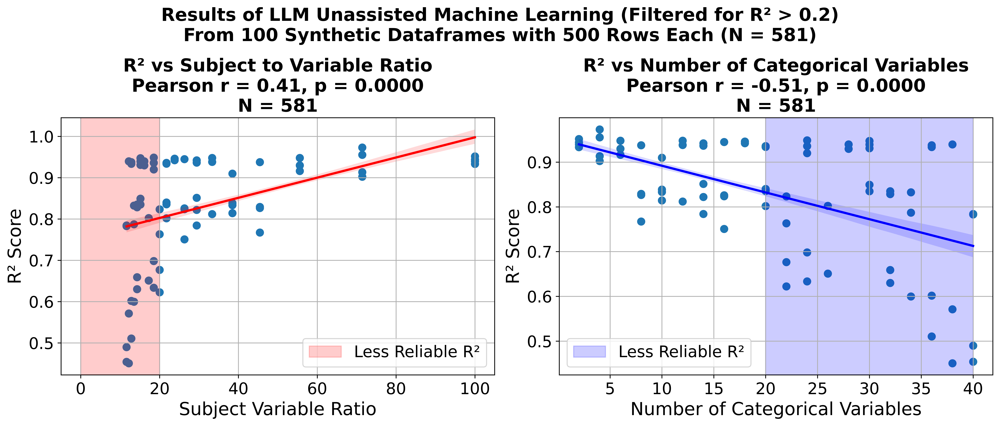


✅ R² analysis plot saved as:
  - comparison_plots/r2_analysis.jpg
  - comparison_plots/r2_analysis.png


In [67]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# **File Paths**
UNASSISTED_FILE = "unassisted_linear_model_results.csv"
CLUSTER_FILE = "cluster_similarity_results_augmented.csv"
OUTPUT_PLOTS_DIR = "comparison_plots"

# Ensure output directory exists
if not os.path.exists(OUTPUT_PLOTS_DIR):
    os.makedirs(OUTPUT_PLOTS_DIR)

# **Load Data**
df_unassisted = pd.read_csv(UNASSISTED_FILE)
df_clusters = pd.read_csv(CLUSTER_FILE)

# **Merge datasets on the "Dataset" column**
df_merged = pd.merge(df_unassisted, df_clusters, on="Dataset", how="inner")

# **Drop R² values below 0.2**
df_merged = df_merged[df_merged["R2"] > 0.2]

# **Calculate Pearson Correlation**
r_subject, p_subject = stats.pearsonr(df_merged["SubjectVariableRatio"], df_merged["R2"])
r_categorical, p_categorical = stats.pearsonr(df_merged["NumCategoricalVars"], df_merged["R2"])

# **Count number of observations**
n_obs = len(df_merged)

# **Create figure**
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=600)  # High-resolution figure

# **Add figure title with increased font size**
fig.suptitle(f"Results of LLM Unassisted Machine Learning (Filtered for R² > 0.2)\n"
             f"From 100 Synthetic Dataframes with 500 Rows Each (N = {n_obs})", 
             fontsize=18, fontweight="bold")

# **Plot 1: R² vs Subject Variable Ratio**
sns.regplot(x=df_merged["SubjectVariableRatio"], y=df_merged["R2"], 
            ax=axes[0], scatter_kws={'s': 50}, line_kws={'color': 'red'})

# **Shade unreliable R² region for Subject Variable Ratio**
axes[0].axvspan(0, 20, color='red', alpha=0.2, label="Less Reliable R²")

axes[0].set_xlabel("Subject Variable Ratio", fontsize=18)
axes[0].set_ylabel("R² Score", fontsize=18)
axes[0].set_title(f"R² vs Subject to Variable Ratio\n"
                  f"Pearson r = {r_subject:.2f}, p = {p_subject:.4f}\n"
                  f"N = {n_obs}", fontsize=18, fontweight="bold")
axes[0].tick_params(axis='both', labelsize=16)
axes[0].grid(True)

# **Plot 2: R² vs Number of Categorical Variables**
sns.regplot(x=df_merged["NumCategoricalVars"], y=df_merged["R2"], 
            ax=axes[1], scatter_kws={'s': 50}, line_kws={'color': 'blue'})

# **Shade unreliable R² region for Number of Categorical Variables**
axes[1].axvspan(20, max(df_merged["NumCategoricalVars"]), color='blue', alpha=0.2, label="Less Reliable R²")

axes[1].set_xlabel("Number of Categorical Variables", fontsize=18)
axes[1].set_ylabel("R² Score", fontsize=18)
axes[1].set_title(f"R² vs Number of Categorical Variables\n"
                  f"Pearson r = {r_categorical:.2f}, p = {p_categorical:.4f}\n"
                  f"N = {n_obs}", fontsize=18, fontweight="bold")
axes[1].tick_params(axis='both', labelsize=16)
axes[1].grid(True)

# **Add legends for shaded areas with increased font size**
axes[0].legend(fontsize=16)
axes[1].legend(fontsize=16)

plt.tight_layout()

# **Save Plot in both JPEG and PNG formats at 600 DPI**
jpeg_path = os.path.join(OUTPUT_PLOTS_DIR, "r2_analysis.jpg")
png_path = os.path.join(OUTPUT_PLOTS_DIR, "r2_analysis.png")

plt.savefig(jpeg_path, format="jpeg", dpi=600, bbox_inches="tight")
plt.savefig(png_path, format="png", dpi=600, bbox_inches="tight")

# **Show Plot**
plt.show()

print(f"\n✅ R² analysis plot saved as:\n  - {jpeg_path}\n  - {png_path}")


In [52]:
df_merged['BestModel_assisted'].value_counts()

BestModel_assisted
RandomForest     91
GradientBoost    23
LinearReg         2
Name: count, dtype: int64

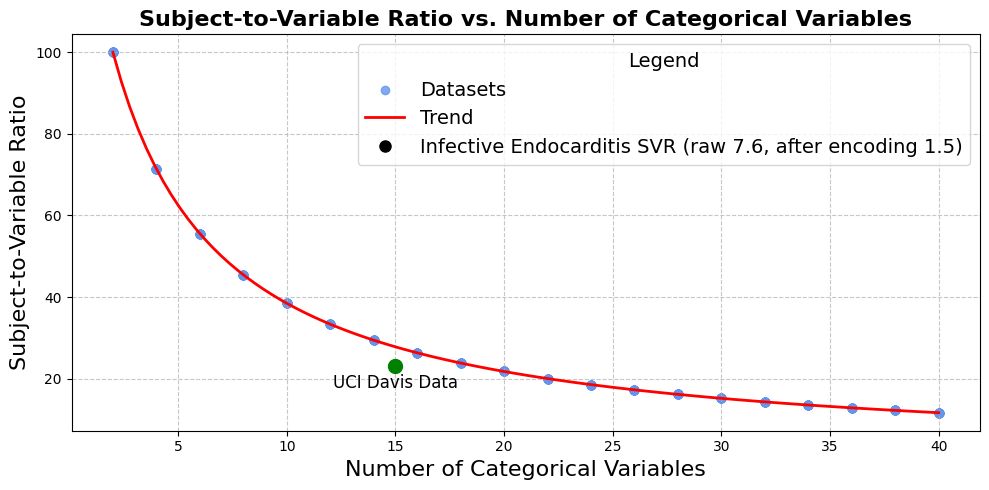

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit

# Load the dataset
df = pd.read_csv("merged_results.csv")

# Scatter plot data
x = df["NumCategoricalVars"]
y = df["SubjectVariableRatio"]

# Define a function for the curve fit (inverse relationship)
def inverse_func(x, a, b):
    return a / (x + b)

# Fit the curve
params, _ = curve_fit(inverse_func, x, y, maxfev=10000)

# Generate fitted values for plotting
x_fit = np.linspace(min(x), max(x), 100)
y_fit = inverse_func(x_fit, *params)

# **Create the plot**
plt.figure(figsize=(10, 5))

# **Plot actual data points**
plt.scatter(x, y, color="cornflowerblue", label="Datasets", alpha=0.8)

# **Plot fitted trend line**
plt.plot(x_fit, y_fit, color="red", linewidth=2, label="Trend")

# **Special Points (UCI Davis and Infective Endocarditis)**
special_points = [
    {"label": "UCI Davis Data", "x": 15, "y": 23, "color": "green", "text_offset": -2},  # UCI Davis (label below)
    #{"label": "Infective Endocarditis", "x": 35, "y": 7.6, "color": "black", "text_offset": 0},  # Infective Endocarditis
]

for point in special_points:
    plt.scatter(point["x"], point["y"], color=point["color"], s=100, zorder=3)
    plt.text(point["x"], point["y"] + point["text_offset"], point["label"], fontsize=12, 
             verticalalignment="top" if point["text_offset"] < 0 else "bottom", ha="center")

# **Labels and Formatting**
plt.xlabel("Number of Categorical Variables", fontsize=16)
plt.ylabel("Subject-to-Variable Ratio", fontsize=16)
plt.title("Subject-to-Variable Ratio vs. Number of Categorical Variables", fontsize=16, fontweight="bold")

# **Legend and Grid**
plt.legend(fontsize=14, loc="upper right", title="Legend", title_fontsize=14)
plt.grid(True, linestyle="--", alpha=0.7)

# **Add Infective Endocarditis information to the legend**
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(plt.Line2D([0], [0], color="black", lw=0, marker="o", markersize=8))
labels.append("Infective Endocarditis SVR (raw 7.6, after encoding 1.5)")
plt.legend(handles, labels, fontsize=14, loc="upper right", title="Legend", title_fontsize=14)

# **Show plot**
plt.tight_layout()
plt.show()


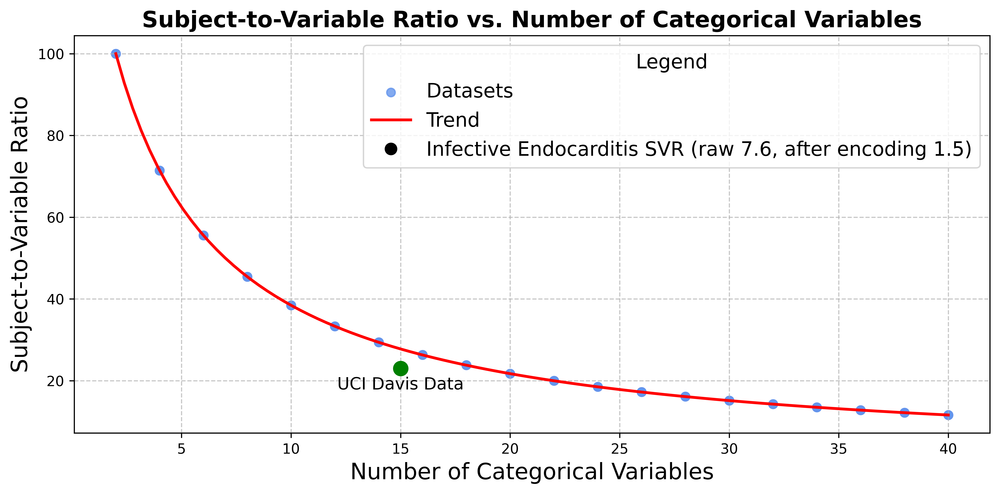

✅ Figure saved as 'Subject_to_Variable_Ratio_vs_CategoricalVars.jpg' (600 DPI).


In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit

# Load the dataset
df = pd.read_csv("merged_results.csv")

# Scatter plot data
x = df["NumCategoricalVars"]
y = df["SubjectVariableRatio"]

# Define a function for the curve fit (inverse relationship)
def inverse_func(x, a, b):
    return a / (x + b)

# Fit the curve
params, _ = curve_fit(inverse_func, x, y, maxfev=10000)

# Generate fitted values for plotting
x_fit = np.linspace(min(x), max(x), 100)
y_fit = inverse_func(x_fit, *params)

# **Create the plot**
plt.figure(figsize=(10, 5), dpi=600)  # 600 DPI for high-resolution output

# **Plot actual data points**
plt.scatter(x, y, color="cornflowerblue", label="Datasets", alpha=0.8)

# **Plot fitted trend line**
plt.plot(x_fit, y_fit, color="red", linewidth=2, label="Trend")

# **Special Points (UCI Davis and Infective Endocarditis)**
special_points = [
    {"label": "UCI Davis Data", "x": 15, "y": 23, "color": "green", "text_offset": -2},  # UCI Davis (label below)
]

for point in special_points:
    plt.scatter(point["x"], point["y"], color=point["color"], s=100, zorder=3)
    plt.text(point["x"], point["y"] + point["text_offset"], point["label"], fontsize=12, 
             verticalalignment="top" if point["text_offset"] < 0 else "bottom", ha="center")

# **Labels and Formatting**
plt.xlabel("Number of Categorical Variables", fontsize=16)
plt.ylabel("Subject-to-Variable Ratio", fontsize=16)
plt.title("Subject-to-Variable Ratio vs. Number of Categorical Variables", fontsize=16, fontweight="bold")

# **Legend and Grid**
plt.legend(fontsize=14, loc="upper right", title="Legend", title_fontsize=14)
plt.grid(True, linestyle="--", alpha=0.7)

# **Add Infective Endocarditis information to the legend**
handles, labels = plt.gca().get_legend_handles_labels()
handles.append(plt.Line2D([0], [0], color="black", lw=0, marker="o", markersize=8))
labels.append("Infective Endocarditis SVR (raw 7.6, after encoding 1.5)")
plt.legend(handles, labels, fontsize=14, loc="upper right", title="Legend", title_fontsize=14)

# **Save the figure as a high-resolution JPEG**
plt.savefig("Informatics fig 3 600 dpi.jpg", format="jpeg", dpi=600, bbox_inches="tight")

# **Show plot**
plt.tight_layout()
plt.show()

print("✅ Figure saved as 'Subject_to_Variable_Ratio_vs_CategoricalVars.jpg' (600 DPI).")


## Justifying cutoffs for R

Breusch-Pagan Test: Test Statistic = 239.9766, p-value = 0.0000


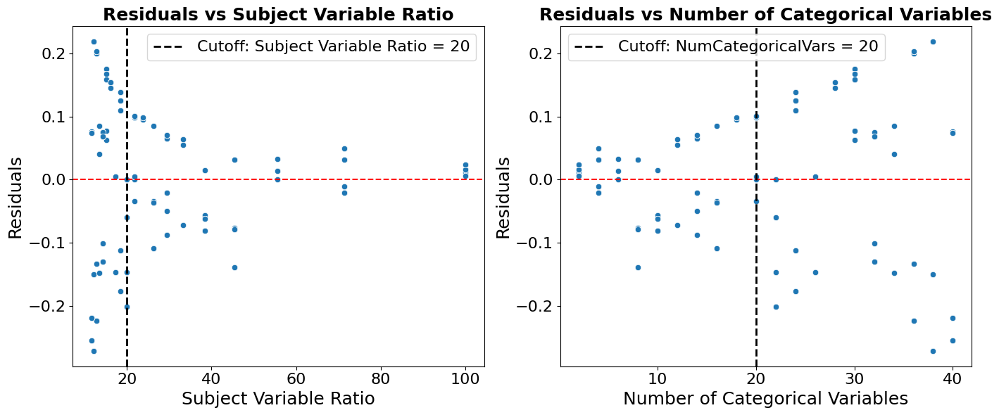

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan

# **Load Data**
df_merged = pd.read_csv("merged_results.csv")

# **Filter for R² > 0.2**
df_merged = df_merged[df_merged["R2"] > 0.2]

# **Regression Model Predicting R²**
X = df_merged[["SubjectVariableRatio", "NumCategoricalVars"]]
X = sm.add_constant(X)  # Add intercept term
y = df_merged["R2"]
model = sm.OLS(y, X).fit()

# **Compute Residuals**
df_merged["Residuals"] = model.resid
df_merged["Fitted_R2"] = model.fittedvalues

# **Breusch-Pagan Test for Heteroscedasticity**
bp_stat, bp_pval, _, _ = het_breuschpagan(model.resid, X)
print(f"Breusch-Pagan Test: Test Statistic = {bp_stat:.4f}, p-value = {bp_pval:.4f}")

# **Plot Residuals vs SubjectVariableRatio and NumCategoricalVars**
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# **Plot 1: Residuals vs SubjectVariableRatio**
sns.scatterplot(x=df_merged["SubjectVariableRatio"], y=df_merged["Residuals"], ax=axes[0])
axes[0].axhline(y=0, color="red", linestyle="--", linewidth=1.5)
axes[0].axvline(x=20, color="black", linestyle="--", linewidth=2, label="Cutoff: Subject Variable Ratio = 20")

axes[0].set_xlabel("Subject Variable Ratio", fontsize=18)
axes[0].set_ylabel("Residuals", fontsize=18)
axes[0].set_title("Residuals vs Subject Variable Ratio", fontsize=18, fontweight="bold")
axes[0].tick_params(axis="both", labelsize=16)
axes[0].legend(fontsize=16)

# **Plot 2: Residuals vs NumCategoricalVars**
sns.scatterplot(x=df_merged["NumCategoricalVars"], y=df_merged["Residuals"], ax=axes[1])
axes[1].axhline(y=0, color="red", linestyle="--", linewidth=1.5)
axes[1].axvline(x=20, color="black", linestyle="--", linewidth=2, label="Cutoff: NumCategoricalVars = 20")

axes[1].set_xlabel("Number of Categorical Variables", fontsize=18)
axes[1].set_ylabel("Residuals", fontsize=18)
axes[1].set_title("Residuals vs Number of Categorical Variables", fontsize=18, fontweight="bold")
axes[1].tick_params(axis="both", labelsize=16)
axes[1].legend(fontsize=16)

plt.tight_layout()
plt.show()


Breusch-Pagan Test: Test Statistic = 239.9766, p-value = 0.0000


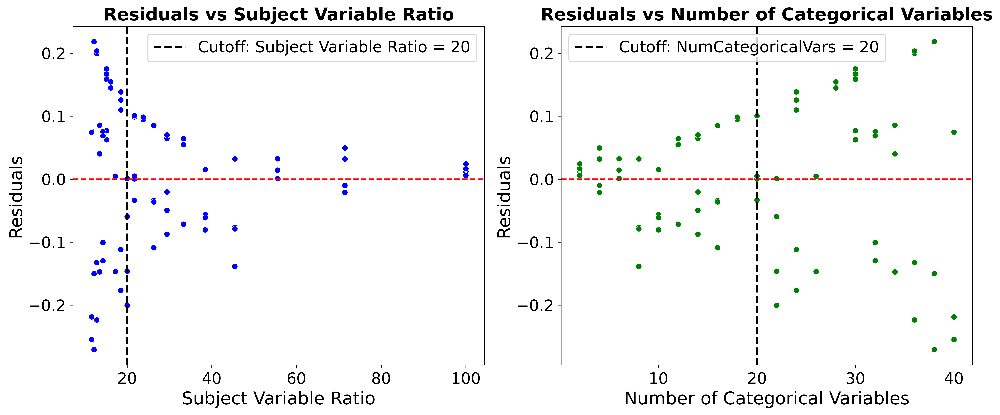


✅ Residuals analysis plot saved as:
  - comparison_plots/residuals_analysis.jpg
  - comparison_plots/residuals_analysis.png


In [66]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan

# **File Paths**
DATA_FILE = "merged_results.csv"
OUTPUT_PLOTS_DIR = "comparison_plots"

# Ensure output directory exists
if not os.path.exists(OUTPUT_PLOTS_DIR):
    os.makedirs(OUTPUT_PLOTS_DIR)

# **Load Data**
df_merged = pd.read_csv(DATA_FILE)

# **Filter for R² > 0.2**
df_merged = df_merged[df_merged["R2"] > 0.2]

# **Regression Model Predicting R²**
X = df_merged[["SubjectVariableRatio", "NumCategoricalVars"]]
X = sm.add_constant(X)  # Add intercept term
y = df_merged["R2"]
model = sm.OLS(y, X).fit()

# **Compute Residuals**
df_merged["Residuals"] = model.resid
df_merged["Fitted_R2"] = model.fittedvalues

# **Breusch-Pagan Test for Heteroscedasticity**
bp_stat, bp_pval, _, _ = het_breuschpagan(model.resid, X)
print(f"Breusch-Pagan Test: Test Statistic = {bp_stat:.4f}, p-value = {bp_pval:.4f}")

# **Plot Residuals vs SubjectVariableRatio and NumCategoricalVars**
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=600)  # High-resolution figure

# **Plot 1: Residuals vs SubjectVariableRatio**
sns.scatterplot(x=df_merged["SubjectVariableRatio"], y=df_merged["Residuals"], ax=axes[0], color="blue")
axes[0].axhline(y=0, color="red", linestyle="--", linewidth=1.5)
axes[0].axvline(x=20, color="black", linestyle="--", linewidth=2, label="Cutoff: Subject Variable Ratio = 20")

axes[0].set_xlabel("Subject Variable Ratio", fontsize=18)
axes[0].set_ylabel("Residuals", fontsize=18)
axes[0].set_title("Residuals vs Subject Variable Ratio", fontsize=18, fontweight="bold")
axes[0].tick_params(axis="both", labelsize=16)
axes[0].legend(fontsize=16)

# **Plot 2: Residuals vs NumCategoricalVars**
sns.scatterplot(x=df_merged["NumCategoricalVars"], y=df_merged["Residuals"], ax=axes[1], color="green")
axes[1].axhline(y=0, color="red", linestyle="--", linewidth=1.5)
axes[1].axvline(x=20, color="black", linestyle="--", linewidth=2, label="Cutoff: NumCategoricalVars = 20")

axes[1].set_xlabel("Number of Categorical Variables", fontsize=18)
axes[1].set_ylabel("Residuals", fontsize=18)
axes[1].set_title("Residuals vs Number of Categorical Variables", fontsize=18, fontweight="bold")
axes[1].tick_params(axis="both", labelsize=16)
axes[1].legend(fontsize=16)

plt.tight_layout()

# **Save Plot in both JPEG and PNG formats at 600 DPI**
jpeg_path = os.path.join(OUTPUT_PLOTS_DIR, "residuals_analysis.jpg")
png_path = os.path.join(OUTPUT_PLOTS_DIR, "residuals_analysis.png")

plt.savefig(jpeg_path, format="jpeg", dpi=600, bbox_inches="tight")
plt.savefig(png_path, format="png", dpi=600, bbox_inches="tight")

# **Show Plot**
plt.show()

print(f"\n✅ Residuals analysis plot saved as:\n  - {jpeg_path}\n  - {png_path}")


## LLM assisted modeling produce top variables predicting cluster

In [60]:
#Check GPU
import subprocess

def check_nvidia_gpu():
    try:
        # Execute the nvidia-smi command to check for NVIDIA GPU availability
        result = subprocess.run(['nvidia-smi'], stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        if result.returncode == 0:
            print('NVIDIA GPU detected!')
            return True
        else:
            print('NVIDIA GPU not detected.')
            return False
    except FileNotFoundError:
        print('nvidia-smi command not found. Ensure NVIDIA drivers are installed.')
        return False

# Call the function at the start of your script
if check_nvidia_gpu():
    # Proceed with GPU-dependent code
    pass
else:
    # Handle the absence of an NVIDIA GPU
    pass


NVIDIA GPU detected!


In [73]:
import os
import numpy as np
import pandas as pd
from glob import glob
import csv
from collections import Counter

# sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# imbalanced-learn
from imblearn.over_sampling import SMOTE

# SHAP
import shap

# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
DATA_DIR = "generated_data_with_clusters"             # Your input directory
OUTPUT_FILE = "cluster_classification_results.csv"    # Final output
PROGRESS_FILE = "classification_progress.csv"         # Partial progress file
RANDOM_SEED = 42

# Models to compare
MODELS = {
    "LogisticReg": LogisticRegression(max_iter=500, random_state=RANDOM_SEED),
    "RandomForest": RandomForestClassifier(n_estimators=100, random_state=RANDOM_SEED),
    "GradientBoost": GradientBoostingClassifier(random_state=RANDOM_SEED)
}

def compute_multi_class_auc(y_true, y_prob):
    """Ensures correct shape of probability predictions before computing AUC."""
    if y_prob.shape[1] != len(np.unique(y_true)):
        print("      Warning: Shape mismatch between y_true and y_prob. Skipping AUC computation.")
        return None
    if len(np.unique(y_true)) == 2:
        return roc_auc_score(y_true, y_prob[:, 1])
    else:
        return roc_auc_score(y_true, y_prob, multi_class="ovr", average="macro")

def train_and_select_best_model(X, y):
    if len(np.unique(y)) < 2:
        print("      Single class => skip.")
        return None, None, None
    
    numeric_cols = [c for c in X.columns if c in ["x1", "x2"]]
    cat_cols = [c for c in X.columns if c not in numeric_cols]
    
    preprocessor = build_preprocessor(numeric_cols, cat_cols)
    X_enc = preprocessor.fit_transform(X, y)
    if hasattr(X_enc, "toarray"):
        X_enc = X_enc.toarray()
    
    class_counts = Counter(y)
    min_class_count = min(class_counts.values())
    stratify_option = y if min_class_count >= 2 else None
    
    X_train, X_test, y_train, y_test = train_test_split(
        X_enc, y, test_size=0.3, random_state=RANDOM_SEED, stratify=stratify_option
    )
    
    if len(np.unique(y_train)) < 2:
        print("      Single-class in train => skip.")
        return None, None, None
    
    try:
        if min_class_count > 1:
            k_neighbors = min(5, min_class_count - 1)
            if k_neighbors < 1:
                print("      Not enough samples for SMOTE => skipping SMOTE.")
                X_train_res, y_train_res = X_train, y_train
            else:
                print(f"      Using SMOTE(k_neighbors={k_neighbors}). Classes in train={len(class_counts)}")
                sm = SMOTE(random_state=RANDOM_SEED, k_neighbors=k_neighbors)
                X_train_res, y_train_res = sm.fit_resample(X_train, y_train)
        else:
            print("      Not enough samples for SMOTE => skipping SMOTE.")
            X_train_res, y_train_res = X_train, y_train
    except ValueError as e:
        print(f"      SMOTE error: {e}. Skipping dataset.")
        return None, None, None
    
    best_auc = -1
    best_model_name = None
    best_model_obj = None
    
    for model_name, model in MODELS.items():
        model.fit(X_train_res, y_train_res)
        try:
            y_prob = model.predict_proba(X_test)
            auc_val = compute_multi_class_auc(y_test, y_prob)
            if auc_val is not None and auc_val > best_auc:
                best_auc = auc_val
                best_model_name = model_name
                best_model_obj = model
        except ValueError as e:
            print(f"      Skipping {model_name} due to error: {e}")
            continue
    
    if best_model_name is None:
        return None, None, None
    
    best_pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("model", best_model_obj)
    ])
    return best_model_name, best_auc, best_pipeline

def main():
    csv_files = glob(os.path.join(DATA_DIR, "*.csv"))
    if not csv_files:
        print(f"No CSV files found in {DATA_DIR}.")
        return
    
    results = []
    
    for fpath in csv_files:
        ds_name = os.path.splitext(os.path.basename(fpath))[0]
        print(f"\n--- Processing dataset: {ds_name} ---")
        df = pd.read_csv(fpath)
        
        for numeric_col in ["x1","x2"]:
            if numeric_col in df.columns:
                df[numeric_col] = pd.to_numeric(df[numeric_col], errors="coerce")
                df.dropna(subset=[numeric_col], inplace=True)
        
        cluster_cols = [c for c in df.columns if c.startswith("cluster_")]
        if not cluster_cols:
            print(f"   Skipping {ds_name}: no cluster_ columns.")
            continue
        
        for cluster_col in cluster_cols:
            y = df[cluster_col].values
            if len(np.unique(y)) < 2:
                print(f"   Skipping {cluster_col}: only one label found.")
                continue
            
            exclude_cols = [c for c in df.columns if c.startswith("cluster_")]
            X = df.drop(columns=exclude_cols, errors="ignore").copy()
            
            best_model_name, best_auc, best_pipeline = train_and_select_best_model(X, y)
            if best_model_name is None:
                print(f"      Skipping {cluster_col}: Model selection issue.")
                results.append({"Dataset": ds_name, "Cluster": cluster_col, "BestModel": "NA", "AUC": "NA"})
                continue
            
            print(f"      BestModel={best_model_name}, AUC={best_auc:.3f}")
            
            results.append({
                "Dataset": ds_name,
                "Cluster": cluster_col,
                "BestModel": best_model_name,
                "AUC": best_auc
            })
    
    final_df = pd.DataFrame(results)
    final_df.to_csv(OUTPUT_FILE, index=False)
    print(f"\n✅ Combined classification results saved to {OUTPUT_FILE}.")

if __name__ == "__main__":
    main()



--- Processing dataset: data_79_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.789
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.804
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.899
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.548
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.812

--- Processing dataset: data_91_linear ---
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.845
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.785
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.913
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.494
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_44_exponential ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.786
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.884
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.751
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.509
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_42_linear ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.740
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.543
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_88_exponential ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.845
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.785
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.544
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.875

--- Processing dataset: data_43_linear ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.701
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.552
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_68_exponential ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.847
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.544
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_48_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.844
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.808
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.702
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.576
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.848
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.844

--- Processing dataset: data_13_cubic ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.884
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.660
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.532
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.850
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.747

--- Processing dataset: data_33_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.721
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.513
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.794
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.844

--- Processing dataset: data_84_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.760
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.916
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.541
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_74_linear ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.835
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.868
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.525
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.809
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_21_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.562
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.851
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.776
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.835
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.697

--- Processing dataset: data_40_exponential ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.491
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_5_cubic ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.550
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.789
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.804
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.651
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.662

--- Processing dataset: data_17_exponential ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.742
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.578
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_0_exponential ---
      Using SMOTE(k_neighbors=5). Classes in

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.591
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.845
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.695
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.926
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.760

--- Processing dataset: data_30_cubic ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in tr

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.739
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.526
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_34_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.739
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.558
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_52_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in trai

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.820
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.894
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.551
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_16_cubic ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_t5: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_72_linear ---
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.835
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.906
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.496
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_89_linear ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.761
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.912
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.531
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.849
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_55_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.946
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.816
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.918
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.574
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_22_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.810
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.794
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.557
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.914

--- Processing dataset: data_65_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.835
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.843
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.783
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.898
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.493

--- Processing dataset: data_14_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.820
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.818
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.731
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.550
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.871

--- Processing dataset: data_25_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.589
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.869
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.

--- Processing dataset: data_94_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.901
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.533
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.826
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.805
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.795

--- Processing dataset: data_96_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.532
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.807
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.909
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.545
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_85_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.774
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.759
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.878
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.486
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_51_quadratic ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.911
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.521
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.816
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.817

--- Processing dataset: data_90_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.798
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.766
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.899
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.539
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_38_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.550
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.806
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.774
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.777
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.720

--- Processing dataset: data_81_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.830
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.774
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.898
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.515
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_92_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.793
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.842
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.793
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.535
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.884

--- Processing dataset: data_62_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.875
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.870
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.544
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_10_linear ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.574
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.806
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.

--- Processing dataset: data_31_linear ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.833
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.830
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.555

--- Processing dataset: data_57_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.839
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.532
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.869

--- Processing dataset: data_70_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.794
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.859
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.515

--- Processing dataset: data_98_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.897
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.510
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.861
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.830

--- Processing dataset: data_23_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.556
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.

--- Processing dataset: data_27_exponential ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.557
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.863
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_61_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.874
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.850
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.540
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_46_linear ---
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.834
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.573
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.720

--- Processing dataset: data_73_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.805
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.800
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.543
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_53_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.848
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.932
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.524
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_37_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.712
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.531
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.815
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.820

--- Processing dataset: data_54_quadratic ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.861
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.527
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.827
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_20_quadratic ---
      Using SMOTE(k_neighbors=3). Classes in train=5
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.534
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.

--- Processing dataset: data_78_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.819
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.873
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.907
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.530

--- Processing dataset: data_82_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.798
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.835
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.524
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.883
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.891

--- Processing dataset: data_19_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.845
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.819
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.552
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.952
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.816
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.783

--- Processing dataset: data_4_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.726
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.613
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.920
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.839

--- Processing dataset: data_8_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.820
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.654
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.880
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.575

--- Processing dataset: data_36_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.824
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.776
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.530
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.

--- Processing dataset: data_24_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.840
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.825
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.588
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.728

--- Processing dataset: data_39_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.807
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.544
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_60_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.542
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.881
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.919

--- Processing dataset: data_1_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes 

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.685
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.563
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.754

--- Processing dataset: data_41_exponential ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.831
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.718
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.540

--- Processing dataset: data_32_linear ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.711
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.773
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.527

--- Processing dataset: data_66_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.800
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.876
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.493
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_49_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.715
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.543
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.864
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.897
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.785

--- Processing dataset: data_56_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.525
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.840
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.840
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.791
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.931

--- Processing dataset: data_63_exponential ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.882
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.478
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.862
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.

--- Processing dataset: data_80_cubic ---
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.787
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.927
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.534
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.807

--- Processing dataset: data_12_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.827
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.871
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.886
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.550
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.713

--- Processing dataset: data_3_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.847
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.925
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.758
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_t5: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.765

--- Processing dataset: data_64_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.917
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.526
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.832
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.866
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_35_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.823
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.787
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.578
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_6_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.673
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.561
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.842
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.848
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.664
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.837
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.819

--- Processing dataset: data_93_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.829
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.828
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.915
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.497

--- Processing dataset: data_29_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.859
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.528
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.730

--- Processing dataset: data_76_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.773
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.874
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.555
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.933

--- Processing dataset: data_50_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.909
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.538
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.796

--- Processing dataset: data_9_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.801
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.689
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.581
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_59_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.871
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.851
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.925
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.545
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_97_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.859
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.753
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.776
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.880
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.503

--- Processing dataset: data_45_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.542
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.843
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.800
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.801
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.

--- Processing dataset: data_18_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.766
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.572
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_69_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.794
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.813
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.893
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.489
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.

--- Processing dataset: data_67_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.841
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.759
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.535
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.915

--- Processing dataset: data_58_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.898
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.541
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_95_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.558
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.793
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.888

--- Processing dataset: data_11_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.817
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.729
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.721
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.551
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.847

--- Processing dataset: data_87_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.791
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.868
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.537
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_2_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.595
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.901
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.867
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.783

--- Processing dataset: data_47_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.827
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.718
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.523

--- Processing dataset: data_75_exponential ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.858
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.806
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.888
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.524

--- Processing dataset: data_83_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.827
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.911
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.501
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.806

--- Processing dataset: data_99_exponential ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.796
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.883
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.561
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.886
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.815

--- Processing dataset: data_7_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.802
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.652
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.869
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.797
      Using SMOTE(k_neighbors=1). Classes in train=5
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.505
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.872

--- Processing dataset: data_15_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.615
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.819
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.837
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.728

--- Processing dataset: data_71_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.793
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.847
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.495
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_77_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.838
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.782
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.894
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.548
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_86_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.907
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.503
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.850
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.803
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.671
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.759
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.884

--- Processing dataset: data_26_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.560
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.740
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_28_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.561
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.824
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.691

✅ Combined classification results saved to cluster_classification_results.csv.


## LLM assisted model with RMSE and MAE enhancements

In [2]:
import os
import numpy as np
import pandas as pd
from glob import glob
import csv
from collections import Counter

# sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

# imbalanced-learn
from imblearn.over_sampling import SMOTE

# SHAP
import shap

# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
DATA_DIR = "generated_data_with_clusters"             # Your input directory
OUTPUT_DIR = "classification_results_with_metrics"    # Separate output directory
OUTPUT_FILE = os.path.join(OUTPUT_DIR, "cluster_classification_results.csv") 
RANDOM_SEED = 42

# Ensure output directory exists
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Models to compare
MODELS = {
    "LogisticReg": LogisticRegression(max_iter=500, random_state=RANDOM_SEED),
    "RandomForest": RandomForestClassifier(n_estimators=100, random_state=RANDOM_SEED),
    "GradientBoost": GradientBoostingClassifier(random_state=RANDOM_SEED)
}

def compute_multi_class_auc(y_true, y_prob):
    """Ensures correct shape of probability predictions before computing AUC."""
    if y_prob.shape[1] != len(np.unique(y_true)):
        print("      Warning: Shape mismatch between y_true and y_prob. Skipping AUC computation.")
        return None
    if len(np.unique(y_true)) == 2:
        return roc_auc_score(y_true, y_prob[:, 1])
    else:
        return roc_auc_score(y_true, y_prob, multi_class="ovr", average="macro")

def build_preprocessor(numeric_cols, cat_cols):
    """Builds column transformer for numeric and categorical features."""
    numeric_pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy="median"))
    ])
    
    cat_pipeline = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("ohe", OneHotEncoder(handle_unknown="ignore"))
    ])
    
    preprocessor = ColumnTransformer([
        ("num", numeric_pipeline, numeric_cols),
        ("cat", cat_pipeline, cat_cols)
    ])
    
    return preprocessor

def train_and_select_best_model(X, y):
    """Train models and select the best one based on AUC, RMSE, and MAE."""
    if len(np.unique(y)) < 2:
        print("      Single class => skip.")
        return None, None, None, None, None
    
    numeric_cols = [c for c in X.columns if c in ["x1", "x2"]]
    cat_cols = [c for c in X.columns if c not in numeric_cols]
    
    preprocessor = build_preprocessor(numeric_cols, cat_cols)
    X_enc = preprocessor.fit_transform(X, y)
    if hasattr(X_enc, "toarray"):
        X_enc = X_enc.toarray()
    
    class_counts = Counter(y)
    min_class_count = min(class_counts.values())
    stratify_option = y if min_class_count >= 2 else None
    
    X_train, X_test, y_train, y_test = train_test_split(
        X_enc, y, test_size=0.3, random_state=RANDOM_SEED, stratify=stratify_option
    )
    
    if len(np.unique(y_train)) < 2:
        print("      Single-class in train => skip.")
        return None, None, None, None, None
    
    try:
        if min_class_count > 1:
            k_neighbors = min(5, min_class_count - 1)
            if k_neighbors < 1:
                print("      Not enough samples for SMOTE => skipping SMOTE.")
                X_train_res, y_train_res = X_train, y_train
            else:
                print(f"      Using SMOTE(k_neighbors={k_neighbors}). Classes in train={len(class_counts)}")
                sm = SMOTE(random_state=RANDOM_SEED, k_neighbors=k_neighbors)
                X_train_res, y_train_res = sm.fit_resample(X_train, y_train)
        else:
            print("      Not enough samples for SMOTE => skipping SMOTE.")
            X_train_res, y_train_res = X_train, y_train
    except ValueError as e:
        print(f"      SMOTE error: {e}. Skipping dataset.")
        return None, None, None, None, None
    
    best_auc = -1
    best_rmse = float("inf")
    best_mae = float("inf")
    best_model_name = None
    best_model_obj = None
    
    for model_name, model in MODELS.items():
        model.fit(X_train_res, y_train_res)
        try:
            y_prob = model.predict_proba(X_test)
            y_pred = model.predict(X_test)

            # Compute metrics
            auc_val = compute_multi_class_auc(y_test, y_prob)
            rmse_val = np.sqrt(mean_squared_error(y_test, y_pred))
            mae_val = mean_absolute_error(y_test, y_pred)

            if auc_val is not None and auc_val > best_auc:
                best_auc = auc_val
                best_rmse = rmse_val
                best_mae = mae_val
                best_model_name = model_name
                best_model_obj = model
        except ValueError as e:
            print(f"      Skipping {model_name} due to error: {e}")
            continue
    
    if best_model_name is None:
        return None, None, None, None, None
    
    best_pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("model", best_model_obj)
    ])
    
    return best_model_name, best_auc, best_rmse, best_mae, best_pipeline

def main():
    csv_files = glob(os.path.join(DATA_DIR, "*.csv"))
    if not csv_files:
        print(f"No CSV files found in {DATA_DIR}.")
        return
    
    results = []
    
    for fpath in csv_files:
        ds_name = os.path.splitext(os.path.basename(fpath))[0]
        print(f"\n--- Processing dataset: {ds_name} ---")
        df = pd.read_csv(fpath)
        
        for numeric_col in ["x1", "x2"]:
            if numeric_col in df.columns:
                df[numeric_col] = pd.to_numeric(df[numeric_col], errors="coerce")
                df.dropna(subset=[numeric_col], inplace=True)
        
        cluster_cols = [c for c in df.columns if c.startswith("cluster_")]
        if not cluster_cols:
            print(f"   Skipping {ds_name}: no cluster_ columns.")
            continue
        
        for cluster_col in cluster_cols:
            y = df[cluster_col].values
            if len(np.unique(y)) < 2:
                print(f"   Skipping {cluster_col}: only one label found.")
                continue
            
            exclude_cols = [c for c in df.columns if c.startswith("cluster_")]
            X = df.drop(columns=exclude_cols, errors="ignore").copy()
            
            best_model_name, best_auc, best_rmse, best_mae, best_pipeline = train_and_select_best_model(X, y)
            if best_model_name is None:
                print(f"      Skipping {cluster_col}: Model selection issue.")
                results.append({
                    "Dataset": ds_name, 
                    "Cluster": cluster_col, 
                    "BestModel": "NA", 
                    "AUC": "NA", 
                    "RMSE": "NA",
                    "MAE": "NA"
                })
                continue
            
            print(f"      BestModel={best_model_name}, AUC={best_auc:.3f}, RMSE={best_rmse:.3f}, MAE={best_mae:.3f}")
            
            results.append({
                "Dataset": ds_name,
                "Cluster": cluster_col,
                "BestModel": best_model_name,
                "AUC": best_auc,
                "RMSE": best_rmse,
                "MAE": best_mae
            })
    
    final_df = pd.DataFrame(results)
    final_df.to_csv(OUTPUT_FILE, index=False)
    print(f"\n✅ Combined classification results saved to {OUTPUT_FILE}.")

if __name__ == "__main__":
    main()



--- Processing dataset: data_79_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.789, RMSE=3.078, MAE=2.193
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.804, RMSE=3.325, MAE=2.053
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.899, RMSE=0.993, MAE=0.533
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.548, RMSE=4.776, MAE=3.687
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.812, RMSE=2.712, MAE=1.927

--- Processing dataset: data_91_linear ---
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.845, RMSE=3.320, MAE=2.233
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.785, RMSE=3.897, MAE=2.693
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.913, RMSE=1.334, MAE=0.687
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.494, RMSE=4.168, MAE=3.413
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_44_exponential ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.786, RMSE=2.734, MAE=1.620
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.884, RMSE=2.685, MAE=1.607
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.751, RMSE=1.356, MAE=0.920
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.509, RMSE=3.923, MAE=3.260
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_42_linear ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.740, RMSE=2.093, MAE=1.420
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.543, RMSE=3.190, MAE=2.360
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_88_exponential ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.845, RMSE=3.035, MAE=1.787
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.785, RMSE=4.435, MAE=3.113
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.544, RMSE=4.046, MAE=3.180
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.875, RMSE=1.366, MAE=0.760

--- Processing dataset: data_43_linear ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.701, RMSE=1.612, MAE=1.173
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.552, RMSE=3.706, MAE=2.840
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_68_exponential ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.847, RMSE=2.255, MAE=1.500
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.544, RMSE=3.817, MAE=2.900
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_48_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.844, RMSE=2.643, MAE=1.680
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.808, RMSE=3.145, MAE=2.160
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.702, RMSE=2.168, MAE=1.607
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.576, RMSE=3.643, MAE=2.780
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.848, RMSE=3.600, MAE=2.387
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.844, RMSE=2.946, MAE=1.853

--- Processing dataset: data_13_cubic ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.884, RMSE=3.841, MAE=2.553
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.660, RMSE=2.246, MAE=1.553
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.532, RMSE=3.676, MAE=2.967
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.850, RMSE=3.003, MAE=1.980
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.747, RMSE=4.041, MAE=3.133

--- Processing dataset: data_33_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.721, RMSE=1.747, MAE=1.227
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.513, RMSE=3.343, MAE=2.720
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.794, RMSE=3.607, MAE=2.613
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.844, RMSE=3.331, MAE=2.307

--- Processing dataset: data_84_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.760, RMSE=2.577, MAE=1.720
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.916, RMSE=1.077, MAE=0.560
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.541, RMSE=4.688, MAE=3.673
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_74_linear ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.835, RMSE=4.096, MAE=2.773
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.868, RMSE=1.623, MAE=0.940
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.525, RMSE=4.263, MAE=3.480
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.809, RMSE=3.136, MAE=1.900
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_21_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.562, RMSE=4.035, MAE=3.200
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.851, RMSE=2.311, MAE=1.487
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.776, RMSE=3.442, MAE=2.527
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.835, RMSE=3.372, MAE=2.427
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.697, RMSE=2.232, MAE=1.633

--- Processing dataset: data_40_exponential ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.491, RMSE=4.159, MAE=3.360
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_5_cubic ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.550, RMSE=3.282, MAE=2.547
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.789, RMSE=3.510, MAE=2.253
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.804, RMSE=3.623, MAE=2.553
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.651, RMSE=3.111, MAE=2.307
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.662, RMSE=1.693, MAE=1.240

--- Processing dataset: data_17_exponential ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.742, RMSE=1.744, MAE=1.267
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.578, RMSE=3.913, MAE=3.060
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_0_exponential ---
      Using SMOTE(k_n

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.591, RMSE=3.135, MAE=2.360
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.845, RMSE=3.144, MAE=2.340
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.695, RMSE=3.649, MAE=2.660
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.926, RMSE=3.336, MAE=2.313
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.760, RMSE=1.262, MAE=0.820

--- Processing dataset: data_30_cubic ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neig

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.739, RMSE=1.975, MAE=1.353
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.526, RMSE=3.648, MAE=2.827
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_34_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.739, RMSE=1.787, MAE=1.273
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.558, RMSE=2.894, MAE=2.213
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_52_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighb

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.820, RMSE=4.077, MAE=2.873
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.894, RMSE=1.254, MAE=0.693
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.551, RMSE=3.552, MAE=2.633
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_16_cubic ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_t5: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_72_linear ---
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.835, RMSE=3.810, MAE=2.553
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.906, RMSE=1.361, MAE=0.747
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.496, RMSE=4.317, MAE=3.560
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_89_linear ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.761, RMSE=3.894, MAE=2.853
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.912, RMSE=1.334, MAE=0.687
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.531, RMSE=4.442, MAE=3.427
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.849, RMSE=2.494, MAE=1.460
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_55_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.946, RMSE=2.434, MAE=1.300
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.816, RMSE=3.138, MAE=2.207
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.918, RMSE=1.299, MAE=0.713
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.574, RMSE=4.064, MAE=3.293
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_22_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.810, RMSE=2.561, MAE=1.760
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.794, RMSE=4.223, MAE=3.153
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.557, RMSE=4.346, MAE=3.393
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.914, RMSE=2.891, MAE=1.493

--- Processing dataset: data_65_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.835, RMSE=3.035, MAE=2.013
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.843, RMSE=3.972, MAE=2.820
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.783, RMSE=3.705, MAE=2.767
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.898, RMSE=1.398, MAE=0.753
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.493, RMSE=4.184, MAE=3.573

--- Processing dataset: data_14_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.820, RMSE=3.634, MAE=2.633
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.818, RMSE=3.579, MAE=2.340
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.731, RMSE=2.246, MAE=1.527
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.550, RMSE=3.446, MAE=2.527
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.871, RMSE=3.692, MAE=2.567

--- Processing dataset: data_25_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.589, RMSE=3.882, MAE=3.087
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.869, RMSE=3.102, MAE=2.033
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.

--- Processing dataset: data_94_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.901, RMSE=1.334, MAE=0.660
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.533, RMSE=4.107, MAE=3.227
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.826, RMSE=3.102, MAE=1.980
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.805, RMSE=3.162, MAE=2.200
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.795, RMSE=2.990, MAE=2.007

--- Processing dataset: data_96_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.532, RMSE=3.311, MAE=2.160
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.807, RMSE=3.705, MAE=2.673
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.909, RMSE=1.521, MAE=0.820
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.545, RMSE=2.503, MAE=1.720
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_85_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.774, RMSE=4.033, MAE=3.240
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.759, RMSE=3.547, MAE=2.100
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.878, RMSE=1.608, MAE=0.933
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.486, RMSE=4.346, MAE=3.527
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_51_quadratic ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.911, RMSE=1.499, MAE=0.740
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.521, RMSE=4.302, MAE=3.293
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.816, RMSE=3.385, MAE=2.220
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.817, RMSE=2.597, MAE=1.747

--- Processing dataset: data_90_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.798, RMSE=3.236, MAE=2.300
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.766, RMSE=3.387, MAE=2.433
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.899, RMSE=1.283, MAE=0.727
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.539, RMSE=3.840, MAE=3.053
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_38_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.550, RMSE=3.870, MAE=3.113
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.806, RMSE=3.588, MAE=2.353
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.774, RMSE=3.361, MAE=2.387
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.777, RMSE=3.670, MAE=2.600
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.720, RMSE=1.903, MAE=1.287

--- Processing dataset: data_81_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.830, RMSE=3.259, MAE=2.073
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.774, RMSE=2.747, MAE=1.960
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.898, RMSE=1.160, MAE=0.640
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.515, RMSE=3.687, MAE=2.980
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_92_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.793, RMSE=3.814, MAE=2.613
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.842, RMSE=3.176, MAE=1.873
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.793, RMSE=4.286, MAE=3.213
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.535, RMSE=3.266, MAE=2.560
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.884, RMSE=1.541, MAE=0.960

--- Processing dataset: data_62_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.875, RMSE=3.123, MAE=1.793
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.870, RMSE=1.519, MAE=0.867
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.544, RMSE=4.053, MAE=3.267
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_10_linear ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbor

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.574, RMSE=3.224, MAE=2.500
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.806, RMSE=3.225, MAE=2.240
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.

--- Processing dataset: data_31_linear ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.833, RMSE=2.692, MAE=1.900
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.830, RMSE=3.576, MAE=2.520
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.555, RMSE=4.017, MAE=3.240

--- Processing dataset: data_57_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.839, RMSE=2.725, MAE=1.800
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.532, RMSE=3.248, MAE=2.493
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.869, RMSE=1.717, MAE=0.960

--- Processing dataset: data_70_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.794, RMSE=3.980, MAE=2.693
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.859, RMSE=1.755, MAE=1.053
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.515, RMSE=2.871, MAE=2.200

--- Processing dataset: data_98_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.897, RMSE=1.405, MAE=0.787
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.510, RMSE=3.160, MAE=2.480
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.861, RMSE=3.094, MAE=1.733
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.830, RMSE=2.712, MAE=1.633

--- Processing dataset: data_23_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.556, RMSE=4.206, MAE=3.520
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.

--- Processing dataset: data_27_exponential ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.557, RMSE=4.467, MAE=3.647
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.863, RMSE=3.480, MAE=2.393
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_61_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.874, RMSE=2.612, MAE=1.580
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.850, RMSE=3.386, MAE=1.933
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.540, RMSE=3.776, MAE=2.927
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_46_linear ---
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.834, RMSE=3.375, MAE=2.100
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.573, RMSE=4.179, MAE=3.400
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.720, RMSE=2.101, MAE=1.480

--- Processing dataset: data_73_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.805, RMSE=3.483, MAE=2.200
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.800, RMSE=3.342, MAE=2.247
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.543, RMSE=3.286, MAE=2.533
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_53_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.848, RMSE=3.333, MAE=2.253
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.932, RMSE=0.821, MAE=0.407
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.524, RMSE=4.058, MAE=3.160
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_37_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.712, RMSE=1.485, MAE=0.980
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.531, RMSE=4.309, MAE=3.300
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.815, RMSE=3.295, MAE=2.353
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.820, RMSE=3.415, MAE=2.327

--- Processing dataset: data_54_quadratic ---
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.861, RMSE=3.099, MAE=2.020
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.527, RMSE=4.037, MAE=3.133
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.827, RMSE=1.789, MAE=1.187
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_20_quadratic ---
      Using SMOTE(k_neighbors=3). Classes in train=5
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.534, RMSE=3.876, MAE=3.193
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.

--- Processing dataset: data_78_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.819, RMSE=2.771, MAE=1.893
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.873, RMSE=3.082, MAE=1.953
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.907, RMSE=1.342, MAE=0.667
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.530, RMSE=3.476, MAE=2.720

--- Processing dataset: data_82_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.798, RMSE=3.938, MAE=2.720
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.835, RMSE=3.579, MAE=2.393
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.524, RMSE=4.491, MAE=3.580
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.883, RMSE=2.487, MAE=1.213
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.891, RMSE=1.359, MAE=0.820

--- Processing dataset: data_19_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.845, RMSE=3.885, MAE=2.653
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.819, RMSE=3.428, MAE=2.513
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.552, RMSE=3.901, MAE=3.007
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.952, RMSE=2.054, MAE=1.153
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.816, RMSE=3.170, MAE=2.180
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.783, RMSE=2.787, MAE=2.127

--- Processing dataset: data_4_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.726, RMSE=1.447, MAE=1.027
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.613, RMSE=4.948, MAE=4.060
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.920, RMSE=3.662, MAE=2.060
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.839, RMSE=3.024, MAE=1.987

--- Processing dataset: data_8_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.820, RMSE=2.838, MAE=1.960
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.654, RMSE=3.710, MAE=2.687
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.880, RMSE=3.529, MAE=2.307
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.575, RMSE=3.861, MAE=2.933

--- Processing dataset: data_36_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.824, RMSE=3.077, MAE=1.920
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.776, RMSE=1.566, MAE=1.013
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.530, RMSE=3.778, MAE=2.953
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.

--- Processing dataset: data_24_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.840, RMSE=3.594, MAE=2.267
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.825, RMSE=3.515, MAE=2.260
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.588, RMSE=3.469, MAE=2.727
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.728, RMSE=3.646, MAE=2.653

--- Processing dataset: data_39_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.807, RMSE=3.492, MAE=2.473
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.544, RMSE=3.960, MAE=3.240
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_60_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.542, RMSE=3.629, MAE=2.873
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.881, RMSE=2.793, MAE=1.587
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.919, RMSE=0.894, MAE=0.453

--- Processing dataset: data_1_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.685, RMSE=1.728, MAE=1.213
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.563, RMSE=3.651, MAE=2.707
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.754, RMSE=3.511, MAE=2.593

--- Processing dataset: data_41_exponential ---
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.831, RMSE=3.825, MAE=2.553
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.718, RMSE=2.062, MAE=1.453
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.540, RMSE=4.881, MAE=3.793

--- Processing dataset: data_32_linear ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.711, RMSE=2.246, MAE=1.580
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.773, RMSE=2.214, MAE=1.193
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.527, RMSE=4.089, MAE=3.240

--- Processing dataset: data_66_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.800, RMSE=3.126, MAE=2.080
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.876, RMSE=1.862, MAE=1.133
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.493, RMSE=3.903, MAE=3.087
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_49_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.715, RMSE=2.163, MAE=1.587
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.543, RMSE=4.120, MAE=3.387
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.864, RMSE=2.578, MAE=1.500
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.897, RMSE=2.426, MAE=1.313
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.785, RMSE=3.042, MAE=2.080

--- Processing dataset: data_56_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.525, RMSE=4.302, MAE=3.533
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.840, RMSE=2.981, MAE=2.033
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.840, RMSE=3.541, MAE=2.340
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.791, RMSE=4.147, MAE=2.747
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.931, RMSE=1.288, MAE=0.660

--- Processing dataset: data_63_exponential ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.882, RMSE=1.435, MAE=0.847
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.478, RMSE=3.596, MAE=2.787
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.862, RMSE=2.879, MAE=1.780
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.

--- Processing dataset: data_80_cubic ---
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.787, RMSE=3.543, MAE=2.393
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.927, RMSE=1.102, MAE=0.560
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.534, RMSE=4.468, MAE=3.467
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.807, RMSE=2.771, MAE=1.707

--- Processing dataset: data_12_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.827, RMSE=3.459, MAE=2.433
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.871, RMSE=3.444, MAE=2.327
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.886, RMSE=3.730, MAE=2.433
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.550, RMSE=3.540, MAE=2.813
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.713, RMSE=3.454, MAE=2.693

--- Processing dataset: data_3_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.847, RMSE=3.119, MAE=2.033
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.925, RMSE=3.451, MAE=2.000
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.758, RMSE=1.236, MAE=0.753
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_t5: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.765, RMSE=2.883, MAE=2.033

--- Processing dataset: data_64_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.917, RMSE=1.426, MAE=0.753
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.526, RMSE=4.290, MAE=3.567
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.832, RMSE=3.069, MAE=2.193
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.866, RMSE=3.101, MAE=1.907
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_35_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.823, RMSE=3.416, MAE=1.973
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.787, RMSE=2.102, MAE=1.407
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.578, RMSE=4.553, MAE=3.653
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_6_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.673, RMSE=1.817, MAE=1.420
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.561, RMSE=4.056, MAE=3.160
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.842, RMSE=3.572, MAE=2.453
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.848, RMSE=2.869, MAE=1.740
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.664, RMSE=3.714, MAE=2.687
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.837, RMSE=3.070, MAE=1.667
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.819, RMSE=3.493, MAE=2.307

--- Processing dataset: data_93_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.829, RMSE=2.902, MAE=1.807
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.828, RMSE=4.067, MAE=2.660
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.915, RMSE=1.558, MAE=0.840
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.497, RMSE=4.125, MAE=3.253

--- Processing dataset: data_29_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.859, RMSE=2.406, MAE=1.347
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.528, RMSE=3.512, MAE=2.760
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.730, RMSE=1.665, MAE=1.107

--- Processing dataset: data_76_cubic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.773, RMSE=3.678, MAE=2.473
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.874, RMSE=1.815, MAE=1.093
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.555, RMSE=4.559, MAE=3.540
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.933, RMSE=3.458, MAE=1.933

--- Processing dataset: data_50_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.909, RMSE=1.349, MAE=0.780
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.538, RMSE=3.929, MAE=3.147
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.796, RMSE=3.227, MAE=2.320

--- Processing dataset: data_9_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.801, RMSE=3.929, MAE=2.647
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.689, RMSE=1.669, MAE=1.200
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.581, RMSE=4.050, MAE=3.213
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_59_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.871, RMSE=2.903, MAE=1.760
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.851, RMSE=3.594, MAE=2.287
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.925, RMSE=1.172, MAE=0.587
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.545, RMSE=3.407, MAE=2.633
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_97_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.859, RMSE=3.645, MAE=2.407
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.753, RMSE=3.220, MAE=2.167
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.776, RMSE=3.182, MAE=2.220
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.880, RMSE=1.098, MAE=0.673
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.503, RMSE=2.975, MAE=2.013

--- Processing dataset: data_45_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.542, RMSE=4.122, MAE=3.233
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.843, RMSE=2.557, MAE=1.540
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.800, RMSE=3.581, MAE=2.473
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.801, RMSE=3.487, MAE=2.413
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_llama: Model selection issue.

--- Processing dataset: data_18_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.766, RMSE=1.838, MAE=1.247
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.572, RMSE=3.941, MAE=3.027
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_69_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.794, RMSE=2.296, MAE=1.487
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.813, RMSE=3.537, MAE=2.447
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.893, RMSE=1.299, MAE=0.700
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.489, RMSE=3.657, MAE=2.693
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.

--- Processing dataset: data_67_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.841, RMSE=3.469, MAE=2.273
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.759, RMSE=3.533, MAE=2.360
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.535, RMSE=4.028, MAE=3.293
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.915, RMSE=1.306, MAE=0.733

--- Processing dataset: data_58_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.898, RMSE=1.393, MAE=0.767
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.541, RMSE=4.055, MAE=3.327
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_95_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.558, RMSE=3.826, MAE=3.093
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.793, RMSE=3.306, MAE=2.273
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.888, RMSE=1.211, MAE=0.653

--- Processing dataset: data_11_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.817, RMSE=3.653, MAE=2.493
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.729, RMSE=2.983, MAE=2.113
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.721, RMSE=1.965, MAE=1.407
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.551, RMSE=3.349, MAE=2.627
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.847, RMSE=3.617, MAE=2.493

--- Processing dataset: data_87_quadratic ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.791, RMSE=2.813, MAE=1.927
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.868, RMSE=1.281, MAE=0.827
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.537, RMSE=3.660, MAE=2.980
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.

--- Processing dataset: data_2_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.595, RMSE=3.109, MAE=2.000
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 5. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.901, RMSE=3.212, MAE=1.800
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.867, RMSE=3.455, MAE=2.180
      Using SMOTE(k_neighbors=4). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 5. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.783, RMSE=1.521, MAE=0.940

--- Processing dataset: data_47_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbor

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.827, RMSE=3.650, MAE=2.493
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.718, RMSE=1.970, MAE=1.360
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.523, RMSE=4.490, MAE=3.573

--- Processing dataset: data_75_exponential ---
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.858, RMSE=3.496, MAE=2.220
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.806, RMSE=3.813, MAE=2.807
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.888, RMSE=1.623, MAE=0.900
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.524, RMSE=3.165, MAE=2.420

--- Processing dataset: data_83_exponential ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.827, RMSE=3.484, MAE=2.260
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.911, RMSE=1.398, MAE=0.727
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.501, RMSE=3.671, MAE=2.967
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 5, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.806, RMSE=3.535, MAE=2.547

--- Processing dataset: data_99_exponential ---
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.796, RMSE=3.205, MAE=2.167
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.883, RMSE=1.311, MAE=0.747
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.561, RMSE=4.509, MAE=3.407
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.886, RMSE=2.858, MAE=1.660
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.815, RMSE=3.201, MAE=2.273

--- Processing dataset: data_7_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.802, RMSE=3.214, MAE=2.167
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.652, RMSE=3.782, MAE=2.933
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.869, RMSE=3.275, MAE=2.007
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.797, RMSE=3.919, MAE=2.773
      Using SMOTE(k_neighbors=1). Classes in train=5
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_llama: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.505, RMSE=2.725, MAE=2.213
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.872, RMSE=3.746, MAE=2.300

--- Processing dataset: data_15_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.615, RMSE=3.916, MAE=3.040
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.819, RMSE=3.111, MAE=2.267
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.837, RMSE=2.747, MAE=1.773
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.728, RMSE=1.862, MAE=1.147

--- Processing dataset: data_71_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.793, RMSE=3.696, MAE=2.687
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.847, RMSE=1.208, MAE=0.713
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.495, RMSE=3.683, MAE=2.993
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_77_cubic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.838, RMSE=3.461, MAE=2.367
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=3). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 3, n_neighbors = 4. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.782, RMSE=2.942, MAE=2.027
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.894, RMSE=1.291, MAE=0.720
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=RandomForest, AUC=0.548, RMSE=3.574, MAE=2.827
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_ernie: Model selection issue.

--- Processing dataset: data_86_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.907, RMSE=2.957, MAE=1.560
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.503, RMSE=3.475, MAE=2.647
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.850, RMSE=3.437, MAE=2.173
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.803, RMSE=3.038, MAE=2.120
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.671, RMSE=3.593, MAE=2.307
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.759, RMSE=3.241, MAE=2.493
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.884, RMSE=1.789, MAE=1.080

--- Processing dataset: data_26_quadratic ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.560, RMSE=3.961, MAE=3.187
      Using SMOTE(k_neighbors=1). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 1, n_neighbors = 2. Skipping dataset.
      Skipping cluster_e5_small: Model selection issue.
      Not enough samples for SMOTE => skipping SMOTE.


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.740, RMSE=4.221, MAE=3.160
      Using SMOTE(k_neighbors=1). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_minilm: Model selection issue.

--- Processing dataset: data_28_linear ---
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=LogisticReg, AUC=0.561, RMSE=4.002, MAE=3.187
      Using SMOTE(k_neighbors=5). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 4, n_neighbors = 6. Skipping dataset.
      Skipping cluster_roberta: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_bert: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=10


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.824, RMSE=2.980, MAE=1.947
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_gatortron: Model selection issue.
      Using SMOTE(k_neighbors=2). Classes in train=10
      SMOTE error: Expected n_neighbors <= n_samples,  but n_samples = 2, n_neighbors = 3. Skipping dataset.
      Skipping cluster_ernie: Model selection issue.
      Using SMOTE(k_neighbors=5). Classes in train=5


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


      BestModel=GradientBoost, AUC=0.691, RMSE=1.653, MAE=1.173

✅ Combined classification results saved to classification_results_with_metrics/cluster_classification_results.csv.


## Picking the best AUC for predicting clusters for each dataset

In [3]:
import pandas as pd

# Load the file
input_file = "cluster_classification_results.csv"
output_file = "best_cluster_per_dataset.csv"

# Read the dataset
df = pd.read_csv(input_file)

# Convert AUC column to numeric, forcing errors to NaN
df["AUC"] = pd.to_numeric(df["AUC"], errors="coerce")

# Drop rows where AUC is NaN (if any)
df_filtered = df.dropna(subset=["AUC"])

# Select the row with the highest AUC for each dataset
best_df = df_filtered.loc[df_filtered.groupby("Dataset")["AUC"].idxmax()]

# Save the new file
best_df.to_csv(output_file, index=False)

print(f"✅ Best clusters per dataset saved to {output_file}")


✅ Best clusters per dataset saved to best_cluster_per_dataset.csv


## Visualizing the best llm at predicting clusters

             Cluster Cluster_Label
1   cluster_e5_small            E5
4      cluster_llama   LLaMA 2 30B
5     cluster_minilm       MiniLLM
2      cluster_ernie         Ernie
3  cluster_gatortron     GatorTron
6    cluster_roberta       RoBERTa
0       cluster_bert          BERT
7         cluster_t5            T5


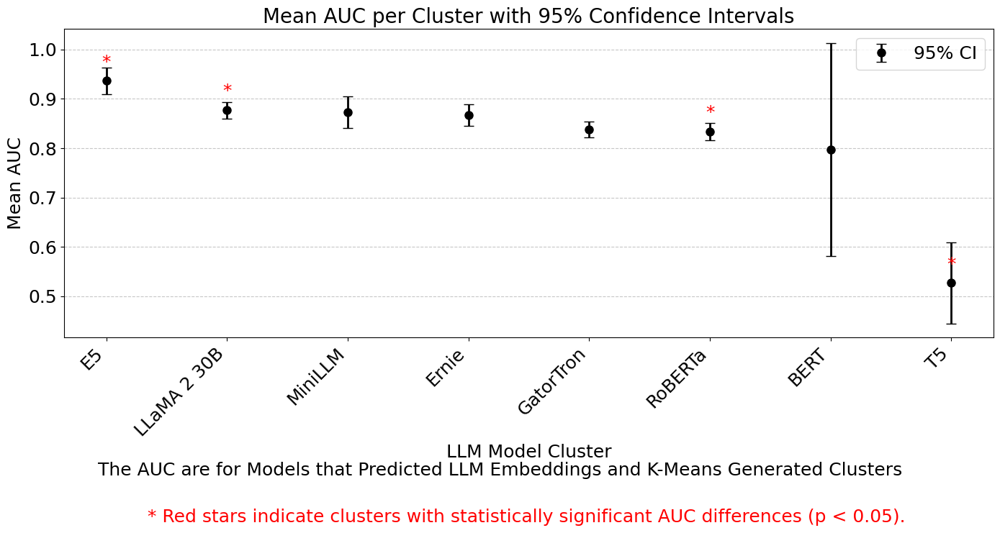

In [8]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Load the dataset
input_file = "best_cluster_per_dataset.csv"
df = pd.read_csv(input_file)

# Convert AUC to numeric and drop missing values
df["AUC"] = pd.to_numeric(df["AUC"], errors="coerce")
df = df.dropna(subset=["AUC"])

# Compute mean, SEM, and 95% Confidence Interval for AUC grouped by cluster
cluster_stats = df.groupby("Cluster")["AUC"].agg(["mean", "count", "std"]).reset_index()
cluster_stats["sem"] = cluster_stats["std"] / np.sqrt(cluster_stats["count"])

# Compute the 95% Confidence Interval
cluster_stats["ci_95"] = cluster_stats["sem"] * stats.t.ppf(0.975, df=cluster_stats["count"] - 1)

# Sort by mean AUC in descending order
cluster_stats = cluster_stats.sort_values(by="mean", ascending=False)

# Perform t-tests to determine significant differences (p < 0.05)
significant_clusters = []
for cluster in cluster_stats["Cluster"]:
    cluster_data = df[df["Cluster"] == cluster]["AUC"]
    other_data = df[df["Cluster"] != cluster]["AUC"]
    
    # Perform independent t-test
    t_stat, p_val = stats.ttest_ind(cluster_data, other_data, equal_var=False, nan_policy='omit')
    
    # Mark significant clusters
    if p_val < 0.05:
        significant_clusters.append(cluster)

# Define corrected cluster renaming dictionary
cluster_labels = {
    "cluster_e5_small": "E5",
    "cluster_llama": "LLaMA 2 30B",
    "cluster_minilm": "MiniLLM",
    "cluster_ernie": "Ernie",
    "cluster_gatortron": "GatorTron",
    "cluster_roberta": "RoBERTa",
    "cluster_bert": "BERT",
    "cluster_t5": "T5"
}

# Apply new labels to x-axis
cluster_stats["Cluster_Label"] = cluster_stats["Cluster"].map(cluster_labels)

# Handle missing labels and enforce string type
cluster_stats["Cluster_Label"] = cluster_stats["Cluster_Label"].fillna("Unknown Cluster").astype(str)

# Check if any missing labels exist
print(cluster_stats[["Cluster", "Cluster_Label"]])

# Plot with 95% Confidence Intervals
plt.figure(figsize=(14, 7))
plt.errorbar(cluster_stats["Cluster_Label"], cluster_stats["mean"], yerr=cluster_stats["ci_95"], fmt='o', 
             color='black', capsize=5, markersize=8, elinewidth=2, label="95% CI")

# Highlight significant clusters
for idx, cluster in enumerate(cluster_stats["Cluster"]):
    if cluster in significant_clusters:
        plt.text(idx, cluster_stats.loc[cluster_stats["Cluster"] == cluster, "mean"].values[0] + 0.02, 
                 "*", ha='center', va='bottom', fontsize=18, color="red")  # Asterisk for significance

# Formatting
plt.xlabel("LLM Model Cluster", fontsize=18)
plt.ylabel("Mean AUC", fontsize=18)
plt.title("Mean AUC per Cluster with 95% Confidence Intervals", fontsize=20)
plt.suptitle("The AUC are for Models that Predicted LLM Embeddings and K-Means Generated Clusters", fontsize=18, y=0.02)

plt.xticks(rotation=45, ha="right", fontsize=18)
plt.yticks(fontsize=18)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.legend(fontsize=18)

# Add explanation below the graph
plt.figtext(0.15, -0.1, "* Red stars indicate clusters with statistically significant AUC differences (p < 0.05).", 
            fontsize=18, color="red", ha="left")

# Show the plot
plt.tight_layout()
plt.show()


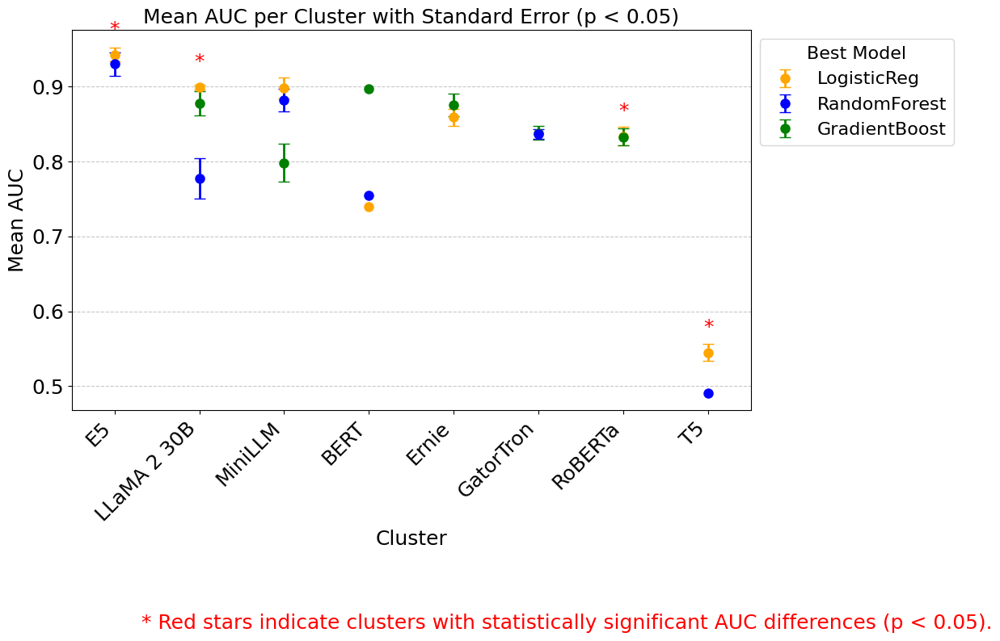

In [46]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv("best_cluster_per_dataset.csv")

# Convert AUC to numeric and drop missing values
df["AUC"] = pd.to_numeric(df["AUC"], errors="coerce")
df = df.dropna(subset=["AUC"])

# **Define cluster label mapping**
cluster_labels = {
    "cluster_e5_small": "E5",
    "cluster_llama": "LLaMA 2 30B",
    "cluster_minilm": "MiniLLM",
    "cluster_ernie": "Ernie",
    "cluster_gatortron": "GatorTron",
    "cluster_roberta": "RoBERTa",
    "cluster_bert": "BERT",
    "cluster_t5": "T5"
}

# **Apply mapping to rename clusters**
df["Cluster_Label"] = df["Cluster"].map(cluster_labels)

# **Compute mean and standard error of AUC grouped by renamed cluster labels**
cluster_stats = df.groupby(["Cluster_Label", "BestModel"])["AUC"].agg(["mean", "sem"]).reset_index()

# **Sort by mean AUC in descending order**
cluster_stats = cluster_stats.sort_values(by="mean", ascending=False)

# **Perform t-tests for statistical significance (p < 0.05)**
significant_clusters = []
for cluster in cluster_stats["Cluster_Label"].unique():
    cluster_data = df[df["Cluster_Label"] == cluster]["AUC"]
    other_data = df[df["Cluster_Label"] != cluster]["AUC"]
    
    t_stat, p_val = stats.ttest_ind(cluster_data, other_data, equal_var=False, nan_policy='omit')
    
    if p_val < 0.05:
        significant_clusters.append(cluster)

# **Color palette for BestModel**
model_palette = {
    "RandomForest": "blue",
    "GradientBoost": "green",
    "LogisticReg": "orange",
    "NA": "gray"
}

# **Set x-axis labels to only the mapped clusters (ensures no extra ticks)**
x_labels = cluster_stats["Cluster_Label"].unique()
x_positions = np.arange(len(x_labels))

# **Adjust figure width dynamically based on number of clusters**
plt.figure(figsize=(max(12, len(x_labels) * 0.7), 7))

# **Plot each cluster with BestModel color**
for idx, row in cluster_stats.iterrows():
    plt.errorbar(row["Cluster_Label"], row["mean"], yerr=row["sem"], fmt='o', 
                 color=model_palette.get(row["BestModel"], "black"), capsize=5, 
                 markersize=8, elinewidth=2, label=row["BestModel"] if row["BestModel"] not in plt.gca().get_legend_handles_labels()[1] else "")

# **Mark only significant clusters with red stars above correct x-ticks**
for cluster in significant_clusters:
    if cluster in x_labels:  # Ensures only plotted clusters get a star
        idx = np.where(x_labels == cluster)[0][0]  # Get the correct x-position
        plt.text(idx, cluster_stats.loc[cluster_stats["Cluster_Label"] == cluster, "mean"].values[0] + 0.02, 
                 "*", ha='center', va='bottom', fontsize=18, color="red")  

# **Formatting**
plt.xlabel("Cluster", fontsize=18)
plt.ylabel("Mean AUC", fontsize=18)
plt.title("Mean AUC per Cluster with Standard Error (p < 0.05)", fontsize=18)
plt.xticks(x_positions, x_labels, rotation=45, ha="right", fontsize=18)
plt.yticks(fontsize=18)

# **Restrict x-axis range to only include valid cluster labels (removes extra space and stars)**
plt.xlim(-0.5, len(x_labels) - 0.5)
plt.margins(x=0.02)  # Reduce excess padding
plt.grid(axis="y", linestyle="--", alpha=0.7)

# **Legend for BestModel colors (Placed outside to avoid overlapping)**
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, labels, title="Best Model", fontsize=16, title_fontsize=16, loc="upper left", bbox_to_anchor=(1, 1))

# **Explanation below the graph**
plt.figtext(0.15, -0.12, "* Red stars indicate clusters with statistically significant AUC differences (p < 0.05).", 
            fontsize=18, color="red", ha="left")

plt.tight_layout()
plt.show()


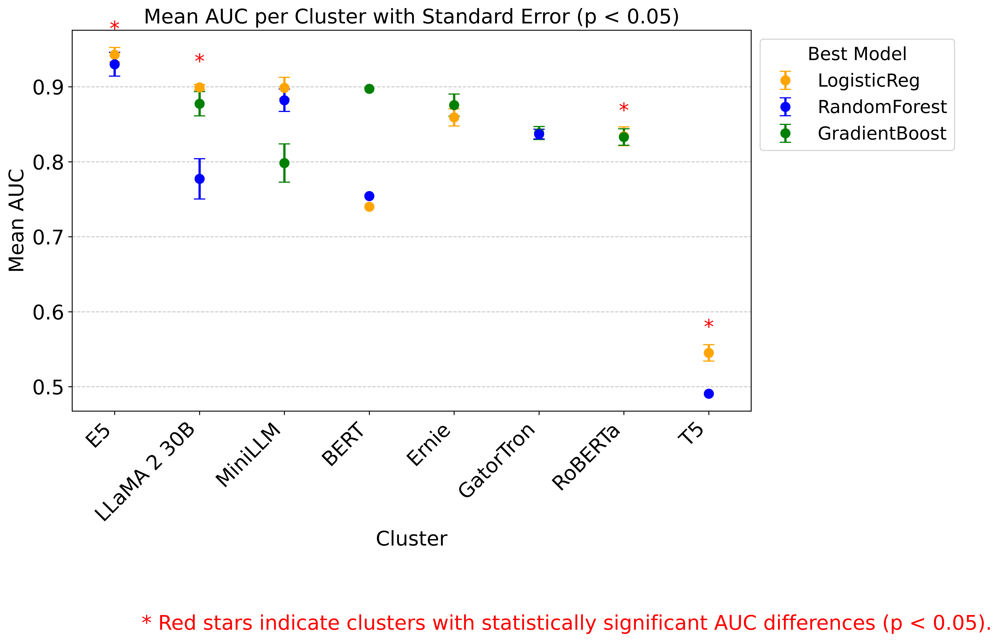


✅ AUC per cluster plot saved as:
  - comparison_plots/auc_per_cluster.jpg
  - comparison_plots/auc_per_cluster.png


In [68]:
import os
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# **File Paths**
DATA_FILE = "best_cluster_per_dataset.csv"
OUTPUT_PLOTS_DIR = "comparison_plots"

# Ensure output directory exists
if not os.path.exists(OUTPUT_PLOTS_DIR):
    os.makedirs(OUTPUT_PLOTS_DIR)

# **Load Dataset**
df = pd.read_csv(DATA_FILE)

# **Convert AUC to numeric and drop missing values**
df["AUC"] = pd.to_numeric(df["AUC"], errors="coerce")
df = df.dropna(subset=["AUC"])

# **Define cluster label mapping**
cluster_labels = {
    "cluster_e5_small": "E5",
    "cluster_llama": "LLaMA 2 30B",
    "cluster_minilm": "MiniLLM",
    "cluster_ernie": "Ernie",
    "cluster_gatortron": "GatorTron",
    "cluster_roberta": "RoBERTa",
    "cluster_bert": "BERT",
    "cluster_t5": "T5"
}

# **Apply mapping to rename clusters**
df["Cluster_Label"] = df["Cluster"].map(cluster_labels)

# **Compute mean and standard error of AUC grouped by renamed cluster labels**
cluster_stats = df.groupby(["Cluster_Label", "BestModel"])["AUC"].agg(["mean", "sem"]).reset_index()

# **Sort by mean AUC in descending order**
cluster_stats = cluster_stats.sort_values(by="mean", ascending=False)

# **Perform t-tests for statistical significance (p < 0.05)**
significant_clusters = []
for cluster in cluster_stats["Cluster_Label"].unique():
    cluster_data = df[df["Cluster_Label"] == cluster]["AUC"]
    other_data = df[df["Cluster_Label"] != cluster]["AUC"]
    
    t_stat, p_val = stats.ttest_ind(cluster_data, other_data, equal_var=False, nan_policy='omit')
    
    if p_val < 0.05:
        significant_clusters.append(cluster)

# **Color palette for BestModel**
model_palette = {
    "RandomForest": "blue",
    "GradientBoost": "green",
    "LogisticReg": "orange",
    "NA": "gray"
}

# **Set x-axis labels to only the mapped clusters (ensures no extra ticks)**
x_labels = cluster_stats["Cluster_Label"].unique()
x_positions = np.arange(len(x_labels))

# **Adjust figure width dynamically based on number of clusters**
plt.figure(figsize=(max(12, len(x_labels) * 0.7), 7), dpi=600)  # High-resolution figure

# **Plot each cluster with BestModel color**
for idx, row in cluster_stats.iterrows():
    plt.errorbar(row["Cluster_Label"], row["mean"], yerr=row["sem"], fmt='o', 
                 color=model_palette.get(row["BestModel"], "black"), capsize=5, 
                 markersize=8, elinewidth=2, label=row["BestModel"] if row["BestModel"] not in plt.gca().get_legend_handles_labels()[1] else "")

# **Mark only significant clusters with red stars above correct x-ticks**
for cluster in significant_clusters:
    if cluster in x_labels:  # Ensures only plotted clusters get a star
        idx = np.where(x_labels == cluster)[0][0]  # Get the correct x-position
        plt.text(idx, cluster_stats.loc[cluster_stats["Cluster_Label"] == cluster, "mean"].values[0] + 0.02, 
                 "*", ha='center', va='bottom', fontsize=18, color="red")  

# **Formatting**
plt.xlabel("Cluster", fontsize=18)
plt.ylabel("Mean AUC", fontsize=18)
plt.title("Mean AUC per Cluster with Standard Error (p < 0.05)", fontsize=18)
plt.xticks(x_positions, x_labels, rotation=45, ha="right", fontsize=18)
plt.yticks(fontsize=18)

# **Restrict x-axis range to only include valid cluster labels (removes extra space and stars)**
plt.xlim(-0.5, len(x_labels) - 0.5)
plt.margins(x=0.02)  # Reduce excess padding
plt.grid(axis="y", linestyle="--", alpha=0.7)

# **Legend for BestModel colors (Placed outside to avoid overlapping)**
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, labels, title="Best Model", fontsize=16, title_fontsize=16, loc="upper left", bbox_to_anchor=(1, 1))

# **Explanation below the graph**
plt.figtext(0.15, -0.12, "* Red stars indicate clusters with statistically significant AUC differences (p < 0.05).", 
            fontsize=18, color="red", ha="left")

plt.tight_layout()

# **Save Plot in both JPEG and PNG formats at 600 DPI**
jpeg_path = os.path.join(OUTPUT_PLOTS_DIR, "auc_per_cluster.jpg")
png_path = os.path.join(OUTPUT_PLOTS_DIR, "auc_per_cluster.png")

plt.savefig(jpeg_path, format="jpeg", dpi=600, bbox_inches="tight")
plt.savefig(png_path, format="png", dpi=600, bbox_inches="tight")

# **Show Plot**
plt.show()

print(f"\n✅ AUC per cluster plot saved as:\n  - {jpeg_path}\n  - {png_path}")


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Dataset        99 non-null     object 
 1   Cluster        99 non-null     object 
 2   BestModel      99 non-null     object 
 3   AUC            99 non-null     float64
 4   Cluster_Label  99 non-null     object 
dtypes: float64(1), object(4)
memory usage: 4.0+ KB


## LLM assisted machine learing with continous outcome variable

In [3]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, r2_score
import statsmodels.api as sm

# File paths
DATA_DIR = "generated_data_with_clusters"
TOP5_FEATURES_FILE = "top5_features_per_dataset.csv"
OUTPUT_DIR = "llm_assisted_regression_results"  # Changed to store results in a separate directory
OUTPUT_FILE = "llm_assisted_regression_results.csv"
RANDOM_SEED = 42

# Ensure output directory exists
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

# Regression Models
REG_MODELS = {
    "LinearReg": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=RANDOM_SEED),
    "GradientBoost": GradientBoostingRegressor(random_state=RANDOM_SEED)
}

# Load the top 5 features dataset
df_top5 = pd.read_csv(TOP5_FEATURES_FILE)

# Store results
results = []

# Iterate over each dataset in the top 5 features file
for index, row in df_top5.iterrows():
    dataset_name = row["Dataset"]
    top5_features = row["Top5_Features"].split(", ")  # Convert to list
    model_name = row["Model"]

    file_path = os.path.join(DATA_DIR, f"{dataset_name}.csv")
    
    if not os.path.exists(file_path):
        print(f"Skipping {dataset_name}: File not found.")
        continue
    
    print(f"Processing {dataset_name} using top 5 features from {model_name} model...")

    # Load dataset
    df = pd.read_csv(file_path)

    # Ensure x3 is numeric (Target variable)
    df["x3"] = pd.to_numeric(df["x3"], errors="coerce")
    df.dropna(subset=["x3"], inplace=True)  # Drop missing x3 values

    # Identify categorical and numeric columns
    numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()
    categorical_features = [col for col in df.columns if col not in numeric_features]

    # Define preprocessing pipeline
    numeric_transformer = SimpleImputer(strategy="median")
    categorical_transformer = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer([
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features)
    ])

    # Preprocess features
    df_processed = preprocessor.fit_transform(df)

    # Extract new feature names after one-hot encoding
    feature_names = numeric_features + list(preprocessor.named_transformers_["cat"].named_steps["encoder"].get_feature_names_out(categorical_features))

    # Map top5 features from original format to one-hot encoded format
    selected_features = [feature for feature in feature_names if any(original in feature for original in top5_features)]

    if not selected_features:
        print(f"   ⚠️ No matching features found in {dataset_name}, skipping.")
        continue

    # Extract X and y
    X = pd.DataFrame(df_processed, columns=feature_names)[selected_features]
    y = df["x3"]

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_SEED)

    # Train and evaluate models
    best_model = None
    best_score = None  # Will store best R² (for LinearReg) or lowest MAE (for others)
    best_equation = None

    for reg_model_name, reg_model in REG_MODELS.items():
        print(f"   Training {reg_model_name}...")
        model = reg_model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        if reg_model_name == "LinearReg":
            # Use R² for Linear Regression (Higher is better)
            score = r2_score(y_test, y_pred)
            
            # Compute regression equation
            X_train_sm = sm.add_constant(X_train)  # Add constant for intercept
            ols_model = sm.OLS(y_train, X_train_sm).fit()
            coefficients = ols_model.params
            equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
        
        else:
            # Use MAE for Random Forest & Gradient Boosting (Lower is better)
            score = mean_absolute_error(y_test, y_pred)
            equation = "Non-linear model (RandomForest / GradientBoosting)"
        
        # Store the best model
        if best_score is None or (reg_model_name == "LinearReg" and score > best_score) or (reg_model_name != "LinearReg" and score < best_score):
            best_score = score
            best_model = reg_model_name
            best_equation = equation

    # Store results
    results.append({
        "Dataset": dataset_name,
        "BestModel": best_model,
        "Score": best_score,
        "Metric": "R2" if best_model == "LinearReg" else "MAE",
        "RegressionEquation": best_equation
    })

# Save results to CSV
results_df = pd.DataFrame(results)
results_df.to_csv(os.path.join(OUTPUT_DIR, OUTPUT_FILE), index=False)
print(f"\n✅ Regression results saved to {OUTPUT_DIR}/{OUTPUT_FILE}.")


Processing data_0_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_0_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_10_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_10_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_11_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_11_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_12_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_12_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_13_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_13_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_14_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_14_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_15_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_15_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_17_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_17_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_18_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_18_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_19_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_19_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_1_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_1_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_20_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_20_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_21_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_21_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_22_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_22_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_23_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_23_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_24_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_24_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_25_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_25_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_26_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_26_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_27_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_27_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_29_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_29_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_2_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_2_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_30_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_30_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_31_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_31_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_32_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_32_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_33_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_33_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_34_cubic using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_34_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_35_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_35_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_36_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_36_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_37_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_37_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_38_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_38_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_39_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_39_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Skipping data_39_quadratic - Copy: File not found.
Skipping data_39_quadratic - Copy: File not found.
Processing data_3_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_3_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_40_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_40_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_41_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_41_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_42_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_42_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_43_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_43_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_44_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_44_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_45_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_45_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_46_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_46_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_47_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_47_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_48_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_48_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_49_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_49_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_4_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_4_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_50_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_50_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_51_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_51_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_52_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_52_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_53_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_53_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_54_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_54_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_55_linear using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_55_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_56_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_56_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_57_linear using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_57_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_58_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_58_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_59_quadratic using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_59_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_5_cubic using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_5_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_60_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_60_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_61_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_61_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_62_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_62_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

Processing data_63_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_63_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

Processing data_64_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_64_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_65_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_65_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_66_linear using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_66_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_67_linear using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_67_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_68_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_68_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_69_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_69_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_6_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_6_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_70_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_70_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_71_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_71_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_72_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

Processing data_72_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_73_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_73_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_74_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_74_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

Processing data_75_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_75_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_76_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_76_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_77_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_77_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_78_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_78_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_79_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_79_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_7_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_7_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_80_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_80_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_81_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_81_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_82_quadratic using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_82_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_83_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_83_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_84_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_84_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_85_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

Processing data_85_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_86_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_86_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


   Training GradientBoost...
Processing data_87_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_87_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_88_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_88_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_89_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_89_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_8_quadratic using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_8_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_90_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_90_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_91_linear using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_91_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_92_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_92_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_93_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_93_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_94_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_94_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_95_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_95_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


Processing data_96_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_96_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

Processing data_97_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_97_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_98_cubic using top 5 features from LogisticReg model...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_98_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_99_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as label

   Training GradientBoost...
Processing data_99_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_9_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_9_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...

✅ Regression results saved to llm_assisted_regression_results/llm_assisted_regression_results.csv.


/tmp/ipykernel_1388/1878129191.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])


## Linear LLM assissted with RMSE and MAE

## Compare LLM assisted and unassisted R2 values 

In [5]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import statsmodels.api as sm

# ---------------------------------------------------------
# CONFIGURATION
# ---------------------------------------------------------
DATA_DIR = "generated_data_with_clusters"               # Input data directory
OUTPUT_DIR = "llm_assisted_linear_results_with_metrics"        # Separate output directory
TOP5_FEATURES_FILE = "top5_features_per_dataset.csv"    # File containing top 5 features
OUTPUT_FILE = os.path.join(OUTPUT_DIR, "llm_assisted_regression_results.csv")
RANDOM_SEED = 42

# Ensure output directory exists
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Regression Models
REG_MODELS = {
    "LinearReg": LinearRegression(),
    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=RANDOM_SEED),
    "GradientBoost": GradientBoostingRegressor(random_state=RANDOM_SEED)
}

# Load the top 5 features dataset
df_top5 = pd.read_csv(TOP5_FEATURES_FILE)

# Store results
results = []

# Iterate over each dataset in the top 5 features file
for index, row in df_top5.iterrows():
    dataset_name = row["Dataset"]
    top5_features = row["Top5_Features"].split(", ")  # Convert to list
    model_name = row["Model"]

    file_path = os.path.join(DATA_DIR, f"{dataset_name}.csv")
    
    if not os.path.exists(file_path):
        print(f"Skipping {dataset_name}: File not found.")
        continue
    
    print(f"Processing {dataset_name} using top 5 features from {model_name} model...")

    # Load dataset
    df = pd.read_csv(file_path)

    # Ensure x3 is numeric (Target variable)
    df["x3"] = pd.to_numeric(df["x3"], errors="coerce")
    df.dropna(subset=["x3"], inplace=True)  # Drop missing x3 values

    # Identify categorical and numeric columns
    numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()
    categorical_features = [col for col in df.columns if col not in numeric_features]

    # Define preprocessing pipeline
    numeric_transformer = SimpleImputer(strategy="median")
    categorical_transformer = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ])

    preprocessor = ColumnTransformer([
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features)
    ])

    # Preprocess features
    df_processed = preprocessor.fit_transform(df)

    # Extract new feature names after one-hot encoding
    feature_names = numeric_features + list(preprocessor.named_transformers_["cat"].named_steps["encoder"].get_feature_names_out(categorical_features))

    # Map top5 features from original format to one-hot encoded format
    selected_features = [feature for feature in feature_names if any(original in feature for original in top5_features)]

    if not selected_features:
        print(f"   ⚠️ No matching features found in {dataset_name}, skipping.")
        continue

    # Extract X and y
    X = pd.DataFrame(df_processed, columns=feature_names)[selected_features]
    y = df["x3"]

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_SEED)

    # Train and evaluate models
    best_model = None
    best_r2 = -np.inf
    best_rmse = np.inf
    best_mae = np.inf
    best_equation = None

    for reg_model_name, reg_model in REG_MODELS.items():
        print(f"   Training {reg_model_name}...")
        model = reg_model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Compute R², RMSE, and MAE
        r2_score_val = r2_score(y_test, y_pred)
        rmse_val = np.sqrt(mean_squared_error(y_test, y_pred))
        mae_val = mean_absolute_error(y_test, y_pred)

        # Compute regression equation for Linear Regression
        if reg_model_name == "LinearReg":
            X_train_sm = sm.add_constant(X_train)  # Add constant for intercept
            ols_model = sm.OLS(y_train, X_train_sm).fit()
            coefficients = ols_model.params
            equation = f"y = {coefficients[0]:.4f} + " + " + ".join([f"{coeff:.4f}*{var}" for coeff, var in zip(coefficients[1:], X_train.columns)])
        else:
            equation = "Non-linear model (RandomForest / GradientBoosting)"

        # Store the best model
        if r2_score_val > best_r2:
            best_r2 = r2_score_val
            best_rmse = rmse_val
            best_mae = mae_val
            best_model = reg_model_name
            best_equation = equation

    # Store results
    results.append({
        "Dataset": dataset_name,
        "BestModel": best_model,
        "R2": best_r2,
        "RMSE": best_rmse,
        "MAE": best_mae,
        "RegressionEquation": best_equation
    })

# Save results to CSV
results_df = pd.DataFrame(results)
results_df.to_csv(OUTPUT_FILE, index=False)
print(f"\n✅ Regression results saved to {OUTPUT_FILE}.")


Processing data_0_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_0_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_10_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_10_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_11_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_11_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_12_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_12_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_13_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_13_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_14_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_14_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_15_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_15_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_17_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_17_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_18_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_18_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_19_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_19_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_1_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_1_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_20_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_20_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_21_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_21_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_22_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_22_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_23_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_23_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_24_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_24_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_25_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_25_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_26_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_26_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_27_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_27_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_29_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_29_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_2_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_2_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_30_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_30_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_31_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_31_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_32_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_32_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_33_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_33_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_34_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_34_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_35_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_35_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_36_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_36_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_37_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_37_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_38_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_38_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_39_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_39_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Skipping data_39_quadratic - Copy: File not found.
Skipping data_39_quadratic - Copy: File not found.
Processing data_3_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_3_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_40_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_40_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_41_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_41_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_42_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_42_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_43_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_43_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_44_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_44_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_45_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_45_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_46_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_46_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_47_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_47_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_48_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_48_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_49_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_49_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_4_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_4_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_50_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_50_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_51_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training RandomForest...
   Training GradientBoost...
Processing data_51_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_52_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_52_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_53_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_53_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_54_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_54_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_55_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_55_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_56_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_56_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_57_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_57_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_58_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_58_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_59_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_59_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_5_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_5_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_60_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_60_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_61_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_61_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_62_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_62_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_63_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_63_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_64_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_64_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_65_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_65_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_66_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_66_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_67_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_67_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_68_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_68_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_69_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_69_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_6_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_6_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_70_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_70_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_71_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_71_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_72_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_72_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_73_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_73_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_74_linear using top 5 features from LogisticReg model...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_74_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_75_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_75_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_76_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_76_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_77_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_77_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_78_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_78_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_79_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_79_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_7_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_7_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_80_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_80_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_81_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_81_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_82_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_82_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_83_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_83_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_84_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_84_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_85_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_85_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_86_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_86_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_87_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_87_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_88_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_88_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Processing data_89_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_89_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_8_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_8_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_90_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_90_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_91_linear using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_91_linear using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_92_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_92_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_93_exponential using top 5 features from LogisticReg model...
   Training LinearReg...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training RandomForest...
   Training GradientBoost...
Processing data_93_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_94_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_94_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_95_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_95_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_96_cubic using top 5 features from LogisticReg model...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_96_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_97_quadratic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_97_quadratic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_98_cubic using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_98_cubic using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_99_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_99_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...
Processing data_9_exponential using top 5 features from LogisticReg model...
   Training LinearReg...
   Training RandomForest...
   Training GradientBoost...
Processing data_9_exponential using top 5 features from XGBoost model...
   Training LinearReg...
   Training RandomForest...


Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


   Training GradientBoost...

✅ Regression results saved to llm_assisted_linear_results_with_metrics/llm_assisted_regression_results.csv.



Merged DataFrame Head:
                Dataset  R2_unassisted    R2_llm
0    data_79_quadratic       0.629980  0.003649
1    data_79_quadratic       0.629980  0.625863
2       data_91_linear       0.939596 -0.022295
3       data_91_linear       0.939596  0.389276
4  data_44_exponential      -0.052617 -0.021492

Paired t-test results: t-statistic = 7.1499, p-value = 0.0000

Wilcoxon signed-rank test results: W-statistic = 6383.0000, p-value = 0.0000


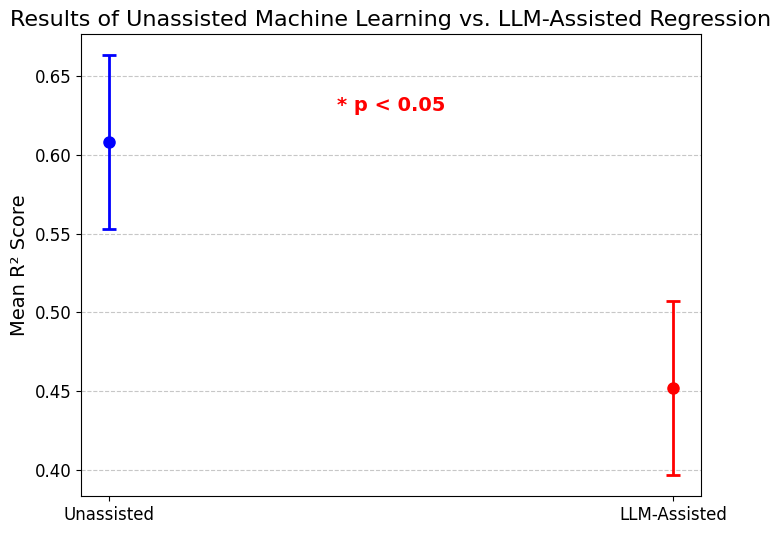

In [54]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Load datasets
unassisted_df = pd.read_csv("unassisted_linear_model_results.csv")
llm_assisted_df = pd.read_csv("llm_assisted_regression_results.csv")

# Merge datasets on 'Dataset' column
merged_df = pd.merge(unassisted_df[['Dataset', 'R2']], llm_assisted_df[['Dataset', 'R2']], on='Dataset', suffixes=('_unassisted', '_llm'))

# Display the merged dataframe's header
print("\nMerged DataFrame Head:\n", merged_df.head())

# Compute mean and 95% confidence intervals
def mean_confidence_interval(data, confidence=0.95):
    """Compute mean and confidence interval for a dataset."""
    mean_val = np.mean(data)
    sem = stats.sem(data)  # Standard error of the mean
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1)
    return mean_val, mean_val - margin, mean_val + margin

# Calculate statistics for both methods
mean_unassisted, ci_low_unassisted, ci_high_unassisted = mean_confidence_interval(merged_df["R2_unassisted"])
mean_llm, ci_low_llm, ci_high_llm = mean_confidence_interval(merged_df["R2_llm"])

# Perform Paired t-test (assumes normality)
t_stat, p_ttest = stats.ttest_rel(merged_df["R2_unassisted"], merged_df["R2_llm"])
print(f"\nPaired t-test results: t-statistic = {t_stat:.4f}, p-value = {p_ttest:.4f}")

# Perform Wilcoxon signed-rank test (non-parametric)
w_stat, p_wilcoxon = stats.wilcoxon(merged_df["R2_unassisted"], merged_df["R2_llm"])
print(f"\nWilcoxon signed-rank test results: W-statistic = {w_stat:.4f}, p-value = {p_wilcoxon:.4f}")

# Prepare data for visualization
methods = ["Unassisted", "LLM-Assisted"]
means = [mean_unassisted, mean_llm]
ci_lows = [ci_low_unassisted, ci_low_llm]
ci_highs = [ci_high_unassisted, ci_high_llm]
colors = ["blue", "red"]

# Plot mean with confidence intervals
plt.figure(figsize=(8, 6))

for i, method in enumerate(methods):
    plt.errorbar(
        method, means[i], 
        yerr=[[means[i] - ci_lows[i]], [ci_highs[i] - means[i]]], 
        fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color=colors[i]
    )

# Highlight statistical significance
if p_ttest < 0.05:
    plt.text(0.5, max(means) + 0.02, "* p < 0.05", ha="center", fontsize=14, color="red", fontweight="bold")

# Formatting
plt.ylabel("Mean R² Score", fontsize=14)
plt.title("Results of Unassisted Machine Learning vs. LLM-Assisted Regression", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Save and Show
plt.savefig("mean_confidence_interval_plot.png", dpi=300, bbox_inches="tight")
plt.show()


In [61]:
unassisted_df['BestModel'].value_counts()

BestModel
LinearReg        65
GradientBoost    23
RandomForest     12
Name: count, dtype: int64

## Compare appropriate metrics for LLM assisted and unassisted

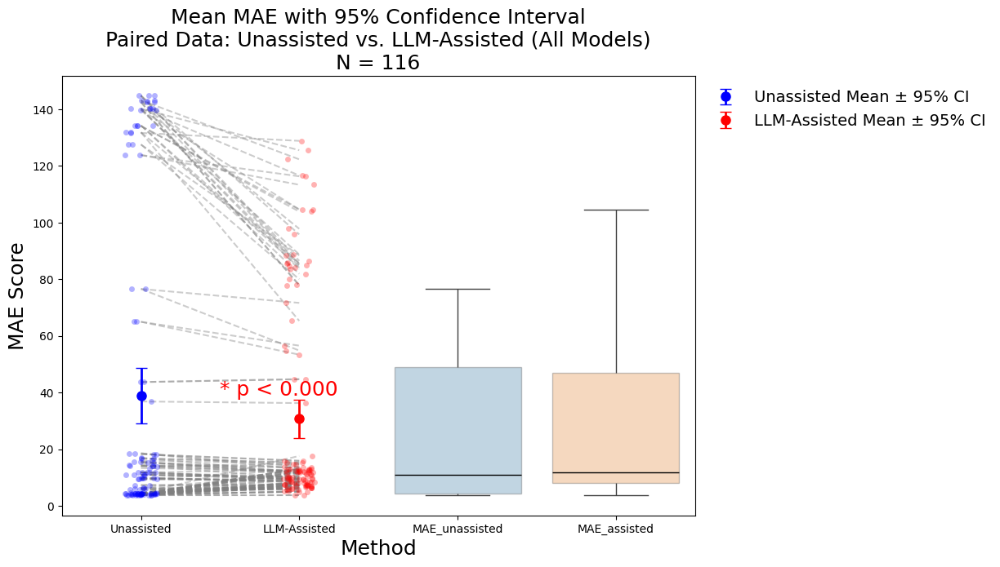


✅ MAE comparison plot saved to comparison_plots/MAE_Comparison_AllModels.png


In [4]:
import os
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
ASSISTED_FILE = "llm_assisted_linear_results_with_metrics/llm_assisted_regression_results.csv"
UNASSISTED_FILE = "numeric_x3_results_extended/unassisted_model_results_extended.csv"
OUTPUT_PLOTS_DIR = "comparison_plots"
CONFIDENCE = 0.95
FONT_SIZE = 18

# Ensure output directory exists
if not os.path.exists(OUTPUT_PLOTS_DIR):
    os.makedirs(OUTPUT_PLOTS_DIR)

# ---------------------------------------------------------
# LOAD DATA
# ---------------------------------------------------------
df_assisted = pd.read_csv(ASSISTED_FILE)
df_unassisted = pd.read_csv(UNASSISTED_FILE)

# Drop invalid R², RMSE, and MAE values
df_assisted = df_assisted[df_assisted["R2"] > 0.2]
df_unassisted = df_unassisted[df_unassisted["R2"] > 0.2]

# Merge datasets on 'Dataset'
df_merged = pd.merge(df_unassisted, df_assisted, on="Dataset", suffixes=("_unassisted", "_assisted"))

# ---------------------------------------------------------
# FUNCTION TO COMPUTE MEAN AND 95% CONFIDENCE INTERVAL
# ---------------------------------------------------------
def mean_confidence_interval(data, confidence=0.95):
    mean_val = np.mean(data)
    sem = stats.sem(data) if len(data) > 1 else 0
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1) if len(data) > 1 else 0
    return mean_val, mean_val - margin, mean_val + margin

# ---------------------------------------------------------
# PLOT MAE COMPARISON ACROSS ALL MODELS
# ---------------------------------------------------------
plt.figure(figsize=(10, 7))

# **Plot individual paired points**
for i in range(len(df_merged)):
    plt.plot(["Unassisted", "LLM-Assisted"], 
             [df_merged.iloc[i]["MAE_unassisted"], df_merged.iloc[i]["MAE_assisted"]],
             linestyle="dashed", color="gray", alpha=0.4)

# **Scatter plots for individual points**
sns.stripplot(x=["Unassisted"] * len(df_merged), y=df_merged["MAE_unassisted"], jitter=True, alpha=0.3, color="blue")
sns.stripplot(x=["LLM-Assisted"] * len(df_merged), y=df_merged["MAE_assisted"], jitter=True, alpha=0.3, color="red")

# **Compute and plot mean ± 95% CI**
mean_unassisted, ci_low_unassisted, ci_high_unassisted = mean_confidence_interval(df_merged["MAE_unassisted"])
mean_assisted, ci_low_assisted, ci_high_assisted = mean_confidence_interval(df_merged["MAE_assisted"])

plt.errorbar("Unassisted", mean_unassisted, 
             yerr=[[mean_unassisted - ci_low_unassisted], [ci_high_unassisted - mean_unassisted]],
             fmt='o', capsize=5, markersize=8, elinewidth=2, color="blue", label="Unassisted Mean ± 95% CI")

plt.errorbar("LLM-Assisted", mean_assisted, 
             yerr=[[mean_assisted - ci_low_assisted], [ci_high_assisted - mean_assisted]],
             fmt='o', capsize=5, markersize=8, elinewidth=2, color="red", label="LLM-Assisted Mean ± 95% CI")

# **Boxplots for overall distribution**
sns.boxplot(data=df_merged[["MAE_unassisted", "MAE_assisted"]], 
            orient="v", showfliers=False, boxprops=dict(alpha=0.3), 
            medianprops=dict(color="black"))

# **Statistical Test**
t_stat, p_val = stats.ttest_rel(df_merged["MAE_unassisted"], df_merged["MAE_assisted"])
plt.text(0.5, mean_unassisted, f"* p < {p_val:.3f}" if p_val < 0.05 else f"p = {p_val:.3f}", fontsize=FONT_SIZE, color="red")

# **Formatting**
plt.xlabel("Method", fontsize=FONT_SIZE)
plt.ylabel("MAE Score", fontsize=FONT_SIZE)
plt.title(f"Mean MAE with 95% Confidence Interval\n"
          f"Paired Data: Unassisted vs. LLM-Assisted (All Models)\nN = {len(df_merged)}",
          fontsize=FONT_SIZE)

# **Move legend outside the plot**
plt.legend(fontsize=FONT_SIZE-4, loc="upper left", bbox_to_anchor=(1, 1), frameon=False)

# Save Plot
plot_path = os.path.join(OUTPUT_PLOTS_DIR, "MAE_Comparison_AllModels.png")
plt.savefig(plot_path, bbox_inches="tight", dpi=300)
plt.show()

print(f"\n✅ MAE comparison plot saved to {plot_path}")


In [44]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116 entries, 0 to 115
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Dataset               116 non-null    object 
 1   BestModel_unassisted  116 non-null    object 
 2   R2_unassisted         116 non-null    float64
 3   RMSE_unassisted       116 non-null    float64
 4   MAE_unassisted        116 non-null    float64
 5   TopFeatures           116 non-null    object 
 6   BestModel_assisted    116 non-null    object 
 7   R2_assisted           116 non-null    float64
 8   RMSE_assisted         116 non-null    float64
 9   MAE_assisted          116 non-null    float64
 10  RegressionEquation    116 non-null    object 
 11  LLM_Better            116 non-null    bool   
dtypes: bool(1), float64(6), object(5)
memory usage: 10.2+ KB


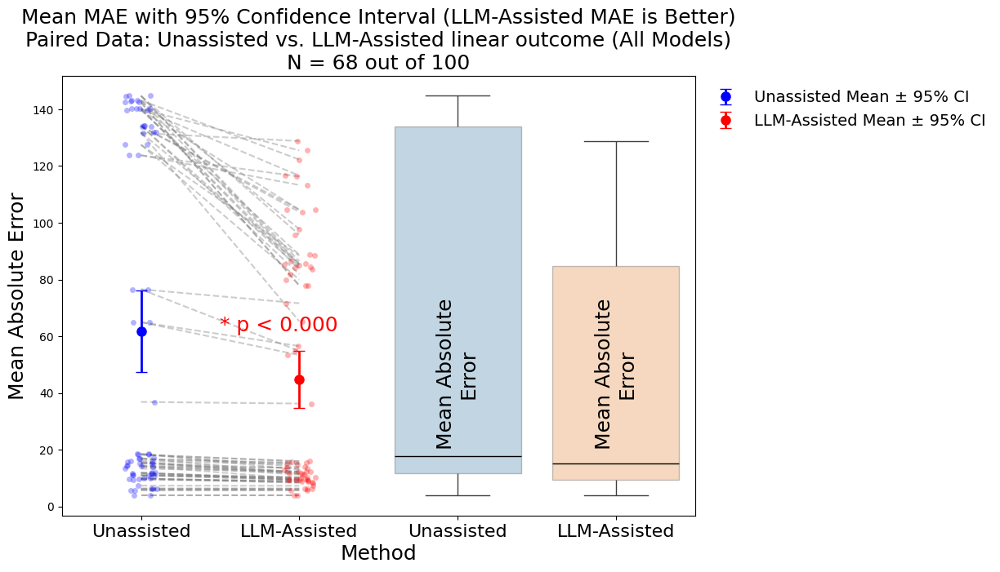


✅ MAE comparison plot saved to comparison_plots/MAE_Comparison_LLM_Better.png


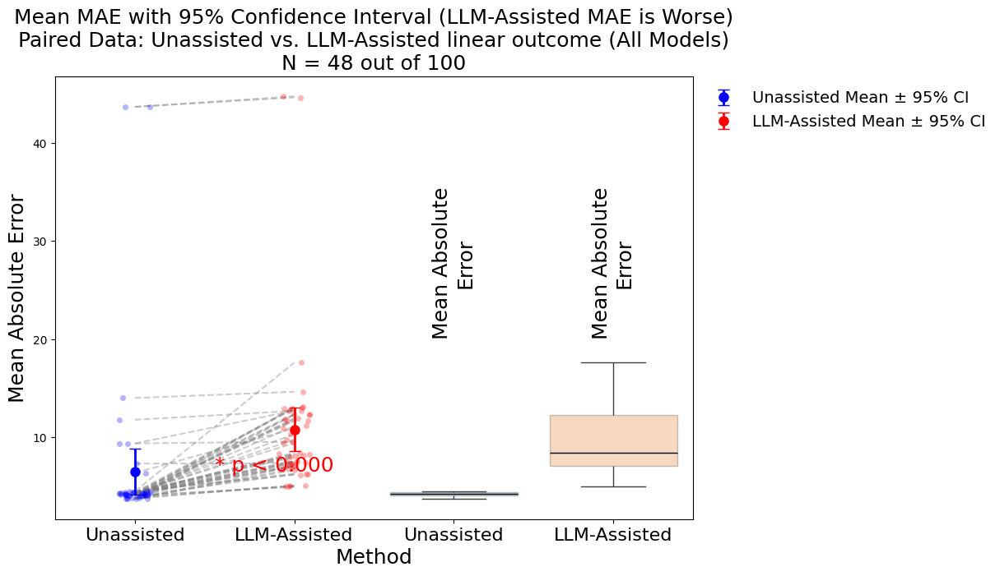


✅ MAE comparison plot saved to comparison_plots/MAE_Comparison_LLM_Worse.png


In [41]:
import os
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
ASSISTED_FILE = "llm_assisted_linear_results_with_metrics/llm_assisted_regression_results.csv"
UNASSISTED_FILE = "numeric_x3_results_extended/unassisted_model_results_extended.csv"
OUTPUT_PLOTS_DIR = "comparison_plots"
CONFIDENCE = 0.95
FONT_SIZE = 18

# Ensure output directory exists
if not os.path.exists(OUTPUT_PLOTS_DIR):
    os.makedirs(OUTPUT_PLOTS_DIR)

# ---------------------------------------------------------
# LOAD DATA
# ---------------------------------------------------------
df_assisted = pd.read_csv(ASSISTED_FILE)
df_unassisted = pd.read_csv(UNASSISTED_FILE)

# Drop invalid R², RMSE, and MAE values
df_assisted = df_assisted[df_assisted["R2"] > 0.2]
df_unassisted = df_unassisted[df_unassisted["R2"] > 0.2]

# Merge datasets on 'Dataset'
df_merged = pd.merge(df_unassisted, df_assisted, on="Dataset", suffixes=("_unassisted", "_assisted"))

# Create a column to classify LLM impact
df_merged["LLM_Better"] = df_merged["MAE_assisted"] < df_merged["MAE_unassisted"]

# Split into two groups
df_better = df_merged[df_merged["LLM_Better"]]
df_worse = df_merged[~df_merged["LLM_Better"]]

# ---------------------------------------------------------
# FUNCTION TO COMPUTE MEAN AND 95% CONFIDENCE INTERVAL
# ---------------------------------------------------------
def mean_confidence_interval(data, confidence=0.95):
    mean_val = np.mean(data)
    sem = stats.sem(data) if len(data) > 1 else 0
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1) if len(data) > 1 else 0
    return mean_val, mean_val - margin, mean_val + margin

# ---------------------------------------------------------
# FUNCTION TO GENERATE MAE COMPARISON PLOTS
# ---------------------------------------------------------
def plot_mae_comparison(df_subset, title_suffix, file_suffix):
    plt.figure(figsize=(10, 7))

    # **Plot individual paired points**
    for i in range(len(df_subset)):
        plt.plot(["Unassisted", "LLM-Assisted"], 
                 [df_subset.iloc[i]["MAE_unassisted"], df_subset.iloc[i]["MAE_assisted"]],
                 linestyle="dashed", color="gray", alpha=0.4)

    # **Scatter plots for individual points**
    sns.stripplot(x=["Unassisted"] * len(df_subset), y=df_subset["MAE_unassisted"], jitter=True, alpha=0.3, color="blue")
    sns.stripplot(x=["LLM-Assisted"] * len(df_subset), y=df_subset["MAE_assisted"], jitter=True, alpha=0.3, color="red")

    # **Compute and plot mean ± 95% CI**
    mean_unassisted, ci_low_unassisted, ci_high_unassisted = mean_confidence_interval(df_subset["MAE_unassisted"])
    mean_assisted, ci_low_assisted, ci_high_assisted = mean_confidence_interval(df_subset["MAE_assisted"])

    plt.errorbar("Unassisted", mean_unassisted, 
                 yerr=[[mean_unassisted - ci_low_unassisted], [ci_high_unassisted - mean_unassisted]],
                 fmt='o', capsize=5, markersize=8, elinewidth=2, color="blue", label="Unassisted Mean ± 95% CI")

    plt.errorbar("LLM-Assisted", mean_assisted, 
                 yerr=[[mean_assisted - ci_low_assisted], [ci_high_assisted - mean_assisted]],
                 fmt='o', capsize=5, markersize=8, elinewidth=2, color="red", label="LLM-Assisted Mean ± 95% CI")

    # **Boxplots for overall distribution**
    boxplot = sns.boxplot(data=df_subset[["MAE_unassisted", "MAE_assisted"]], 
                          orient="v", showfliers=False, boxprops=dict(alpha=0.3), 
                          medianprops=dict(color="black"))

    # **Statistical Test**
    t_stat, p_val = stats.ttest_rel(df_subset["MAE_unassisted"], df_subset["MAE_assisted"])
    plt.text(0.5, mean_unassisted, f"* p < {p_val:.3f}" if p_val < 0.05 else f"p = {p_val:.3f}", 
             fontsize=FONT_SIZE, color="red")

    # **Formatting**
    plt.xlabel("Method", fontsize=FONT_SIZE)
    plt.ylabel("Mean Absolute Error", fontsize=FONT_SIZE)
    plt.title(f"Mean MAE with 95% Confidence Interval ({title_suffix})\n"
              f"Paired Data: Unassisted vs. LLM-Assisted linear outcome (All Models)\nN = {len(df_subset)} out of 100",
              fontsize=FONT_SIZE)

    # **Move legend outside the plot**
    plt.legend(fontsize=FONT_SIZE-4, loc="upper left", bbox_to_anchor=(1, 1), frameon=False)

    # **Fix x-tick labels using explicit tick positions**
    tick_positions = [0, 1, 2, 3]  # 4 x-ticks
    tick_labels = ["Unassisted", "LLM-Assisted", "Unassisted", "LLM-Assisted"]
    plt.xticks(ticks=tick_positions, labels=tick_labels, fontsize=16)

    # **Move "Mean Absolute Error" text higher on second boxplot (around y=20)**
    plt.text(3, 20, "Mean Absolute\nError", fontsize=FONT_SIZE, rotation=90, ha="center", va="bottom")
    plt.text(2, 20, "Mean Absolute\nError", fontsize=FONT_SIZE, rotation=90, ha="center", va="bottom")
    # Save Plot
    plot_path = os.path.join(OUTPUT_PLOTS_DIR, f"MAE_Comparison_{file_suffix}.png")
    plt.savefig(plot_path, bbox_inches="tight", dpi=300)
    plt.show()

    print(f"\n✅ MAE comparison plot saved to {plot_path}")

# ---------------------------------------------------------
# GENERATE BOTH PLOTS
# ---------------------------------------------------------
if not df_better.empty:
    plot_mae_comparison(df_better, "LLM-Assisted MAE is Better", "LLM_Better")

if not df_worse.empty:
    plot_mae_comparison(df_worse, "LLM-Assisted MAE is Worse", "LLM_Worse")


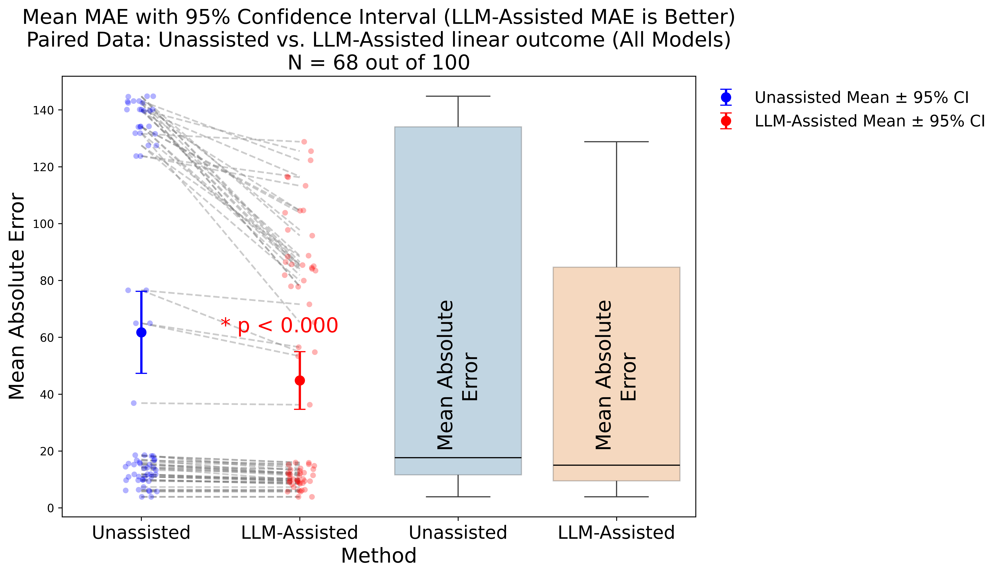


✅ MAE comparison plot saved as:
  - comparison_plots/MAE_Comparison_LLM_Better.jpg
  - comparison_plots/MAE_Comparison_LLM_Better.png


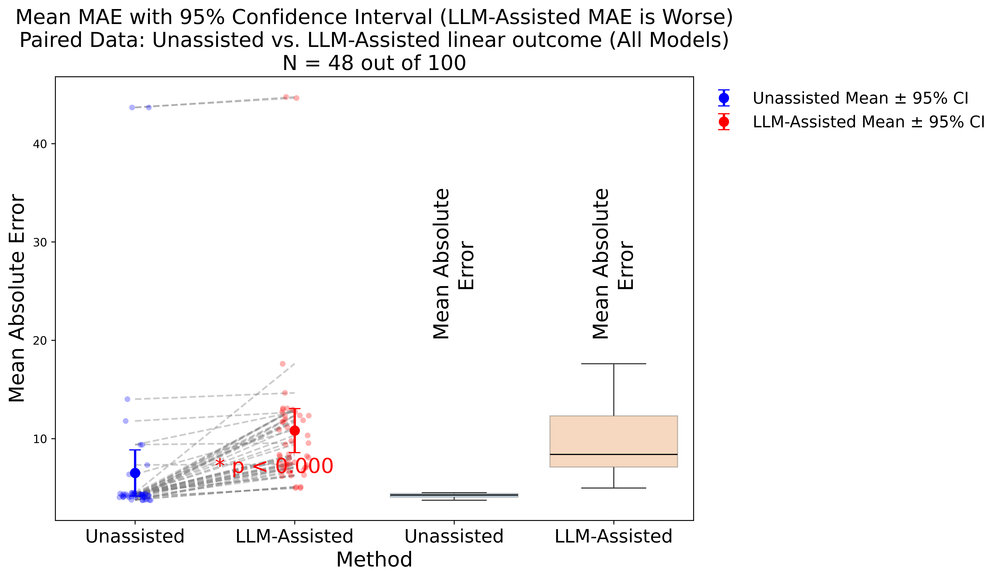


✅ MAE comparison plot saved as:
  - comparison_plots/MAE_Comparison_LLM_Worse.jpg
  - comparison_plots/MAE_Comparison_LLM_Worse.png


In [64]:
import os
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
ASSISTED_FILE = "llm_assisted_linear_results_with_metrics/llm_assisted_regression_results.csv"
UNASSISTED_FILE = "numeric_x3_results_extended/unassisted_model_results_extended.csv"
OUTPUT_PLOTS_DIR = "comparison_plots"
CONFIDENCE = 0.95
FONT_SIZE = 18

# Ensure output directory exists
if not os.path.exists(OUTPUT_PLOTS_DIR):
    os.makedirs(OUTPUT_PLOTS_DIR)

# ---------------------------------------------------------
# LOAD DATA
# ---------------------------------------------------------
df_assisted = pd.read_csv(ASSISTED_FILE)
df_unassisted = pd.read_csv(UNASSISTED_FILE)

# Drop invalid R², RMSE, and MAE values
df_assisted = df_assisted[df_assisted["R2"] > 0.2]
df_unassisted = df_unassisted[df_unassisted["R2"] > 0.2]

# Merge datasets on 'Dataset'
df_merged = pd.merge(df_unassisted, df_assisted, on="Dataset", suffixes=("_unassisted", "_assisted"))

# Create a column to classify LLM impact
df_merged["LLM_Better"] = df_merged["MAE_assisted"] < df_merged["MAE_unassisted"]

# Split into two groups
df_better = df_merged[df_merged["LLM_Better"]]
df_worse = df_merged[~df_merged["LLM_Better"]]

# ---------------------------------------------------------
# FUNCTION TO COMPUTE MEAN AND 95% CONFIDENCE INTERVAL
# ---------------------------------------------------------
def mean_confidence_interval(data, confidence=0.95):
    mean_val = np.mean(data)
    sem = stats.sem(data) if len(data) > 1 else 0
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1) if len(data) > 1 else 0
    return mean_val, mean_val - margin, mean_val + margin

# ---------------------------------------------------------
# FUNCTION TO GENERATE MAE COMPARISON PLOTS
# ---------------------------------------------------------
def plot_mae_comparison(df_subset, title_suffix, file_suffix):
    plt.figure(figsize=(10, 7), dpi=600)  # Ensure high-resolution output

    # **Plot individual paired points**
    for i in range(len(df_subset)):
        plt.plot(["Unassisted", "LLM-Assisted"], 
                 [df_subset.iloc[i]["MAE_unassisted"], df_subset.iloc[i]["MAE_assisted"]],
                 linestyle="dashed", color="gray", alpha=0.4)

    # **Scatter plots for individual points**
    sns.stripplot(x=["Unassisted"] * len(df_subset), y=df_subset["MAE_unassisted"], jitter=True, alpha=0.3, color="blue")
    sns.stripplot(x=["LLM-Assisted"] * len(df_subset), y=df_subset["MAE_assisted"], jitter=True, alpha=0.3, color="red")

    # **Compute and plot mean ± 95% CI**
    mean_unassisted, ci_low_unassisted, ci_high_unassisted = mean_confidence_interval(df_subset["MAE_unassisted"])
    mean_assisted, ci_low_assisted, ci_high_assisted = mean_confidence_interval(df_subset["MAE_assisted"])

    plt.errorbar("Unassisted", mean_unassisted, 
                 yerr=[[mean_unassisted - ci_low_unassisted], [ci_high_unassisted - mean_unassisted]],
                 fmt='o', capsize=5, markersize=8, elinewidth=2, color="blue", label="Unassisted Mean ± 95% CI")

    plt.errorbar("LLM-Assisted", mean_assisted, 
                 yerr=[[mean_assisted - ci_low_assisted], [ci_high_assisted - mean_assisted]],
                 fmt='o', capsize=5, markersize=8, elinewidth=2, color="red", label="LLM-Assisted Mean ± 95% CI")

    # **Boxplots for overall distribution**
    sns.boxplot(data=df_subset[["MAE_unassisted", "MAE_assisted"]], 
                orient="v", showfliers=False, boxprops=dict(alpha=0.3), 
                medianprops=dict(color="black"))

    # **Statistical Test**
    t_stat, p_val = stats.ttest_rel(df_subset["MAE_unassisted"], df_subset["MAE_assisted"])
    plt.text(0.5, mean_unassisted, f"* p < {p_val:.3f}" if p_val < 0.05 else f"p = {p_val:.3f}", 
             fontsize=FONT_SIZE, color="red")

    # **Formatting**
    plt.xlabel("Method", fontsize=FONT_SIZE)
    plt.ylabel("Mean Absolute Error", fontsize=FONT_SIZE)
    plt.title(f"Mean MAE with 95% Confidence Interval ({title_suffix})\n"
              f"Paired Data: Unassisted vs. LLM-Assisted linear outcome (All Models)\nN = {len(df_subset)} out of 100",
              fontsize=FONT_SIZE)

    # **Move legend outside the plot**
    plt.legend(fontsize=FONT_SIZE-4, loc="upper left", bbox_to_anchor=(1, 1), frameon=False)

    # **Fix x-tick labels using explicit tick positions**
    tick_positions = [0, 1, 2, 3]  # 4 x-ticks
    tick_labels = ["Unassisted", "LLM-Assisted", "Unassisted", "LLM-Assisted"]
    plt.xticks(ticks=tick_positions, labels=tick_labels, fontsize=16)

    # **Move "Mean Absolute Error" text higher on second boxplot (around y=20)**
    plt.text(3, 20, "Mean Absolute\nError", fontsize=FONT_SIZE, rotation=90, ha="center", va="bottom")
    plt.text(2, 20, "Mean Absolute\nError", fontsize=FONT_SIZE, rotation=90, ha="center", va="bottom")

    # **Save the plot in both JPEG and PNG formats at 600 DPI**
    jpeg_path = os.path.join(OUTPUT_PLOTS_DIR, f"MAE_Comparison_{file_suffix}.jpg")
    png_path = os.path.join(OUTPUT_PLOTS_DIR, f"MAE_Comparison_{file_suffix}.png")
    
    plt.savefig(jpeg_path, format="jpeg", dpi=600, bbox_inches="tight")
    plt.savefig(png_path, format="png", dpi=600, bbox_inches="tight")

    # **Show plot**
    plt.show()

    print(f"\n✅ MAE comparison plot saved as:\n  - {jpeg_path}\n  - {png_path}")

# ---------------------------------------------------------
# GENERATE BOTH PLOTS
# ---------------------------------------------------------
if not df_better.empty:
    plot_mae_comparison(df_better, "LLM-Assisted MAE is Better", "LLM_Better")

if not df_worse.empty:
    plot_mae_comparison(df_worse, "LLM-Assisted MAE is Worse", "LLM_Worse")


                 Metric LLM Better (Mean ± SD) LLM Worse (Mean ± SD)  \
0    NumCategoricalVars          19.39 ± 11.87         22.95 ± 10.89   
1  SubjectVariableRatio          33.70 ± 25.78         25.66 ± 17.68   

        p-value  
0  1.320923e-09  
1  2.505316e-12  


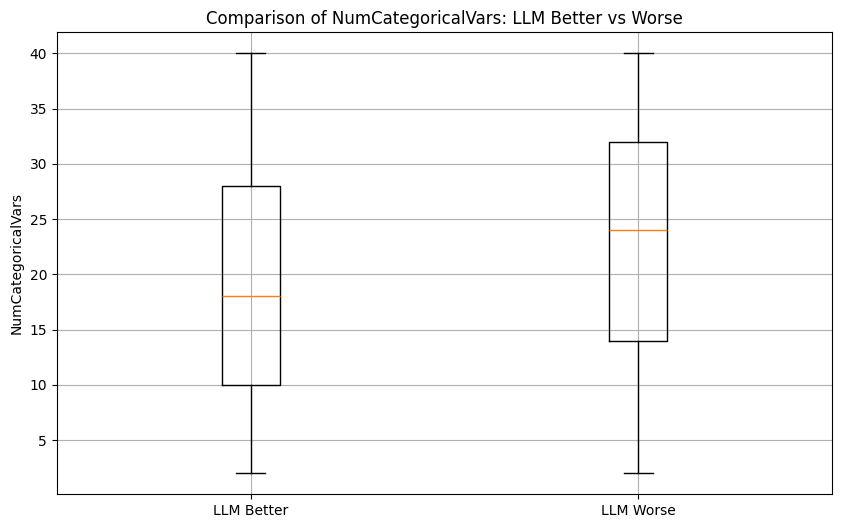

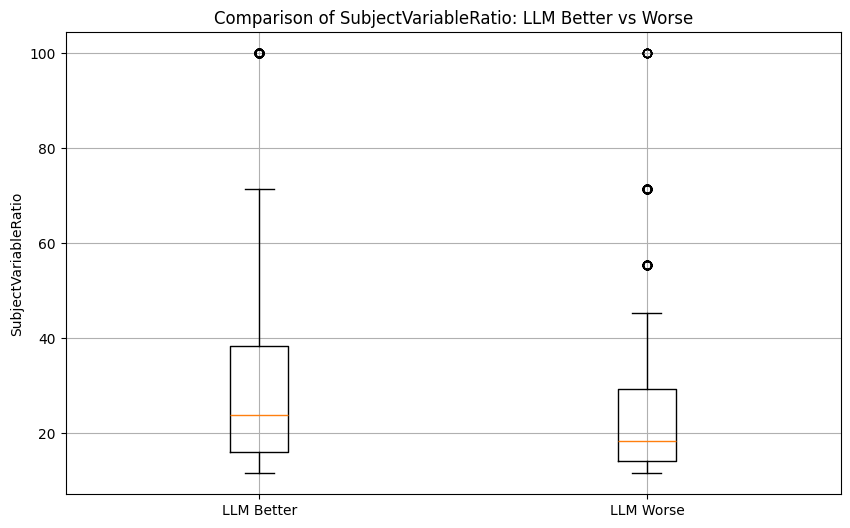

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

# Load previous results (df_merged) and merged_results.csv
df_merged = pd.read_csv("llm_assisted_regression_results.csv")  # Adjust path if necessary
df_cluster = pd.read_csv("merged_results.csv")  # Load the new dataset

# Merge on "Dataset" to align results
df_combined = df_merged.merge(df_cluster, on="Dataset", suffixes=("_llm", "_cluster"))

# Determine whether LLM-assisted is better or worse
df_combined["LLM_Better"] = df_combined["R2_llm"] > df_combined["R2_cluster"]

# Separate groups
df_llm_better = df_combined[df_combined["LLM_Better"]]
df_llm_worse = df_combined[~df_combined["LLM_Better"]]

# Compute mean and standard deviation for comparison
stats_summary = pd.DataFrame({
    "Metric": ["NumCategoricalVars", "SubjectVariableRatio"],
    "LLM Better (Mean ± SD)": [
        f"{df_llm_better['NumCategoricalVars'].mean():.2f} ± {df_llm_better['NumCategoricalVars'].std():.2f}",
        f"{df_llm_better['SubjectVariableRatio'].mean():.2f} ± {df_llm_better['SubjectVariableRatio'].std():.2f}"
    ],
    "LLM Worse (Mean ± SD)": [
        f"{df_llm_worse['NumCategoricalVars'].mean():.2f} ± {df_llm_worse['NumCategoricalVars'].std():.2f}",
        f"{df_llm_worse['SubjectVariableRatio'].mean():.2f} ± {df_llm_worse['SubjectVariableRatio'].std():.2f}"
    ],
    "p-value": [
        stats.ttest_ind(df_llm_better["NumCategoricalVars"], df_llm_worse["NumCategoricalVars"], equal_var=False).pvalue,
        stats.ttest_ind(df_llm_better["SubjectVariableRatio"], df_llm_worse["SubjectVariableRatio"], equal_var=False).pvalue
    ]
})

# Print summary statistics
print(stats_summary)

# Plot NumCategoricalVars comparison
plt.figure(figsize=(10, 6))
plt.boxplot([df_llm_better["NumCategoricalVars"], df_llm_worse["NumCategoricalVars"]], labels=["LLM Better", "LLM Worse"])
plt.title("Comparison of NumCategoricalVars: LLM Better vs Worse")
plt.ylabel("NumCategoricalVars")
plt.grid(True)
plt.show()

# Plot SubjectVariableRatio comparison
plt.figure(figsize=(10, 6))
plt.boxplot([df_llm_better["SubjectVariableRatio"], df_llm_worse["SubjectVariableRatio"]], labels=["LLM Better", "LLM Worse"])
plt.title("Comparison of SubjectVariableRatio: LLM Better vs Worse")
plt.ylabel("SubjectVariableRatio")
plt.grid(True)
plt.show()


## Assisted and unassisted R2 for Subject Variable Ratio < 20 and Number of Categorical Variables > 25


Filtered DataFrame Head:
                 Dataset  R2_unassisted    R2_llm  SubjectVariableRatio  \
32  data_44_exponential      -0.052617 -0.021492             23.809524   
33  data_44_exponential      -0.052617 -0.021492             23.809524   
34  data_44_exponential      -0.052617 -0.021492             23.809524   
35  data_44_exponential      -0.052617 -0.021492             23.809524   
36  data_44_exponential      -0.052617 -0.021492             23.809524   

    NumCategoricalVars  
32                18.0  
33                18.0  
34                18.0  
35                18.0  
36                18.0  

Paired t-test results: t-statistic = 10.6641, p-value = 0.0000

Wilcoxon signed-rank test results: W-statistic = 136536.0000, p-value = 0.0000


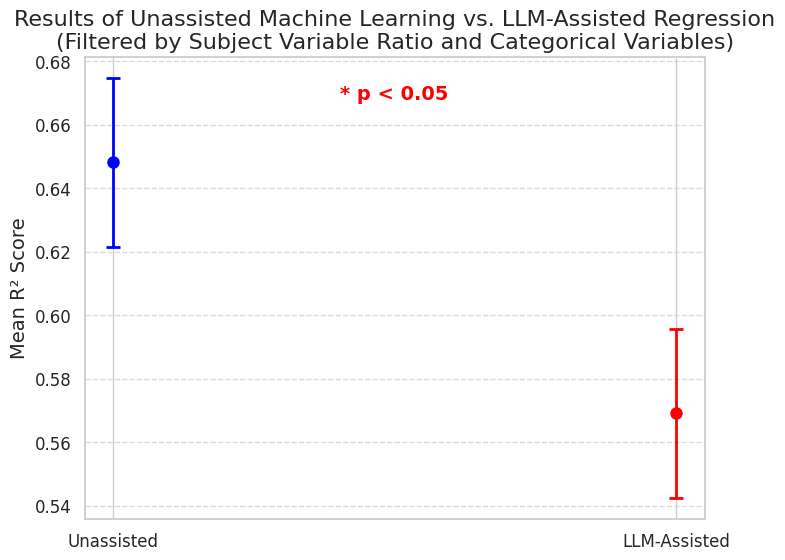

In [158]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Load datasets
unassisted_df = pd.read_csv("unassisted_linear_model_results.csv")
llm_assisted_df = pd.read_csv("llm_assisted_regression_results.csv")
cluster_similarity_df = pd.read_csv("cluster_similarity_results_augmented.csv")

# Merge datasets on 'Dataset' column
merged_df = pd.merge(
    unassisted_df[['Dataset', 'R2']], 
    llm_assisted_df[['Dataset', 'R2']], 
    on='Dataset', suffixes=('_unassisted', '_llm')
)

# Merge with cluster similarity data to include SubjectVariableRatio and NumCategoricalVars
merged_df = pd.merge(merged_df, cluster_similarity_df[['Dataset', 'SubjectVariableRatio', 'NumCategoricalVars']], on='Dataset')

# **Apply Cutoff Criteria:**
filtered_df = merged_df[
    (merged_df["SubjectVariableRatio"] >= 20) & (merged_df["NumCategoricalVars"] <= 25)
]

# Display the merged dataframe's header
print("\nFiltered DataFrame Head:\n", filtered_df.head())

# Compute mean and 95% confidence intervals
def mean_confidence_interval(data, confidence=0.95):
    """Compute mean and confidence interval for a dataset."""
    mean_val = np.mean(data)
    sem = stats.sem(data)  # Standard error of the mean
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1)
    return mean_val, mean_val - margin, mean_val + margin

# Calculate statistics for both methods
mean_unassisted, ci_low_unassisted, ci_high_unassisted = mean_confidence_interval(filtered_df["R2_unassisted"])
mean_llm, ci_low_llm, ci_high_llm = mean_confidence_interval(filtered_df["R2_llm"])

# Perform Paired t-test (assumes normality)
t_stat, p_ttest = stats.ttest_rel(filtered_df["R2_unassisted"], filtered_df["R2_llm"])
print(f"\nPaired t-test results: t-statistic = {t_stat:.4f}, p-value = {p_ttest:.4f}")

# Perform Wilcoxon signed-rank test (non-parametric)
w_stat, p_wilcoxon = stats.wilcoxon(filtered_df["R2_unassisted"], filtered_df["R2_llm"])
print(f"\nWilcoxon signed-rank test results: W-statistic = {w_stat:.4f}, p-value = {p_wilcoxon:.4f}")

# Prepare data for visualization
methods = ["Unassisted", "LLM-Assisted"]
means = [mean_unassisted, mean_llm]
ci_lows = [ci_low_unassisted, ci_low_llm]
ci_highs = [ci_high_unassisted, ci_high_llm]
colors = ["blue", "red"]

# Plot mean with confidence intervals
plt.figure(figsize=(8, 6))

for i, method in enumerate(methods):
    plt.errorbar(
        method, means[i], 
        yerr=[[means[i] - ci_lows[i]], [ci_highs[i] - means[i]]], 
        fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color=colors[i]
    )

# Highlight statistical significance
if p_ttest < 0.05:
    plt.text(0.5, max(means) + 0.02, "* p < 0.05", ha="center", fontsize=14, color="red", fontweight="bold")

# Formatting
plt.ylabel("Mean R² Score", fontsize=14)
plt.title("Results of Unassisted Machine Learning vs. LLM-Assisted Regression\n(Filtered by Subject Variable Ratio and Categorical Variables)", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Save and Show
plt.savefig("mean_confidence_interval_filtered.png", dpi=300, bbox_inches="tight")
plt.show()


## Instances where R2 from LLM assisted is better than LLM unassisted


Paired t-test results: t-statistic = 7.1499, p-value = 0.0000


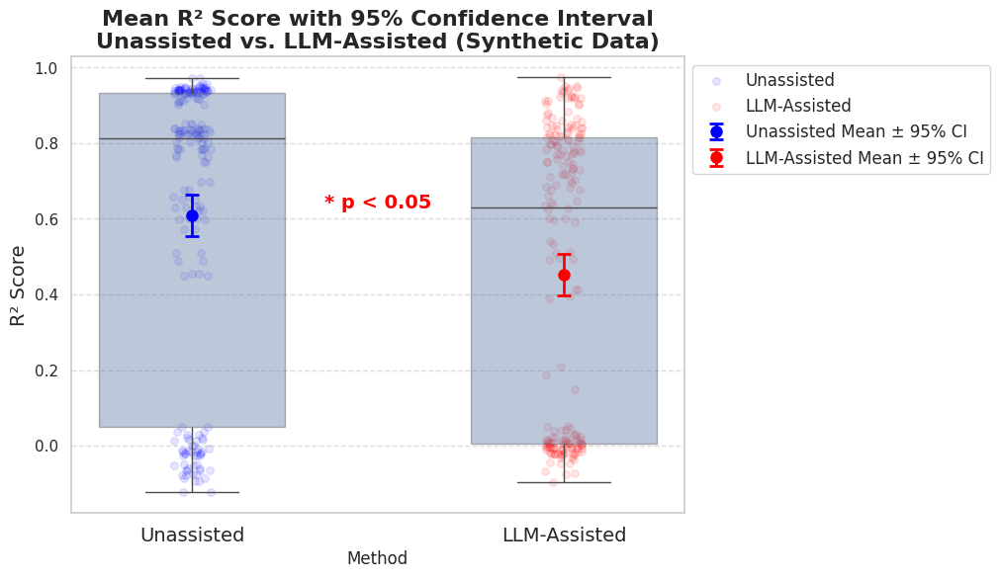

In [203]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Load datasets
unassisted_df = pd.read_csv("unassisted_linear_model_results.csv")
llm_assisted_df = pd.read_csv("llm_assisted_regression_results.csv")

# Merge datasets on 'Dataset' column
merged_df = pd.merge(
    unassisted_df[['Dataset', 'R2']], 
    llm_assisted_df[['Dataset', 'R2']], 
    on='Dataset', suffixes=('_unassisted', '_llm')
)

# Compute mean and 95% confidence intervals
def mean_confidence_interval(data, confidence=0.95):
    """Compute mean and confidence interval for a dataset."""
    mean_val = np.mean(data)
    sem = stats.sem(data)  # Standard error of the mean
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1)
    return mean_val, mean_val - margin, mean_val + margin

# Calculate statistics for both methods
mean_unassisted, ci_low_unassisted, ci_high_unassisted = mean_confidence_interval(merged_df["R2_unassisted"])
mean_llm, ci_low_llm, ci_high_llm = mean_confidence_interval(merged_df["R2_llm"])

# Perform **Paired t-test** (assumes normality)
t_stat, p_ttest = stats.ttest_rel(merged_df["R2_unassisted"], merged_df["R2_llm"])
print(f"\nPaired t-test results: t-statistic = {t_stat:.4f}, p-value = {p_ttest:.4f}")

# Determine significance (p < 0.05)
significant = p_ttest < 0.05

# Jitter function for better visualization
def jitter(values, scale=0.05):
    """Apply jittering to prevent overlapping."""
    return values + np.random.uniform(-scale, scale, size=len(values))

# Prepare data for visualization
methods = ["Unassisted", "LLM-Assisted"]
means = [mean_unassisted, mean_llm]
ci_lows = [ci_low_unassisted, ci_low_llm]
ci_highs = [ci_high_unassisted, ci_high_llm]
colors = ["blue", "red"]

# Create a boxplot with scatter overlay
plt.figure(figsize=(8, 6))

# **Boxplot first (background)**
sns.boxplot(
    data=merged_df.melt(id_vars=["Dataset"], var_name="Method", value_name="R2"),
    x="Method", y="R2", width=0.5, showfliers=False, boxprops=dict(alpha=0.4)
)

# **Scatter points with jitter**
plt.scatter(jitter(np.zeros(len(merged_df))), merged_df["R2_unassisted"], color="blue", alpha=0.1, label="Unassisted", s=30)
plt.scatter(jitter(np.ones(len(merged_df))), merged_df["R2_llm"], color="red", alpha=0.1, label="LLM-Assisted", s=30)

# **Error bars (Mean ± 95% CI)**
for i, method in enumerate(methods):
    plt.errorbar(
        i, means[i], 
        yerr=[[means[i] - ci_lows[i]], [ci_highs[i] - means[i]]], 
        fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color=colors[i], label=f"{method} Mean ± 95% CI"
    )

# Highlight statistical significance
if significant:
    plt.text(0.5, max(means) + 0.02, "* p < 0.05", ha="center", fontsize=14, color="red", fontweight="bold")

# Formatting
plt.xticks([0, 1], methods, fontsize=14)
plt.ylabel("R² Score", fontsize=14)
plt.title("Mean R² Score with 95% Confidence Interval\nUnassisted vs. LLM-Assisted (Synthetic Data)", fontsize=16, fontweight="bold")
plt.grid(axis="y", linestyle="--", alpha=0.7)
# **Move Legend Outside the Plot**
plt.legend(loc="upper left", bbox_to_anchor=(1, 1), fontsize=12)

# Save and Show
plt.savefig("mean_confidence_interval_boxplot.png", dpi=300, bbox_inches="tight")
plt.show()


In [188]:
merged_df.tail()

,Dataset,R2_unassisted,R2_llm
191,data_77_cubic,0.828443,-0.025041
192,data_86_linear,0.937586,0.634456
193,data_86_linear,0.937586,0.600561
194,data_26_quadratic,0.811942,0.846280
195,data_26_quadratic,0.811942,0.840595


## Describe where LLM assisted is better


Dataset with FormulaType assigned:
              Dataset FormulaType
0  data_79_quadratic   quadratic
1  data_79_quadratic   quadratic
2  data_79_quadratic   quadratic
3  data_79_quadratic   quadratic
4  data_79_quadratic   quadratic

✅ Comparison of features where LLM-Assisted is better vs. worse saved to 'llm_performance_comparison.csv'.

Statistical Tests for Differences:

Feature: SubjectVariableRatio
  - t-test: t = 7.0705, p = 0.0000
  - Wilcoxon rank-sum test: W = 341599.0000, p = 0.0000

Feature: NumCategoricalVars
  - t-test: t = -6.1033, p = 0.0000
  - Wilcoxon rank-sum test: W = 238721.0000, p = 0.0000


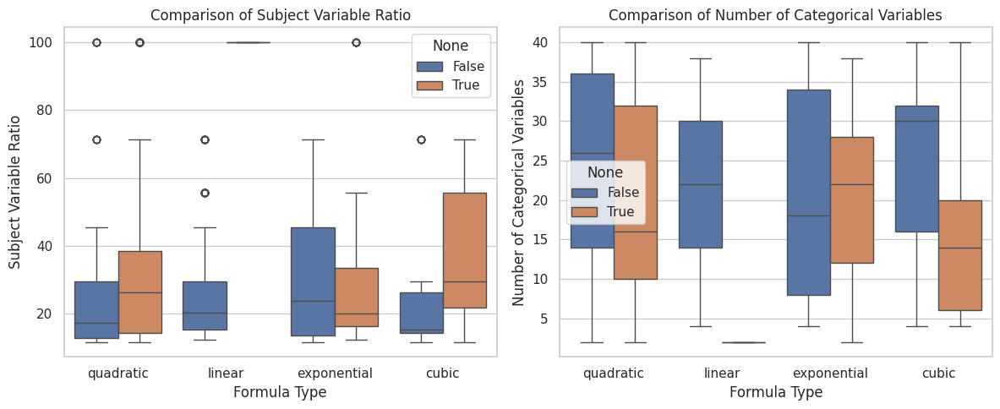

In [163]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Load datasets
unassisted_df = pd.read_csv("unassisted_linear_model_results.csv")
llm_assisted_df = pd.read_csv("llm_assisted_regression_results.csv")
cluster_similarity_df = pd.read_csv("cluster_similarity_results_augmented.csv")

# Merge datasets on 'Dataset' column
merged_df = pd.merge(
    unassisted_df[['Dataset', 'R2', 'TopFeatures']], 
    llm_assisted_df[['Dataset', 'R2']], 
    on='Dataset', suffixes=('_unassisted', '_llm')
)

# Merge with cluster similarity data
merged_df = pd.merge(
    merged_df, 
    cluster_similarity_df[['Dataset', 'SubjectVariableRatio', 'NumCategoricalVars']], 
    on='Dataset'
)

# **Extract dataset formula type from file name**
def extract_formula_type(name):
    """Extracts the formula type from the dataset name (e.g., 'quadratic', 'exponential')."""
    for formula in ["quadratic", "exponential", "linear", "cubic"]:
        if formula in name:
            return formula
    return "unknown"

merged_df["FormulaType"] = merged_df["Dataset"].apply(extract_formula_type)

# **Confirm if FormulaType is correctly assigned**
print("\nDataset with FormulaType assigned:\n", merged_df[["Dataset", "FormulaType"]].head())

# **Identify where LLM-Assisted R² is better**
better_llm_df = merged_df[merged_df["R2_llm"] > merged_df["R2_unassisted"]].copy()
worse_llm_df = merged_df[merged_df["R2_llm"] <= merged_df["R2_unassisted"]].copy()

# **Comparison table**
comparison_df = pd.concat([
    better_llm_df.groupby("FormulaType")[["SubjectVariableRatio", "NumCategoricalVars"]].mean().add_suffix("_better"),
    worse_llm_df.groupby("FormulaType")[["SubjectVariableRatio", "NumCategoricalVars"]].mean().add_suffix("_worse")
], axis=1)

# Save comparison table
comparison_df.to_csv("llm_performance_comparison.csv")
print("\n✅ Comparison of features where LLM-Assisted is better vs. worse saved to 'llm_performance_comparison.csv'.")

# **Statistical Comparison**
print("\nStatistical Tests for Differences:")

for feature in ["SubjectVariableRatio", "NumCategoricalVars"]:
    t_stat, p_ttest = stats.ttest_ind(better_llm_df[feature], worse_llm_df[feature], equal_var=False)
    w_stat, p_wilcoxon = stats.mannwhitneyu(better_llm_df[feature], worse_llm_df[feature])
    
    print(f"\nFeature: {feature}")
    print(f"  - t-test: t = {t_stat:.4f}, p = {p_ttest:.4f}")
    print(f"  - Wilcoxon rank-sum test: W = {w_stat:.4f}, p = {p_wilcoxon:.4f}")

# **Boxplot Visualization**
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.boxplot(data=merged_df, x="FormulaType", y="SubjectVariableRatio", hue=(merged_df["R2_llm"] > merged_df["R2_unassisted"]))
plt.xlabel("Formula Type")
plt.ylabel("Subject Variable Ratio")
plt.title("Comparison of Subject Variable Ratio")

plt.subplot(1, 2, 2)
sns.boxplot(data=merged_df, x="FormulaType", y="NumCategoricalVars", hue=(merged_df["R2_llm"] > merged_df["R2_unassisted"]))
plt.xlabel("Formula Type")
plt.ylabel("Number of Categorical Variables")
plt.title("Comparison of Number of Categorical Variables")

plt.tight_layout()
plt.savefig("llm_assisted_performance_comparison.png", dpi=300, bbox_inches="tight")
plt.show()



✅ Comparison of features where LLM-Assisted is better vs. worse saved to 'llm_performance_comparison.csv'.

Statistical Tests for Differences:

Feature: SubjectVariableRatio
  - t-test: t = 6.3225, p = 0.0000
  - Wilcoxon rank-sum test: W = 115564.5000, p = 0.0002

Feature: NumCategoricalVars
  - t-test: t = -3.1361, p = 0.0018
  - Wilcoxon rank-sum test: W = 86785.5000, p = 0.0002


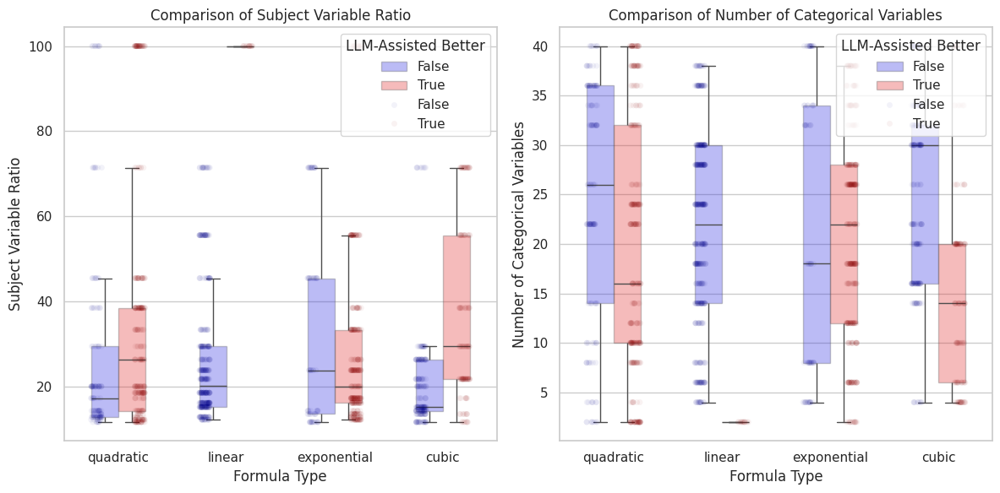

In [217]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Load datasets
unassisted_df = pd.read_csv("unassisted_linear_model_results.csv")
llm_assisted_df = pd.read_csv("llm_assisted_regression_results.csv")
cluster_similarity_df = pd.read_csv("cluster_similarity_results_augmented.csv")

# Merge datasets on 'Dataset' column
merged_df = pd.merge(
    unassisted_df[['Dataset', 'R2', 'TopFeatures']], 
    llm_assisted_df[['Dataset', 'R2']], 
    on='Dataset', suffixes=('_unassisted', '_llm')
)

# Merge with cluster similarity data
merged_df = pd.merge(
    merged_df, 
    cluster_similarity_df[['Dataset', 'SubjectVariableRatio', 'NumCategoricalVars']], 
    on='Dataset'
)

# **Extract dataset formula type from file name**
def extract_formula_type(name):
    """Extracts the formula type from the dataset name (e.g., 'quadratic', 'exponential')."""
    for formula in ["quadratic", "exponential", "linear", "cubic"]:
        if formula in name:
            return formula
    return "unknown"

merged_df["FormulaType"] = merged_df["Dataset"].apply(extract_formula_type)

# **Identify where LLM-Assisted R² is better**
merged_df["LLM_Better"] = merged_df["R2_llm"] > merged_df["R2_unassisted"]

# **Comparison table**
better_llm_df = merged_df[merged_df["LLM_Better"]].copy()
worse_llm_df = merged_df[~merged_df["LLM_Better"]].copy()

# **Drop instances where either R² is below zero**
better_llm_df = better_llm_df[(better_llm_df["R2_unassisted"] >= 0.2) & (better_llm_df["R2_llm"] >= 0.2)]
worse_llm_df = worse_llm_df[(worse_llm_df["R2_unassisted"] >= 0.2) & (worse_llm_df["R2_llm"] >= 0.2)]

comparison_df = pd.concat([
    better_llm_df.groupby("FormulaType")[["SubjectVariableRatio", "NumCategoricalVars"]].mean().add_suffix("_better"),
    worse_llm_df.groupby("FormulaType")[["SubjectVariableRatio", "NumCategoricalVars"]].mean().add_suffix("_worse")
], axis=1)

# Save comparison table
comparison_df.to_csv("llm_performance_comparison.csv")
print("\n✅ Comparison of features where LLM-Assisted is better vs. worse saved to 'llm_performance_comparison.csv'.")

# **Statistical Comparison**
print("\nStatistical Tests for Differences:")

for feature in ["SubjectVariableRatio", "NumCategoricalVars"]:
    t_stat, p_ttest = stats.ttest_ind(better_llm_df[feature], worse_llm_df[feature], equal_var=False)
    w_stat, p_wilcoxon = stats.mannwhitneyu(better_llm_df[feature], worse_llm_df[feature])
    
    print(f"\nFeature: {feature}")
    print(f"  - t-test: t = {t_stat:.4f}, p = {p_ttest:.4f}")
    print(f"  - Wilcoxon rank-sum test: W = {w_stat:.4f}, p = {p_wilcoxon:.4f}")

# **Boxplot with Scatter and Mean ± 95% Confidence Interval**
plt.figure(figsize=(12, 6))

for i, (feature, ylabel) in enumerate(zip(["SubjectVariableRatio", "NumCategoricalVars"], 
                                          ["Subject Variable Ratio", "Number of Categorical Variables"])):
    plt.subplot(1, 2, i + 1)

    # Boxplot with transparency
    sns.boxplot(
        data=merged_df, x="FormulaType", y=feature, hue="LLM_Better",
        palette={True: "red", False: "blue"}, width=0.5, fliersize=0, boxprops={'alpha': 0.3}
    )

    # Jittered scatter points
    sns.stripplot(
        data=merged_df, x="FormulaType", y=feature, hue="LLM_Better",
        jitter=True, dodge=True, alpha=0.05, palette={True: "darkred", False: "darkblue"}, size=5
    )

    plt.xlabel("Formula Type")
    plt.ylabel(ylabel)
    plt.title(f"Comparison of {ylabel}")
    plt.legend(title="LLM-Assisted Better", loc="upper right")

plt.tight_layout()
plt.savefig("llm_assisted_performance_comparison.png", dpi=300, bbox_inches="tight")
plt.show()



Paired t-test results: t-statistic = 12.6046, p-value = 0.0000

Wilcoxon signed-rank test results: W-statistic = 134336.0000, p-value = 0.0000


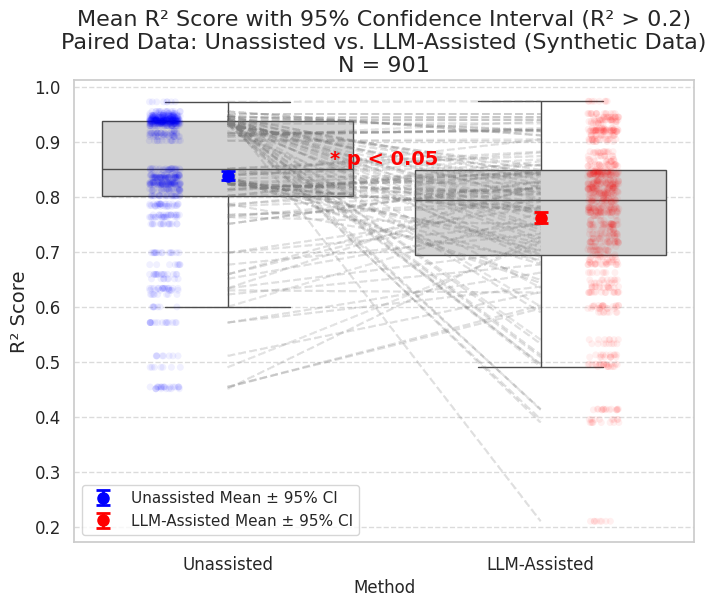

In [229]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# **Compute Mean and 95% Confidence Intervals**
def mean_confidence_interval(data, confidence=0.95):
    """Compute mean and confidence interval for a dataset."""
    mean_val = np.mean(data)
    sem = stats.sem(data)  # Standard error of the mean
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1) if len(data) > 1 else 0
    return mean_val, mean_val - margin, mean_val + margin

# **Check that required columns exist**
if not {"R2_unassisted", "R2_llm"}.issubset(merged_df.columns):
    raise ValueError("The required columns 'R2_unassisted' and 'R2_llm' are missing from the dataframe.")

# **Ensure Numeric Columns**
merged_df["R2_unassisted"] = pd.to_numeric(merged_df["R2_unassisted"], errors="coerce")
merged_df["R2_llm"] = pd.to_numeric(merged_df["R2_llm"], errors="coerce")

# **Filter Data for R² > 0.2 in both methods**
filtered_df = merged_df[(merged_df["R2_unassisted"] > 0.2) & (merged_df["R2_llm"] > 0.2)]
n_obs = len(filtered_df)  # Number of observations after filtering

if n_obs == 0:
    raise ValueError("No observations remain after filtering for R² > 0.2.")

# **Compute statistics for both methods**
mean_unassisted, ci_low_unassisted, ci_high_unassisted = mean_confidence_interval(filtered_df["R2_unassisted"])
mean_llm, ci_low_llm, ci_high_llm = mean_confidence_interval(filtered_df["R2_llm"])

# **Paired t-test**
t_stat, p_ttest = stats.ttest_rel(filtered_df["R2_unassisted"], filtered_df["R2_llm"])
print(f"\nPaired t-test results: t-statistic = {t_stat:.4f}, p-value = {p_ttest:.4f}")

# **Wilcoxon signed-rank test**
w_stat, p_wilcoxon = stats.wilcoxon(filtered_df["R2_unassisted"], filtered_df["R2_llm"])
print(f"\nWilcoxon signed-rank test results: W-statistic = {w_stat:.4f}, p-value = {p_wilcoxon:.4f}")

# **Prepare Data for Plotting**
df_plot = filtered_df.melt(id_vars=["Dataset"], value_vars=["R2_unassisted", "R2_llm"], 
                            var_name="Method", value_name="R² Score")

# **Fix method labels for better readability**
df_plot["Method"] = df_plot["Method"].replace({"R2_unassisted": "Unassisted", "R2_llm": "LLM-Assisted"})

# **Compute means and confidence intervals for plotting**
methods = ["Unassisted", "LLM-Assisted"]
means = [mean_unassisted, mean_llm]
ci_lows = [ci_low_unassisted, ci_low_llm]
ci_highs = [ci_high_unassisted, ci_high_llm]
colors = ["blue", "red"]

# **Plot Mean R² with Confidence Intervals and Jitter**
plt.figure(figsize=(8, 6))

# **Boxplot**
sns.boxplot(data=df_plot, x="Method", y="R² Score", showfliers=False, boxprops={'facecolor':'lightgray'})

# **Jitter scatterplot**
sns.stripplot(data=df_plot, x="Method", y="R² Score", jitter=True, alpha=0.06, dodge=True, hue="Method", palette={"Unassisted": "blue", "LLM-Assisted": "red"})

# **Connect Paired Observations**
for _, row in filtered_df.iterrows():
    plt.plot(["Unassisted", "LLM-Assisted"], [row["R2_unassisted"], row["R2_llm"]], color="gray", alpha=0.03, linestyle='--')

# **Plot Mean and Confidence Interval Bars**
for i, method in enumerate(methods):
    plt.errorbar(i, means[i], yerr=[[means[i] - ci_lows[i]], [ci_highs[i] - means[i]]], 
                 fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, 
                 color=colors[i], label=f"{method} Mean ± 95% CI")

# **Highlight statistical significance**
if p_ttest < 0.05:
    plt.text(0.5, max(means) + 0.02, "* p < 0.05", ha="center", fontsize=14, color="red", fontweight="bold")

# **Formatting**
plt.ylabel("R² Score", fontsize=14)
plt.title(f"Mean R² Score with 95% Confidence Interval (R² > 0.2)\n"
          f"Paired Data: Unassisted vs. LLM-Assisted (Synthetic Data)\n"
          f"N = {n_obs}", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# **Save and Show**
plt.legend()
plt.savefig("paired_r2_confidence_interval_with_jitter_filtered.png", dpi=300, bbox_inches="tight")
plt.show()


In [218]:
# Filter only cases where LLM-assisted is better
filtered_df = merged_df[merged_df["R2_llm"] > merged_df["R2_unassisted"]].copy()

# Check dataset size after filtering
print(f"Number of instances where LLM-Assisted has higher R²: {filtered_df.shape[0]}")


Number of instances where LLM-Assisted has higher R²: 744



Paired t-test (LLM Better) results: t-statistic = -18.7966, p-value = 0.0000

Wilcoxon signed-rank test (LLM Better) results: W-statistic = 0.0000, p-value = 0.0000


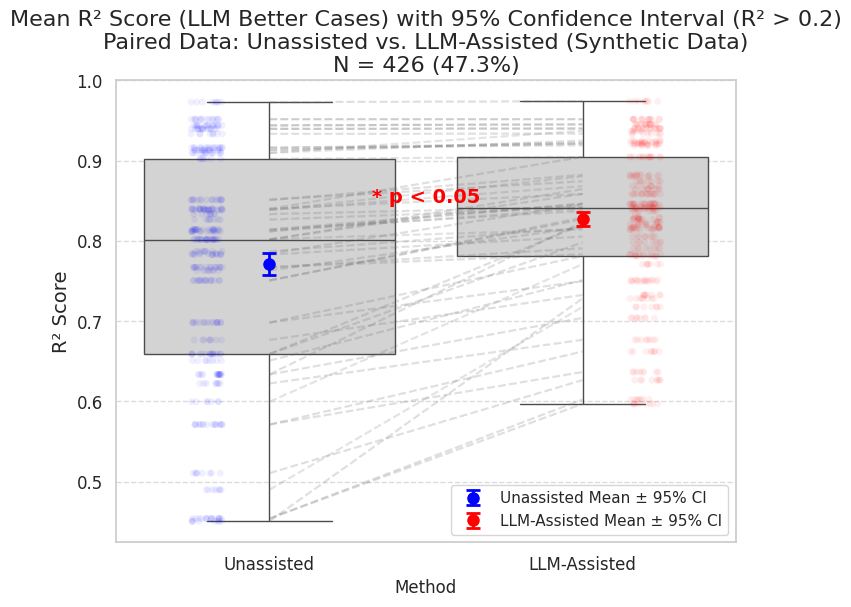

In [234]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# **Compute Mean and 95% Confidence Intervals**
def mean_confidence_interval(data, confidence=0.95):
    """Compute mean and confidence interval for a dataset."""
    mean_val = np.mean(data)
    sem = stats.sem(data)  # Standard error of the mean
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1) if len(data) > 1 else 0
    return mean_val, mean_val - margin, mean_val + margin

# **Check that required columns exist**
if not {"R2_unassisted", "R2_llm"}.issubset(merged_df.columns):
    raise ValueError("The required columns 'R2_unassisted' and 'R2_llm' are missing from the dataframe.")

# **Ensure Numeric Columns**
merged_df["R2_unassisted"] = pd.to_numeric(merged_df["R2_unassisted"], errors="coerce")
merged_df["R2_llm"] = pd.to_numeric(merged_df["R2_llm"], errors="coerce")

# **Filter Data for R² > 0.2 in both methods**
filtered_df = merged_df[(merged_df["R2_unassisted"] > 0.2) & (merged_df["R2_llm"] > 0.2)]

# **Create LLM_Better Variable**
llm_better_df = filtered_df[filtered_df["R2_llm"] > filtered_df["R2_unassisted"]]
n_obs_better = len(llm_better_df)  # Number of observations where LLM is better
n_total = len(filtered_df)  # Total observations after filtering
percent_better = (n_obs_better / n_total) * 100  # Percentage of cases where LLM is better

if n_obs_better == 0:
    raise ValueError("No observations where LLM-assisted R² is better than unassisted.")

# **Compute statistics for both methods (for cases where LLM is better)**
mean_unassisted, ci_low_unassisted, ci_high_unassisted = mean_confidence_interval(llm_better_df["R2_unassisted"])
mean_llm, ci_low_llm, ci_high_llm = mean_confidence_interval(llm_better_df["R2_llm"])

# **Paired t-test (for LLM better cases)**
t_stat, p_ttest = stats.ttest_rel(llm_better_df["R2_unassisted"], llm_better_df["R2_llm"])
print(f"\nPaired t-test (LLM Better) results: t-statistic = {t_stat:.4f}, p-value = {p_ttest:.4f}")

# **Wilcoxon signed-rank test (for LLM better cases)**
w_stat, p_wilcoxon = stats.wilcoxon(llm_better_df["R2_unassisted"], llm_better_df["R2_llm"])
print(f"\nWilcoxon signed-rank test (LLM Better) results: W-statistic = {w_stat:.4f}, p-value = {p_wilcoxon:.4f}")

# **Prepare Data for Plotting**
df_plot = llm_better_df.melt(id_vars=["Dataset"], value_vars=["R2_unassisted", "R2_llm"], 
                            var_name="Method", value_name="R² Score")

# **Fix method labels for better readability**
df_plot["Method"] = df_plot["Method"].replace({"R2_unassisted": "Unassisted", "R2_llm": "LLM-Assisted"})

# **Compute means and confidence intervals for plotting**
methods = ["Unassisted", "LLM-Assisted"]
means = [mean_unassisted, mean_llm]
ci_lows = [ci_low_unassisted, ci_low_llm]
ci_highs = [ci_high_unassisted, ci_high_llm]
colors = ["blue", "red"]

# **Plot Mean R² with Confidence Intervals and Jitter**
plt.figure(figsize=(8, 6))

# **Boxplot**
sns.boxplot(data=df_plot, x="Method", y="R² Score", showfliers=False, boxprops={'facecolor':'lightgray'})

# **Jitter scatterplot**
sns.stripplot(data=df_plot, x="Method", y="R² Score", jitter=True, alpha=0.06, dodge=True, hue="Method", palette={"Unassisted": "blue", "LLM-Assisted": "red"})

# **Connect Paired Observations**
for _, row in llm_better_df.iterrows():
    plt.plot(["Unassisted", "LLM-Assisted"], [row["R2_unassisted"], row["R2_llm"]], color="gray", alpha=0.03, linestyle='--')

# **Plot Mean and Confidence Interval Bars**
for i, method in enumerate(methods):
    plt.errorbar(i, means[i], yerr=[[means[i] - ci_lows[i]], [ci_highs[i] - means[i]]], 
                 fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, 
                 color=colors[i], label=f"{method} Mean ± 95% CI")

# **Highlight statistical significance**
if p_ttest < 0.05:
    plt.text(0.5, max(means) + 0.02, "* p < 0.05", ha="center", fontsize=14, color="red", fontweight="bold")

# **Formatting**
plt.ylabel("R² Score", fontsize=14)
plt.title(f"Mean R² Score (LLM Better Cases) with 95% Confidence Interval (R² > 0.2)\n"
          f"Paired Data: Unassisted vs. LLM-Assisted (Synthetic Data)\n"
          f"N = {n_obs_better} ({percent_better:.1f}%)", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# **Save and Show**
plt.legend()
plt.savefig("paired_r2_confidence_interval_with_jitter_llm_better.png", dpi=300, bbox_inches="tight")
plt.show()



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



✅ Statistical comparison table with confidence intervals saved as 'llm_performance_comparison_with_CI.csv'.

Presentation-Quality Table:

                Feature  Mean (LLM Better)  CI Low (LLM Better)  \
0  SubjectVariableRatio            38.1659              35.4489   
1    NumCategoricalVars            17.7934              16.6133   

   CI High (LLM Better)  Mean (LLM Worse)  CI Low (LLM Worse)  \
0               40.8830           28.0026             26.3904   
1               18.9736           20.1347             19.2629   

   CI High (LLM Worse)  t-test (p-value)  Mann-Whitney (p-value)  
0              29.6148            0.0000                  0.0002  
1              21.0065            0.0018                  0.0002  


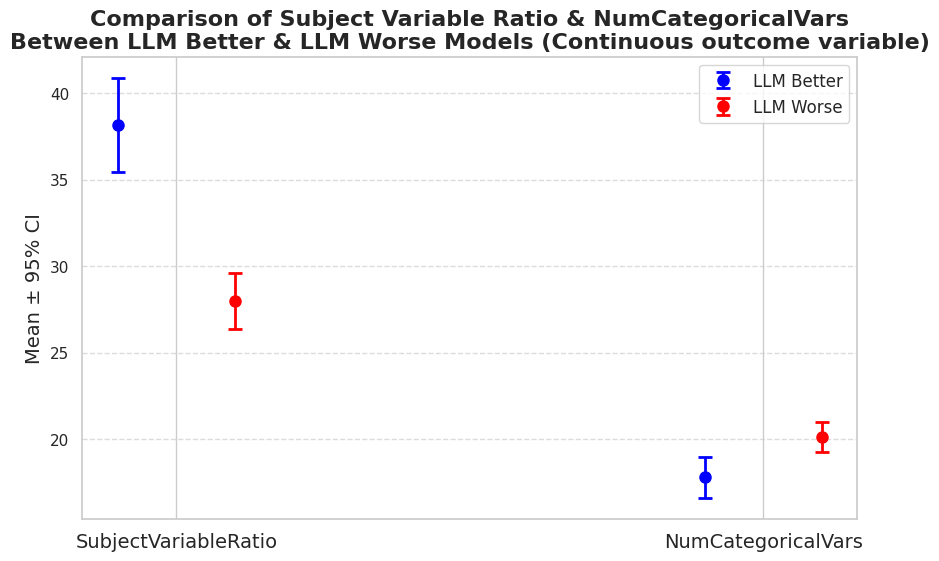

In [235]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Load datasets
unassisted_df = pd.read_csv("unassisted_linear_model_results.csv")
llm_assisted_df = pd.read_csv("llm_assisted_regression_results.csv")
cluster_similarity_df = pd.read_csv("cluster_similarity_results_augmented.csv")

# Merge datasets on 'Dataset' column
merged_df = pd.merge(
    unassisted_df[['Dataset', 'R2', 'TopFeatures']], 
    llm_assisted_df[['Dataset', 'R2']], 
    on='Dataset', suffixes=('_unassisted', '_llm')
)

# Merge with cluster similarity data
merged_df = pd.merge(
    merged_df, 
    cluster_similarity_df[['Dataset', 'SubjectVariableRatio', 'NumCategoricalVars']], 
    on='Dataset'
)

# **Extract dataset formula type from file name**
def extract_formula_type(name):
    """Extracts the formula type from the dataset name (e.g., 'quadratic', 'exponential')."""
    for formula in ["quadratic", "exponential", "linear", "cubic"]:
        if formula in name:
            return formula
    return "unknown"

merged_df["FormulaType"] = merged_df["Dataset"].apply(extract_formula_type)

# **Filter rows where both R² values are ≥ 0.2**
filtered_df = merged_df[(merged_df["R2_unassisted"] >= 0.2) & (merged_df["R2_llm"] >= 0.2)]

# **Create new variable 'LLM_Better'**
filtered_df["LLM_Better"] = filtered_df["R2_llm"] > filtered_df["R2_unassisted"]

# **Function to compute mean and 95% confidence interval**
def mean_confidence_interval(data, confidence=0.95):
    """Compute mean and confidence interval for a dataset."""
    mean_val = np.mean(data)
    sem = stats.sem(data)  # Standard error of the mean
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1)
    return mean_val, mean_val - margin, mean_val + margin

# **Statistical Tests and Confidence Intervals**
comparison_results = []

for feature in ["SubjectVariableRatio", "NumCategoricalVars"]:
    group_better = filtered_df[filtered_df["LLM_Better"]][feature]
    group_worse = filtered_df[~filtered_df["LLM_Better"]][feature]

    # Compute mean and 95% CI
    mean_better, ci_low_better, ci_high_better = mean_confidence_interval(group_better)
    mean_worse, ci_low_worse, ci_high_worse = mean_confidence_interval(group_worse)

    # Perform t-test (assumes normality)
    t_stat, p_ttest = stats.ttest_ind(group_better, group_worse, equal_var=False)

    # Perform Mann-Whitney U test (non-parametric)
    u_stat, p_mannwhitney = stats.mannwhitneyu(group_better, group_worse)

    # Store results
    comparison_results.append({
        "Feature": feature,
        "Mean_LLM_Better": mean_better,
        "CI_Low_LLM_Better": ci_low_better,
        "CI_High_LLM_Better": ci_high_better,
        "Mean_LLM_Worse": mean_worse,
        "CI_Low_LLM_Worse": ci_low_worse,
        "CI_High_LLM_Worse": ci_high_worse,
        "t-test p-value": p_ttest,
        "Mann-Whitney p-value": p_mannwhitney
    })

# Convert to DataFrame
comparison_df = pd.DataFrame(comparison_results)

# **Format for Presentation**
comparison_df = comparison_df.round(4)
comparison_df.columns = [
    "Feature", "Mean (LLM Better)", "CI Low (LLM Better)", "CI High (LLM Better)",
    "Mean (LLM Worse)", "CI Low (LLM Worse)", "CI High (LLM Worse)", 
    "t-test (p-value)", "Mann-Whitney (p-value)"
]

# Save table to CSV
comparison_df.to_csv("llm_performance_comparison_with_CI.csv", index=False)

# **Print results**
print("\n✅ Statistical comparison table with confidence intervals saved as 'llm_performance_comparison_with_CI.csv'.")
print("\nPresentation-Quality Table:\n")
print(comparison_df)

# **Visualization: Mean & Confidence Interval Plot**
plt.figure(figsize=(10, 6))
methods = ["SubjectVariableRatio", "NumCategoricalVars"]
colors = ["blue", "red"]

for i, feature in enumerate(methods):
    mean_better, ci_low_better, ci_high_better = mean_confidence_interval(filtered_df[filtered_df["LLM_Better"]][feature])
    mean_worse, ci_low_worse, ci_high_worse = mean_confidence_interval(filtered_df[~filtered_df["LLM_Better"]][feature])

    plt.errorbar(i - 0.1, mean_better, yerr=[[mean_better - ci_low_better], [ci_high_better - mean_better]], 
                 fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color="blue", label="LLM Better" if i == 0 else "")

    plt.errorbar(i + 0.1, mean_worse, yerr=[[mean_worse - ci_low_worse], [ci_high_worse - mean_worse]], 
                 fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color="red", label="LLM Worse" if i == 0 else "")

# Formatting
plt.xticks(range(len(methods)), methods, fontsize=14)
plt.ylabel("Mean ± 95% CI", fontsize=14)
plt.title("Comparison of Subject Variable Ratio & NumCategoricalVars\nBetween LLM Better & LLM Worse Models (Continuous outcome variable)", fontsize=16, fontweight="bold")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.legend(loc="upper right", fontsize=12)

# Save and Show
plt.savefig("llm_performance_CI_plot.png", dpi=300, bbox_inches="tight")
plt.show()


/tmp/ipykernel_1187/3695394757.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["LLM_Better"] = filtered_df["R2_llm"] > filtered_df["R2_unassisted"]



✅ Statistical comparison table with confidence intervals saved as 'llm_performance_comparison_with_CI.csv'.

Presentation-Quality Table:

                Feature  Mean (LLM Better)  CI Low (LLM Better)  \
0  SubjectVariableRatio            38.1659              35.4489   
1    NumCategoricalVars            17.7934              16.6133   

   CI High (LLM Better)  Mean (LLM Worse)  CI Low (LLM Worse)  \
0               40.8830           28.0026             26.3904   
1               18.9736           20.1347             19.2629   

   CI High (LLM Worse)  t-test (p-value)  Mann-Whitney (p-value)  
0              29.6148            0.0000                  0.0002  
1              21.0065            0.0018                  0.0002  


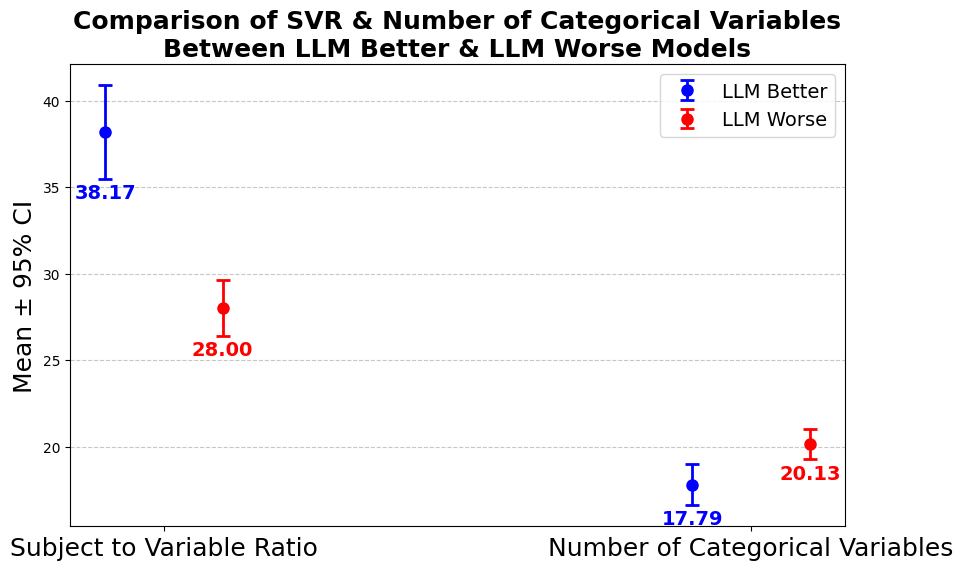

In [19]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Load datasets
unassisted_df = pd.read_csv("unassisted_linear_model_results.csv")
llm_assisted_df = pd.read_csv("llm_assisted_regression_results.csv")
cluster_similarity_df = pd.read_csv("cluster_similarity_results_augmented.csv")

# Merge datasets on 'Dataset' column
merged_df = pd.merge(
    unassisted_df[['Dataset', 'R2', 'TopFeatures']], 
    llm_assisted_df[['Dataset', 'R2']], 
    on='Dataset', suffixes=('_unassisted', '_llm')
)

# Merge with cluster similarity data
merged_df = pd.merge(
    merged_df, 
    cluster_similarity_df[['Dataset', 'SubjectVariableRatio', 'NumCategoricalVars']], 
    on='Dataset'
)

# **Extract dataset formula type from file name**
def extract_formula_type(name):
    """Extracts the formula type from the dataset name (e.g., 'quadratic', 'exponential')."""
    for formula in ["quadratic", "exponential", "linear", "cubic"]:
        if formula in name:
            return formula
    return "unknown"

merged_df["FormulaType"] = merged_df["Dataset"].apply(extract_formula_type)

# **Filter rows where both R² values are ≥ 0.2**
filtered_df = merged_df[(merged_df["R2_unassisted"] >= 0.2) & (merged_df["R2_llm"] >= 0.2)]

# **Create new variable 'LLM_Better'**
filtered_df["LLM_Better"] = filtered_df["R2_llm"] > filtered_df["R2_unassisted"]

# **Function to compute mean and 95% confidence interval**
def mean_confidence_interval(data, confidence=0.95):
    """Compute mean and confidence interval for a dataset."""
    mean_val = np.mean(data)
    sem = stats.sem(data)  # Standard error of the mean
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1) if len(data) > 1 else 0
    return mean_val, mean_val - margin, mean_val + margin

# **Statistical Tests and Confidence Intervals**
comparison_results = []

for feature in ["SubjectVariableRatio", "NumCategoricalVars"]:
    group_better = filtered_df[filtered_df["LLM_Better"]][feature]
    group_worse = filtered_df[~filtered_df["LLM_Better"]][feature]

    # Compute mean and 95% CI
    mean_better, ci_low_better, ci_high_better = mean_confidence_interval(group_better)
    mean_worse, ci_low_worse, ci_high_worse = mean_confidence_interval(group_worse)

    # Perform t-test (assumes normality)
    t_stat, p_ttest = stats.ttest_ind(group_better, group_worse, equal_var=False)

    # Perform Mann-Whitney U test (non-parametric)
    u_stat, p_mannwhitney = stats.mannwhitneyu(group_better, group_worse)

    # Store results
    comparison_results.append({
        "Feature": feature,
        "Mean_LLM_Better": mean_better,
        "CI_Low_LLM_Better": ci_low_better,
        "CI_High_LLM_Better": ci_high_better,
        "Mean_LLM_Worse": mean_worse,
        "CI_Low_LLM_Worse": ci_low_worse,
        "CI_High_LLM_Worse": ci_high_worse,
        "t-test p-value": p_ttest,
        "Mann-Whitney p-value": p_mannwhitney
    })

# Convert to DataFrame
comparison_df = pd.DataFrame(comparison_results)

# **Format for Presentation**
comparison_df = comparison_df.round(4)
comparison_df.columns = [
    "Feature", "Mean (LLM Better)", "CI Low (LLM Better)", "CI High (LLM Better)",
    "Mean (LLM Worse)", "CI Low (LLM Worse)", "CI High (LLM Worse)", 
    "t-test (p-value)", "Mann-Whitney (p-value)"
]

# Save table to CSV
comparison_df.to_csv("llm_performance_comparison_with_CI.csv", index=False)

# **Print results**
print("\n✅ Statistical comparison table with confidence intervals saved as 'llm_performance_comparison_with_CI.csv'.")
print("\nPresentation-Quality Table:\n")
print(comparison_df)

# **Visualization: Mean & Confidence Interval Plot**
plt.figure(figsize=(10, 6))

# Define new x-axis labels
methods = ["Subject to Variable Ratio", "Number of Categorical Variables"]  # Renamed for better readability
colors = ["blue", "red"]

for i, feature in enumerate(["SubjectVariableRatio", "NumCategoricalVars"]):
    mean_better, ci_low_better, ci_high_better = mean_confidence_interval(filtered_df[filtered_df["LLM_Better"]][feature])
    mean_worse, ci_low_worse, ci_high_worse = mean_confidence_interval(filtered_df[~filtered_df["LLM_Better"]][feature])

    # Plot with 95% confidence interval error bars
    plt.errorbar(i - 0.1, mean_better, yerr=[[mean_better - ci_low_better], [ci_high_better - mean_better]], 
                 fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color="blue", label="LLM Better" if i == 0 else "")

    plt.errorbar(i + 0.1, mean_worse, yerr=[[mean_worse - ci_low_worse], [ci_high_worse - mean_worse]], 
                 fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color="red", label="LLM Worse" if i == 0 else "")

    # **Move text annotations further below to improve spacing**
    text_offset = 0.25  # Adjusted to add extra space

    plt.text(i - 0.1, ci_low_better - text_offset, f"{mean_better:.2f}", ha='center', va='top', fontsize=14, color="blue", fontweight="bold")
    plt.text(i + 0.1, ci_low_worse - text_offset, f"{mean_worse:.2f}", ha='center', va='top', fontsize=14, color="red", fontweight="bold")

# Formatting
plt.xticks(range(len(methods)), methods, fontsize=18)  # Updated x-axis labels and font size
plt.ylabel("Mean ± 95% CI", fontsize=18)
plt.title("Comparison of SVR & Number of Categorical Variables\nBetween LLM Better & LLM Worse Models", fontsize=18, fontweight="bold")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.legend(loc="upper right", fontsize=14)

# Save and Show
plt.savefig("llm_performance_CI_plot.png", dpi=300, bbox_inches="tight")
plt.show()




/tmp/ipykernel_1187/2647150057.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["LLM_Better"] = filtered_df["R2_llm"] > filtered_df["R2_unassisted"]



✅ Statistical comparison table with confidence intervals saved.

Presentation-Quality Table:

                Feature  Mean (LLM Better)  CI Low (LLM Better)  \
0  SubjectVariableRatio            38.1659              35.4489   
1    NumCategoricalVars            17.7934              16.6133   

   CI High (LLM Better)  Mean (LLM Worse)  CI Low (LLM Worse)  \
0               40.8830           28.0026             26.3904   
1               18.9736           20.1347             19.2629   

   CI High (LLM Worse)  t-test (p-value)  Mann-Whitney (p-value)  
0              29.6148            0.0000                  0.0002  
1              21.0065            0.0018                  0.0002  


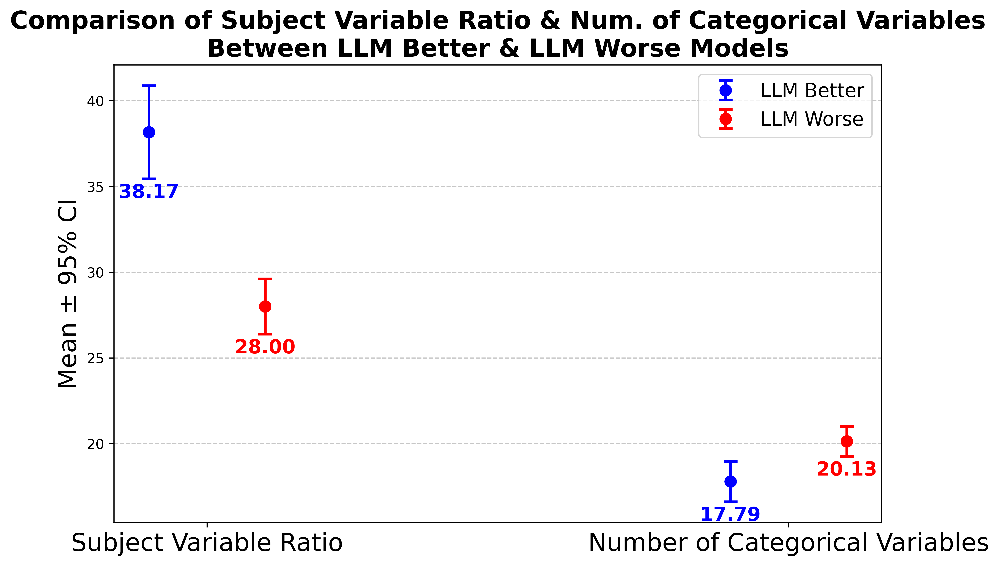


✅ CI comparison plot saved as:
  - comparison_plots/llm_performance_CI_plot.jpg
  - comparison_plots/llm_performance_CI_plot.png


In [65]:
import os
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# **File Paths**
UNASSISTED_FILE = "unassisted_linear_model_results.csv"
ASSISTED_FILE = "llm_assisted_regression_results.csv"
CLUSTER_FILE = "cluster_similarity_results_augmented.csv"
OUTPUT_PLOTS_DIR = "comparison_plots"

# Ensure output directory exists
if not os.path.exists(OUTPUT_PLOTS_DIR):
    os.makedirs(OUTPUT_PLOTS_DIR)

# **Load Data**
unassisted_df = pd.read_csv(UNASSISTED_FILE)
llm_assisted_df = pd.read_csv(ASSISTED_FILE)
cluster_similarity_df = pd.read_csv(CLUSTER_FILE)

# **Merge datasets on 'Dataset' column**
merged_df = pd.merge(
    unassisted_df[['Dataset', 'R2', 'TopFeatures']], 
    llm_assisted_df[['Dataset', 'R2']], 
    on='Dataset', suffixes=('_unassisted', '_llm')
)

merged_df = pd.merge(
    merged_df, 
    cluster_similarity_df[['Dataset', 'SubjectVariableRatio', 'NumCategoricalVars']], 
    on='Dataset'
)

# **Extract dataset formula type from file name**
def extract_formula_type(name):
    """Extracts the formula type from the dataset name (e.g., 'quadratic', 'exponential')."""
    for formula in ["quadratic", "exponential", "linear", "cubic"]:
        if formula in name:
            return formula
    return "unknown"

merged_df["FormulaType"] = merged_df["Dataset"].apply(extract_formula_type)

# **Filter rows where both R² values are ≥ 0.2**
filtered_df = merged_df[(merged_df["R2_unassisted"] >= 0.2) & (merged_df["R2_llm"] >= 0.2)]

# **Create new variable 'LLM_Better'**
filtered_df["LLM_Better"] = filtered_df["R2_llm"] > filtered_df["R2_unassisted"]

# **Function to compute mean and 95% confidence interval**
def mean_confidence_interval(data, confidence=0.95):
    """Compute mean and confidence interval for a dataset."""
    mean_val = np.mean(data)
    sem = stats.sem(data) if len(data) > 1 else 0  # Standard error of the mean
    margin = sem * stats.t.ppf((1 + confidence) / 2., len(data)-1) if len(data) > 1 else 0
    return mean_val, mean_val - margin, mean_val + margin

# **Statistical Tests and Confidence Intervals**
comparison_results = []

for feature in ["SubjectVariableRatio", "NumCategoricalVars"]:
    group_better = filtered_df[filtered_df["LLM_Better"]][feature]
    group_worse = filtered_df[~filtered_df["LLM_Better"]][feature]

    # Compute mean and 95% CI
    mean_better, ci_low_better, ci_high_better = mean_confidence_interval(group_better)
    mean_worse, ci_low_worse, ci_high_worse = mean_confidence_interval(group_worse)

    # Perform t-test (assumes normality)
    t_stat, p_ttest = stats.ttest_ind(group_better, group_worse, equal_var=False)

    # Perform Mann-Whitney U test (non-parametric)
    u_stat, p_mannwhitney = stats.mannwhitneyu(group_better, group_worse)

    # Store results
    comparison_results.append({
        "Feature": feature,
        "Mean_LLM_Better": mean_better,
        "CI_Low_LLM_Better": ci_low_better,
        "CI_High_LLM_Better": ci_high_better,
        "Mean_LLM_Worse": mean_worse,
        "CI_Low_LLM_Worse": ci_low_worse,
        "CI_High_LLM_Worse": ci_high_worse,
        "t-test p-value": p_ttest,
        "Mann-Whitney p-value": p_mannwhitney
    })

# Convert to DataFrame
comparison_df = pd.DataFrame(comparison_results)

# **Format for Presentation**
comparison_df = comparison_df.round(4)
comparison_df.columns = [
    "Feature", "Mean (LLM Better)", "CI Low (LLM Better)", "CI High (LLM Better)",
    "Mean (LLM Worse)", "CI Low (LLM Worse)", "CI High (LLM Worse)", 
    "t-test (p-value)", "Mann-Whitney (p-value)"
]

# Save table to CSV
comparison_df.to_csv(os.path.join(OUTPUT_PLOTS_DIR, "llm_performance_comparison_with_CI.csv"), index=False)

# **Print results**
print("\n✅ Statistical comparison table with confidence intervals saved.")
print("\nPresentation-Quality Table:\n")
print(comparison_df)

# **Visualization: Mean & Confidence Interval Plot**
plt.figure(figsize=(10, 6), dpi=600)  # High-resolution figure

# Define new x-axis labels
methods = ["Subject Variable Ratio", "Number of Categorical Variables"]
colors = ["blue", "red"]

for i, feature in enumerate(["SubjectVariableRatio", "NumCategoricalVars"]):
    mean_better, ci_low_better, ci_high_better = mean_confidence_interval(filtered_df[filtered_df["LLM_Better"]][feature])
    mean_worse, ci_low_worse, ci_high_worse = mean_confidence_interval(filtered_df[~filtered_df["LLM_Better"]][feature])

    # Plot with 95% confidence interval error bars
    plt.errorbar(i - 0.1, mean_better, yerr=[[mean_better - ci_low_better], [ci_high_better - mean_better]], 
                 fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color="blue", label="LLM Better" if i == 0 else "")

    plt.errorbar(i + 0.1, mean_worse, yerr=[[mean_worse - ci_low_worse], [ci_high_worse - mean_worse]], 
                 fmt='o', capsize=5, capthick=2, markersize=8, elinewidth=2, color="red", label="LLM Worse" if i == 0 else "")

    # **Move text annotations further below to improve spacing**
    text_offset = 0.25  # Adjusted to add extra space
    plt.text(i - 0.1, ci_low_better - text_offset, f"{mean_better:.2f}", ha='center', va='top', fontsize=14, color="blue", fontweight="bold")
    plt.text(i + 0.1, ci_low_worse - text_offset, f"{mean_worse:.2f}", ha='center', va='top', fontsize=14, color="red", fontweight="bold")

# Formatting
plt.xticks(range(len(methods)), methods, fontsize=18)  # Updated x-axis labels and font size
plt.ylabel("Mean ± 95% CI", fontsize=18)
plt.title("Comparison of Subject Variable Ratio & Num. of Categorical Variables\nBetween LLM Better & LLM Worse Models", fontsize=18, fontweight="bold")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.legend(loc="upper right", fontsize=14)

# Save Plot in both JPEG and PNG formats at 600 DPI
jpeg_path = os.path.join(OUTPUT_PLOTS_DIR, "llm_performance_CI_plot.jpg")
png_path = os.path.join(OUTPUT_PLOTS_DIR, "llm_performance_CI_plot.png")

plt.savefig(jpeg_path, format="jpeg", dpi=600, bbox_inches="tight")
plt.savefig(png_path, format="png", dpi=600, bbox_inches="tight")

# **Show Plot**
plt.show()

print(f"\n✅ CI comparison plot saved as:\n  - {jpeg_path}\n  - {png_path}")


## Calculating and appending time elapsed

In [5]:
import os
import pandas as pd
from datetime import datetime

# **Directory Paths**
directories = ["embeddings", 
               "embeddings_e5_small",
               "embeddings_llama"]  # Change to actual paths

csv_file = "cluster_similarity_results_augmented.csv"

# **Load CSV File**
df = pd.read_csv(csv_file)

# **Retrieve File Creation Times from All Directories**
file_times = []
for directory in directories:
    for file in os.listdir(directory):
        if file.endswith(".npy"):  # Only process .npy files
            file_path = os.path.join(directory, file)
            creation_time = os.path.getctime(file_path)  # Get creation time
            file_times.append((file, datetime.fromtimestamp(creation_time), directory))

# **Sort by Creation Time**
file_times.sort(key=lambda x: x[1])  # Sort files by creation timestamp

# **Compute Time Elapsed**
time_elapsed = [None]  # First file has no prior file for time difference
for i in range(1, len(file_times)):
    elapsed_time = (file_times[i][1] - file_times[i - 1][1]).total_seconds()  # Time difference in seconds
    time_elapsed.append(elapsed_time)

# **Create DataFrame for Merging**
file_time_df = pd.DataFrame(file_times, columns=["Filename", "CreationTime", "Directory"])
file_time_df["TimeElapsed"] = time_elapsed

# **Extract Dataset Name from Filename to Match CSV**
file_time_df["Dataset"] = file_time_df["Filename"].str.extract(r"embeddings_.*_(.*)\.npy")

# **Merge with Original CSV Data**
df = df.merge(file_time_df[["Dataset", "CreationTime", "TimeElapsed"]], on="Dataset", how="left")

# **Save Updated CSV**
df.to_csv("cluster_similarity_results_augmented_with_time.csv", index=False)
print("✅ Updated CSV saved with creation times and elapsed time from all directories!")


✅ Updated CSV saved with creation times and elapsed time from all directories!


## CLustering SHAP and ML with top 5 SHAP variables

In [2]:
import os
import time
import tracemalloc
import numpy as np
import pandas as pd
import torch
import csv
from transformers import (
    AutoTokenizer,
    AutoModelForSeq2SeqLM,
    AutoModel
)
from accelerate import dispatch_model, infer_auto_device_map
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm

# Enable Multi-GPU
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"  # Enable both GPUs
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# List available GPUs
num_gpus = torch.cuda.device_count()
gpu_names = [torch.cuda.get_device_name(i) for i in range(num_gpus)]
print(f"✅ Using device: {device} ({num_gpus} GPUs detected: {gpu_names})")

# Define directories
input_dir = "generated_data"
output_dir = "embeddings_p"
os.makedirs(output_dir, exist_ok=True)

# Define batch size (adjust based on GPU memory)
BATCH_SIZE = 2

# Define Hugging Face models
llms = {
    "t5": "t5-small",
    "ernie": "nghuyong/ernie-2.0-en",
    "roberta": "roberta-base",
    "bert": "bert-base-uncased",
    "gatortron": "UFNLP/gatortron-base",
    "xlnet": "xlnet-base-cased"
}

# Load Hugging Face Token (ensure it's set in environment)
HF_TOKEN = os.getenv("HF_TOKEN")

def free_gpu_cache():
    """Clears CUDA memory to prevent OOM errors."""
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

def get_device():
    """Determine the best available device for execution."""
    if torch.cuda.is_available():
        return "cuda"
    elif torch.backends.mps.is_available():  # For Mac M1/M2
        return "mps"
    else:
        return "cpu"

def load_model(model_name):
    """Loads the model with efficient memory usage."""
    model_path = llms[model_name]

    # Load tokenizer
    tokenizer = AutoTokenizer.from_pretrained(model_path, use_auth_token=HF_TOKEN, resume_download=True)

    # Load model with FP16 precision if CUDA is available
    torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

    if model_name == "t5":
        model = AutoModelForSeq2SeqLM.from_pretrained(
            model_path,
            use_auth_token=HF_TOKEN,
            torch_dtype=torch_dtype
        )
    else:
        model = AutoModel.from_pretrained(
            model_path,
            use_auth_token=HF_TOKEN,
            torch_dtype=torch_dtype
        )

    # Automatically Determine Device Map for Multi-GPU Execution
    device_map = infer_auto_device_map(model, no_split_module_classes=["T5Block"])
    model = dispatch_model(model, device_map=device_map)

    model.eval()
    return model, tokenizer

def extract_embeddings_batch(text_list, model_name):
    """Extracts embeddings for a batch of text inputs and records performance metrics."""
    device_used = get_device()
    model, tokenizer = load_model(model_name)
    embeddings = []

    # Initialize performance metrics
    start_time = time.time()
    tracemalloc.start()

    for i in tqdm(range(0, len(text_list), BATCH_SIZE), desc=f"Processing {model_name}"):
        batch_texts = text_list[i:i+BATCH_SIZE]
        inputs = tokenizer(batch_texts, return_tensors="pt", padding=True, truncation=True, max_length=512)
        inputs = {key: val.to(device_used) for key, val in inputs.items()}

        with torch.no_grad():
            if model_name == "t5":
                outputs = model.generate(
                    **inputs,
                    return_dict_in_generate=True,
                    output_hidden_states=True,
                    max_new_tokens=50
                )
                decoder_hidden_states = outputs.decoder_hidden_states
                last_token_hidden_states = decoder_hidden_states[-1]
                avg_hidden_state = torch.mean(last_token_hidden_states, dim=1)
                batch_embeddings = avg_hidden_state.cpu().numpy()
            else:
                outputs = model(**inputs)
                batch_embeddings = outputs.last_hidden_state.mean(dim=1).cpu().numpy()

        embeddings.append(batch_embeddings)

    # Calculate performance metrics
    end_time = time.time()
    inference_time = end_time - start_time
    current, peak = tracemalloc.get_traced_memory()
    tracemalloc.stop()

    # Convert bytes to megabytes
    peak_memory_mb = peak / 10**6

    return np.vstack(embeddings), inference_time, peak_memory_mb

def process_dataset(df, filename):
    """Generates embeddings for each dataset, saves them, and collects performance metrics."""
    scaler = MinMaxScaler()
    df[['x1', 'x2', 'x3']] = scaler.fit_transform(df[['x1', 'x2', 'x3']])
    categorical_columns = [col for col in df.columns if col.startswith('cat')]

    performance_metrics = []

    for llm in llms.keys():
        text_data = df.apply(
            lambda row: ' '.join([str(row[col]) for col in categorical_columns] + [str(row['x1']), str(row['x2']), str(row['x3'])]),
            axis=1
        ).tolist()

        embeddings_filename = f"{output_dir}/embeddings_{llm}_{os.path.basename(filename).replace('.csv', '')}.npy"

        # Check if embeddings exist
        if os.path.exists(embeddings_filename):
            print(f"⚠️ Embeddings for {llm} already exist for {filename}. Skipping...")
            continue

        print(f"🔄 Generating embeddings for {llm} on dataset {filename}...")
        embeddings, inference_time, peak_memory_mb = extract_embeddings_batch(text_data, llm)
        np.save(embeddings_filename, embeddings)
        print(f"✅ Saved embeddings for {llm} at {embeddings_filename}")

        # Collect performance metrics
        performance_metrics.append({
            'Model': llm,
            'Dataset': filename,
            'Inference Time (s)': round(inference_time, 2),
            'Peak Memory Usage (MB)': round(peak_memory_mb, 2)
        })

    return performance_metrics


def save_metrics_to_csv(metrics, filename):
    """Saves the performance metrics to a CSV file."""
    if not metrics:
        print("⚠️ No metrics to save.")
        return

    header = metrics[0].keys()
    with open(filename, 'w', newline='') as file:
        writer = csv.DictWriter(file, fieldnames=header)
        writer.writeheader()
        writer.writerows(metrics)
    print(f"✅ Performance metrics saved to {filename}")

# ✅ Run the full process
if __name__ == "__main__":
    csv_files = [f for f in os.listdir(input_dir) if f.endswith('.csv')]

    all_metrics = []
    for csv_file in csv_files:
        file_path = os.path.join(input_dir, csv_file)
        print(f"\n📂 Processing file: {csv_file}...")
        df = pd.read_csv(file_path)
        metrics = process_dataset(df, file_path)
        all_metrics.extend(metrics)

    # ✅ Save all collected performance metrics to CSV
    METRICS_CSV = "performance_metrics.csv"
    save_metrics_to_csv(all_metrics, METRICS_CSV)


✅ Using device: cuda (1 GPUs detected: ['NVIDIA GeForce RTX 4070 Laptop GPU'])

📂 Processing file: data_79_quadratic.csv...
🔄 Generating embeddings for t5 on dataset generated_data/data_79_quadratic.csv...


Processing t5:   0%|                                                                            | 0/250 [00:00<?, ?it/s]


TypeError: mean() received an invalid combination of arguments - got (tuple, dim=int), but expected one of:
 * (Tensor input, *, torch.dtype dtype)
 * (Tensor input, tuple of ints dim, bool keepdim, *, torch.dtype dtype, Tensor out)
 * (Tensor input, tuple of names dim, bool keepdim, *, torch.dtype dtype, Tensor out)


In [62]:
#to write file to html
import nbformat
from nbconvert import HTMLExporter

# Load your notebook
with open("synthetic_performance.ipynb") as f:
    nb = nbformat.read(f, as_version=4)

# Convert to HTML
exporter = HTMLExporter()
body, _ = exporter.from_notebook_node(nb)

# Write the HTML to a file
with open("synthetic_performance.ipynb.html", "w") as f:
    f.write(body)
